# VinifyTech

## Content

VinifyTech, once a dream in the eyes of a few wine enthusiasts and data wizards, has quickly positioned itself at the forefront of a revolution in the winemaking industry. We've observed a consistent challenge that vineyards and winemakers face - achieving a balance between tradition and the demand for high-quality wine, amidst an ever-evolving market. Our founding team, during a strategic brainstorming session, embraced a groundbreaking perspective: "Wine is not just an art; it's a science. Understanding every nuance of its creation isn't just beneficial – it's essential."

This vision was rapidly transformed into a mission, sparked by direct guidance from our CEO in collaboration with our lead data scientist. They have laid down a clear, ambitious path: to conduct a thorough analysis of wine data, revealing the hidden correlations between the chemical composition of wines and their quality ratings. This initiative isn't just a project; it's a pivotal moment in our journey. We believe the answers locked within the data are the keys to revolutionizing how winemakers approach wine production.

Armed with machine learning algorithms such as regression, decision trees, and random forests, our aim is to dissect and understand the myriad of factors that influence wine quality. By analyzing variables like acidity, sugar content, and sulfur dioxide levels, we're not just crunching numbers—we're crafting a new lens through which the wine industry can view the intricate dance of science and art that goes into every bottle.

This endeavor by VinifyTech represents more than just an advancement in winemaking technology. It signifies a commitment to enhancing the legacy of winemaking through precision, insight, and innovation. Our objective is crystal clear: to arm winemakers with the knowledge and tools needed to refine their craft, ensuring that every vintage not only meets but exceeds the palates of the modern consumer. Through this, we aim to elevate the entire industry, one bottle at a time, turning the tide on uniformity and heralding a new era of quality and distinction in winemaking.

## Datasets

At VinifyTech, our project to blend science with the art of winemaking began with a meticulous data collection process centered around Portugal's "Vinho Verde" wines. In collaboration with local winemakers and sommeliers, we conducted a detailed study. Each selected wine sample was analyzed through physicochemical tests to quantify its characteristics (listed below), alongside sensory evaluations to assess its quality. As part of this comprehensive evaluation, experts ranked each wine on a scale from 0 to 10, with 0 indicating a very poor quality and 10 signifying an exemplary wine. This nuanced rating system provided a spectrum of quality assessments, further enriching our dataset.

<u>Features of the dataset:</u>

- `fixed acidity`: The primary measure of wine's tartness or sourness, contributed by organic acids bound to the wine structure.

- `volatile acidity`: The amount of acetic acid in wine, affecting its aroma and taste; too high levels can lead to an unpleasant, vinegar-like smell.

- `citric acid`: An acid found in small quantities in wine, it adds freshness and flavor to wines, particularly white wines.

- `residual sugar`: The sugar remaining after fermentation stops, affecting sweetness. It ranges from dry to sweet wines depending on the amount.

- `chlorides`: The amount of salt in the wine, which can influence flavor and overall balance.

- `free sulfur dioxide`: The portion of sulfur dioxide (SO2) not bound to other molecules, acting as a preservative by preventing microbial growth and oxidation.

- `total sulfur dioxide`: The total amount of SO2 in wine, including both free and bound, important for wine's longevity and freshness.

- `density`: The density of wine, which correlates with its alcohol content and sweetness level (due to residual sugar).

- `pH`: A measure of the acidity or basicity of the wine on a scale from 0 to 14, affecting flavor, color, and stability.

- `sulphates`: Compounds that contribute to the antimicrobial and antioxidant properties of sulfur dioxide, playing a role in wine preservation.

- `alcohol`: The ethanol content in wine, resulting from the fermentation of sugars, contributing to the body, flavor, and warmth of the wine.

- `quality`: Experts ranked each wine on a scale from 0 to 10, with 0 indicating a very poor quality and 10 signifying an exemplary wine.

## Imports & Functions

**Imports**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import skew, boxcox
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score, GridSearchCV
from scipy.stats import uniform, loguniform
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, accuracy_score
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import label_binarize
from itertools import cycle

from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# ignore warnings
import warnings
warnings.filterwarnings('ignore')

*Colors used*

In [2]:
wine_white_color = "#50a747"
wine_red_color = "#8B0000"

**Functions**

In [79]:
"""---------------------------------
                EDA
---------------------------------"""

def overview(df: pd.DataFrame, scheme: str = "red"):
    """
    This function displays the summary statistics and histograms for all the columns in the DataFrame.

    Attributes:
    ---------
    df: pd.DataFrame
        The DataFrame to display the summary statistics and histograms.
    
    Returns:
    ---------
    None
    """
    # Display the summary statistics
    display(df.describe())

    columns = df.columns  # Get all column names from the DataFrame
    n_cols = 4  # Number of columns per row
    n_rows = (len(columns) + 3) // 4  # Calculate the required number of rows

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 4*n_rows))
    fig.tight_layout(pad=4.0)
    
    color = wine_red_color if scheme == "red" else wine_white_color
    
    # Plot histograms for all columns
    for i, col in enumerate(columns):
        row = i // n_cols
        col_index = i % n_cols
        sns.histplot(df[col], kde=True, ax=axes[row, col_index], color=color)
        axes[row, col_index].set_title(col)

    # Hide any unused subplots if the number of variables is not a multiple of 4
    for i in range(len(columns), n_rows*n_cols):
        fig.delaxes(axes[i//n_cols, i%n_cols])
    
    plt.show()


def plot_feature_single(feature: str, wine: pd.DataFrame, wine_type: str = "red"):
    """
    This function plots a histogram, boxplot, and violin plot for a given feature.
    It also uses a custom color palette for the plots depending on the type of wine.
    
    Attributes:
    ---------
    feature: str
        The feature to plot.
    wine: pd.DataFrame
        The DataFrame containing the wine data.
    wine_type: str
        The type of wine to plot. It can be either "red" or "white".

    Returns:
    ---------
    None
    """
    # Generate a reds color palette
    unique_qualities = wine['quality'].unique()
    n_colors = len(unique_qualities)
    cust_palette = sns.color_palette("Reds", n_colors)

    # Use a custom color palette depending on the wine type
    if wine_type == "red":
        bar_color = wine_red_color
        cust_palette = sns.color_palette("Reds", n_colors)
        mean_color = "b"
    else:
        bar_color = wine_white_color
        cust_palette = sns.color_palette("Greens", n_colors)
        mean_color = "r"
    
    # Create a mapping of quality labels to colors
    quality_color_mapping = {quality: color for quality, color in zip(sorted(unique_qualities), cust_palette)}
    
    # Plot
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))

    # Histogram
    sns.histplot(wine[feature], kde=True, color=bar_color, ax=axes[0])

    # Add mean and standard deviation lines
    mean = wine[feature].mean()
    std = wine[feature].std()

    axes[0].axvline(mean, color='k', linestyle='dashed', linewidth=1, label = 'Mean')
    axes[0].axvline(mean - std, color=mean_color, linestyle='dashed', linewidth=1, label = 'Mean ± Std')
    axes[0].axvline(mean + std, color=mean_color, linestyle='dashed', linewidth=1) # no label, as it's redundant

    # Legend
    axes[0].legend()
    
    # Boxplot
    sns.boxplot(x="quality", y=feature, hue="quality", data=wine, ax=axes[1], 
            palette=quality_color_mapping, linewidth=1.3, saturation=0.8, legend=False)

    # Violin plot
    sns.violinplot(x="quality", y=feature, hue="quality", data=wine, ax=axes[2], 
               inner='quart', linewidth=1.3, palette=quality_color_mapping, legend=False)

    # Set titles
    axes[0].set_title(f'Distribution for {feature.capitalize()}')
    axes[1].set_title(f'{feature.capitalize()} vs Wine Quality value distribution')
    axes[2].set_title(f'{feature.capitalize()} vs Wine Quality density distribution')
    
    plt.show()


def plot_wine_distributions(wine, feature):
    """
    Plots overlaid histograms for the specified feature of white and red wines.
    
    Attributes:
    ---------
    wine: pd.DataFrame
        The DataFrame containing the wine data.
    feature: str
        The feature to plot.

    Returns:
    ---------
    None
    """
    # Set up the matplotlib figure
    plt.figure(figsize=(10, 6))

    # Plot histograms
    sns.histplot(data=wine, x=feature, hue='color', element='step', stat='count', common_norm=False, palette={'red': wine_red_color, 'white': wine_white_color}, kde=True)

    # Beautification
    plt.title(f'Distribution of {feature.capitalize()} for Red and White Wines')
    plt.xlabel(feature.capitalize())
    plt.ylabel('Density')
    plt.legend(title='Wine Color', labels=['Red', 'White'])

    plt.show()


def plot_feature(feature, wine):
    """
    This is a method to creat a plot with a histogram, a boxplot and a violinplot for a given feature and dataset. It is used to compare the different categorys of the given data (red and white wine) 
    
    Attributes:
    ---------
    feature: str
        The feature to plot.
    wine: pd.DataFrame
        The DataFrame containing the wine data.
    """
    fig, axes = plt.subplots(1, 3, figsize=(25, 8))
    # adding hist plot for red and white each
    mean_white = wine[wine['color'] == 'white'][feature].mean()
    mean_red = wine[wine['color'] == 'red'][feature].mean()
    
    sns.histplot(data=wine, x=feature, hue='color', element='step', stat='density', common_norm=False, palette={'red': wine_red_color, 'white': wine_white_color}, kde=True, ax=axes[0])
    
    # lines for red mean
    axes[0].axvline(mean_red, color='#650021', linestyle='dashed', linewidth=1.5)

    # lines for white mean
    axes[0].axvline(mean_white, color='#062e03', linestyle='dashed', linewidth=1.5)    
    
    sns.boxplot(x='color', y=feature, data=wine, ax=axes[1], hue="color", palette=[wine_red_color, wine_white_color])
    sns.violinplot(y=feature, data=wine, ax=axes[2], hue="color", split=True, inner='quart', linewidth=1.3,
                   palette={'red': wine_red_color, 'white': wine_white_color}, legend=True)
    axes[0].set_title(f'Distrbution: White vs Red wines')
    axes[1].set_title(f'{feature.capitalize()} vs Wine Color')
    axes[2].set_title(f'{feature.capitalize()} vs Wine Color')
    plt.show()
    

def plot_split_violin_distribution(data: pd.DataFrame, feature: str, categorical_targets: list, color_palette: dict = None, hue: str =None):
    """
    This function plots the distribution of a target feature for two categorical targets using violin plots.
    
    Attributes:
    ---------
    data: pd.DataFrame
        The DataFrame containing the data.
    feature: str
        The feature to plot.
    categorical_targets: list
        The two categorical targets to compare.
    color_palette: dict
        The color palette to use for the plots.
    hue: str
        The hue to use for the plots.

    Returns:
    ---------
    None
    """
    
    # create the figure and the subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    # set the title
    fig.suptitle(f'{feature.capitalize()} vs Wine Quality', fontsize=14)

    sns.violinplot(x=categorical_targets[0], y=feature, data=data, hue=hue, split=True, inner='quart', linewidth=1.3,
                    palette=color_palette, ax=ax1)
    # set the labels
    ax1.set_xlabel(f"{categorical_targets[0]}", size = 12,alpha=0.8)
    ax1.set_ylabel(f'{feature}', size = 12,alpha=0.8)

    sns.violinplot(x=categorical_targets[1], y=feature, data=data, hue=hue, split=True, inner='quart', linewidth=1.3,
                    palette=color_palette, ax=ax2)
    # set the labels
    ax2.set_xlabel(f"{categorical_targets[1]}",size = 12,alpha=0.8)
    ax2.set_ylabel(f'{feature}',size = 12,alpha=0.8)

    plt.show()



"""---------------------------------
        Feature Engineering
---------------------------------"""

def explainedVar_PCA(df: pd.DataFrame, features_to_keep: list = ["quality", "quality_label"], threshold = 0.9) -> pd.DataFrame:
    """
    This function performs PCA on the given DataFrame and returns a new DataFrame with the PCA components.

    Attributes:
    ---------
    df: pd.DataFrame
        The DataFrame to perform PCA on.
    features_to_keep: list
        The features to keep in the new DataFrame.
    threshold: float
        The threshold for the explained variance ratio. The default value is 0.9.
    
    Returns:
    ---------
    df_pca: pd.DataFrame
        The new DataFrame with the PCA components.
    """

    # create new dataframe with (soon to be) scaled values
    df_scaled = df.copy()

    # create a StandardScaler object
    scaler = StandardScaler()

    # columns to scale  
    features_to_scale = df_scaled.columns[~df_scaled.columns.isin(features_to_keep)]

    # fit and transform the data
    df_scaled[features_to_scale] = scaler.fit_transform(df_scaled[features_to_scale])

    pca = PCA()
    pca.fit(df_scaled[features_to_scale])
    expl_var = pca.explained_variance_ratio_
    cumsum = np.cumsum(pca.explained_variance_ratio_)
    optimal_k = np.argmax(cumsum >= threshold) + 1

    plt.figure(figsize=(12,8))
    # Bar chart for the explained variance of each component
    barplot = sns.barplot(x=list(range(1, len(cumsum) + 1)), y=expl_var)

    # Line plot for the cumulative explained variance
    plt.plot(range(0, len(cumsum)), cumsum, marker='o', linestyle='--', label = 'Cumulative Explained Variance')
    plt.axvline(optimal_k - 1, color='red', linestyle='--', label= f'{threshold*100}% Explained Variance') 
    plt.axis([0, df_scaled.shape[1], 0, 1])

    # Adding labels and title
    plt.xlabel("Dimensions")
    plt.ylabel("Explained Variance")
    plt.title("Explained Variance vs. Dimensions")

    # Adding a legend
    plt.legend()

    # Display the plot
    plt.grid(True)
    plt.show()

    # Reset index of df_scaled
    df_scaled.reset_index(drop=True, inplace=True)

    features_to_keep_list = []

    for i, feature in enumerate(features_to_keep):
        features_to_keep_list.append(df_scaled[feature]) # Storing the features we want to keep before PCA

    pca = PCA(n_components=optimal_k)
    df_pca = pca.fit_transform(df_scaled[features_to_scale])

    # Creating a new dataframe with the PCA components
    df_pca = pd.DataFrame(df_pca, columns=['PC'+str(i+1) for i in range(pca.n_components_)])

    # Adding the feature information back to the DataFrame
    for i, feature in enumerate(features_to_keep):
        df_pca[feature] = features_to_keep_list[i]
    
    display(df_pca)
    return df_pca


def corr_featureSelection(df: pd.DataFrame, threshold: float = 0.75, color_map: str = 'RdGy'):
    """
    This function calculates the correlation matrix of the given DataFrame and displays the feature combinations with a correlation above the threshold.

    Attributes:
    ---------
    df: pd.DataFrame
        The DataFrame to calculate the correlation matrix.
    threshold: float
        The threshold for the correlation. The default value is 0.75.
    color_map: str
        The color map to use for the heatmap. The default value is 'RdGy'.
    
    Returns:
    ---------
    None
    """
    # Calculate correlation matrix
    correlation_matrix = df.corr()

    # correlation matrix of all numerical features
    plt.figure(figsize=(20, 20))
    sns.heatmap(correlation_matrix, annot=True, fmt='.1f', linewidths=2, cmap=color_map)

    # Plotting the heatmap
    plt.show()

    # Create a mask for the upper triangle
    mask = np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)

    # Apply the mask to the correlation matrix and stack it
    correlation_matrix = correlation_matrix.where(mask)
    correlation_matrix = correlation_matrix.stack().reset_index()

    # Rename the columns for clarity
    correlation_matrix.columns = ['Feature 1', 'Feature 2', 'Correlation']

    # Filter rows based on the correlation threshold
    correlation_matrix = correlation_matrix[correlation_matrix['Correlation'].abs() > threshold]

    # display the feature-combinations with a correlation above the threshold
    display(correlation_matrix)



"""---------------------------------
            Modeling
---------------------------------"""

def plot_confusion_matrix(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)

    # Plotting
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()
    

def plot_precision_recall_curve(X_test, y_test, best_model_sgd, n_classes):
    y_scores = best_model_sgd.predict_proba(X_test)  # get the probabilities for all classes

    # Assuming y_test is already binarized if it's multiclass. If not, you should binarize it here.
    # y_test = label_binarize(y_test, classes=[*range(n_classes)]) # Uncomment if y_test is not binarized

    # For multiclass, select the appropriate class's probabilities or handle differently as needed
    # Here we're calling the ROC plotting function directly for multiclass handling
    plot_multiclass_ROC_curve(y_test, y_scores, n_classes=n_classes)
    

def plot_multiclass_ROC_curve(y_test, y_score, n_classes):
    # Binarize the output
    y_test = label_binarize(y_test, classes=np.arange(n_classes))
    
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Plot ROC curve for each class
    plt.figure(figsize=(10, 8))
    lw = 2
    plt.plot(fpr["micro"], tpr["micro"],
             label='micro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=4)

    colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=lw,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                 ''.format(i, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Some extension of Receiver operating characteristic to multi-class')
    plt.legend(loc="lower right")
    plt.show()


def model_DecisionTreeClassifier(data: pd.DataFrame, grid: dict = None, method: str = 'grid', iter_search: int = 100):
    # Preprocessing the data
    y = data["quality_label"]
    X = data.drop(columns=["quality", "quality_label"])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
    n_classes = len(np.unique(y))

    # Initialize Decision Tree Classifier directly without SelectFromModel
    dtc = Pipeline([('dtc', DecisionTreeClassifier(random_state=42))]) 

    if method == "grid":
        if grid is not None:
            param_grid = grid
        else:
            param_grid =\
                [{ 'dtc__class_weight': ['balanced', None]
                ,'dtc__criterion': ['gini', 'entropy']
                ,'dtc__splitter': ['best']
                ,'dtc__max_depth': [8, 9, 10, 11]
                ,'dtc__min_samples_leaf': [2, 3, 5]
            }]
        search = GridSearchCV(estimator=dtc, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    elif method == "random":
        if grid is not None:
            param_dist = grid
        else:
            param_dist =\
                [{ 'dtc__class_weight': ['balanced', None]
                ,'dtc__criterion': ['gini', 'entropy']
                ,'dtc__splitter': ['best']
                ,'dtc__max_depth': [8, 9, 10, 11]
                ,'dtc__min_samples_leaf': [2, 3, 5]
            }]
        search = RandomizedSearchCV(estimator=dtc, param_distributions=param_dist, n_iter=iter_search, cv=5, scoring='accuracy', random_state=42, n_jobs=-1)
    else:
        raise ValueError("Method must be 'grid' or 'random'.")

    search.fit(X_train, y_train)
    best_model_dt = search.best_estimator_

    cv_scores_dt = cross_val_score(best_model_dt, X_train, y_train, cv=5, scoring="accuracy", n_jobs=-1)
    mean_cv_accuracy = np.mean(cv_scores_dt)
    print(f"Cross-validation Accuracy: {mean_cv_accuracy:.2f}")

    # Make predictions using the best model
    y_pred = best_model_dt.predict(X_test)

    plot_confusion_matrix(y_test, y_pred)
    plot_multiclass_ROC_curve(y_test, best_model_dt.predict_proba(X_test), n_classes=n_classes)  # Adjusted for multiclass
    
    class_report = classification_report(y_test, y_pred, zero_division=0)
    print("Classification Report:")
    print(class_report)
    
    return best_model_dt, class_report


def model_SGDClassifier(data: pd.DataFrame, grid: dict = None, method: str = 'random', max_iter: int = 1000, iter_search: int = 100):
    # preprocessing the data
    y = data["quality_label"]
    X = data.drop(columns=["quality", "quality_label"])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
    n_classes = len(y.unique())
    
    # Setting up the pipeline with the SGD_Classifier    
    sgd_pipeline = Pipeline([
        ("feature_selection", SelectFromModel(SGDClassifier(max_iter=max_iter, random_state=42))),
        ("sgd", SGDClassifier(loss = 'log_loss'))
    ])
    
    # checking if user wants to run the experiment with a random grid search or a normal one
    if method == "grid":
        if grid != None:
            param_grid = grid
        else:
            param_grid = {
                'sgd__penalty': ['l2', 'l1', 'elasticnet'],  # Regularization terms
                'sgd__alpha': [0.0001, 0.001, 0.01, 0.1],  # Regularization strength
                'sgd__eta0': [0.001, 0.01, 0.1, 1.0],  # Initial learning rate
                'sgd__learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'],  # Learning rate schedule
                'sgd__max_iter': [1000]  # Number of epochs
            }
        model_sgd = GridSearchCV(estimator=sgd_pipeline, param_grid=param_grid, cv=5, scoring='neg_log_loss', n_jobs=-1)
    
    elif method == "random":
        if grid != None:
            param_dist = grid
        else: 
            param_dist = {
                'sgd__penalty': ['l2', 'l1', 'elasticnet'],
                'sgd__alpha': loguniform(1e-4, 1e-2),  # Regularization strength, log-uniform distribution
                'sgd__l1_ratio': uniform(0, 1),  # The ElasticNet mixing parameter, uniformly distributed
                'sgd__eta0': loguniform(1e-4, 1e-1),  # Initial learning rate, log-uniform distribution
                'sgd__learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'],  # Learning rate schedule
            }
        model_sgd = RandomizedSearchCV(estimator=sgd_pipeline, param_distributions=param_dist, n_iter=iter_search, cv=5, scoring='neg_log_loss', random_state=42, n_jobs=-1)
    else:
        raise ValueError("Method must be 'grid' or 'random'.")
    
    model_sgd.fit(X_train, y_train)

    # Best model
    best_model_sgd = model_sgd.best_estimator_
    
    # Now, calibrate this best model
    calibrated_sgd = CalibratedClassifierCV(best_model_sgd, method='sigmoid', cv='prefit')
    calibrated_sgd.fit(X_train, y_train)
    
    # Perform cross-validation and calculate accuracy (or log loss for more insight into performance)
    cv_scores_sgd = cross_val_score(best_model_sgd, X_train, y_train, cv=5, scoring="neg_log_loss", n_jobs=-1)
    mean_cv_accuracy = - np.mean(cv_scores_sgd)
    print(f"Cross-validation Accuracy: {mean_cv_accuracy:.2f}")

    plot_precision_recall_curve(X_test=X_test, y_test=y_test, best_model_sgd=calibrated_sgd, n_classes=n_classes)
    
    # Make predictions using the best model
    y_pred = best_model_sgd.predict(X_test)
    y_pred_calibrated = calibrated_sgd.predict(X_test)
    
    # plotting 
    plot_confusion_matrix(y_test, y_pred)
    
    # Classification report
    class_report = classification_report(y_test, y_pred, zero_division=0)
    print("Classification Report:")
    print(class_report)
    
    return best_model_sgd, class_report


def model_SVCClassifier(data: pd.DataFrame, grid: dict = None, method: str = 'grid', iter_search: int = 100):
    # Preprocessing the data
    y = data["quality_label"]
    X = data.drop(columns=["quality", "quality_label"])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
    n_classes = len(np.unique(y))

    # Pipeline with StandardScaler and SVC
    svc_pipeline = Pipeline([
        ("scaler", StandardScaler()),  # SVMs assume that the data is centered and scaled
        ("svc", SVC(probability=True, random_state=42))  # Enable probability for ROC curve plotting
    ])

    if method == "grid":
        if grid is not None:
            param_grid = grid
        else:
            param_grid = {
                'svc__C': [0.1, 1, 10],  # SVM regularization parameter
                'svc__kernel': ['linear', 'rbf', 'poly'],  # Specifies the kernel type to be used in the algorithm
                'svc__degree': [2, 3, 4],  # Degree of the polynomial kernel function (ignored by all kernels except 'poly')
                'svc__gamma': ['scale', 'auto']  # Kernel coefficient for 'rbf', 'poly' and 'sigmoid'
            }
        search = GridSearchCV(estimator=svc_pipeline, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    elif method == "random":
        if grid is not None:
            param_dist = grid
        else:
            param_dist = {
                'svc__C': [0.1, 1, 10],
                'svc__kernel': ['linear', 'rbf', 'poly'],
                'svc__degree': [2, 3, 4],
                'svc__gamma': ['scale', 'auto']
            }
        search = RandomizedSearchCV(estimator=svc_pipeline, param_distributions=param_dist, n_iter=iter_search, cv=5, scoring='accuracy', random_state=42, n_jobs=-1)
    else:
        raise ValueError("Method must be 'grid' or 'random'.")

    search.fit(X_train, y_train)
    best_model_svc = search.best_estimator_

    cv_scores_svc = cross_val_score(best_model_svc, X_train, y_train, cv=5, scoring="accuracy", n_jobs=-1)
    mean_cv_accuracy = np.mean(cv_scores_svc)
    print(f"Cross-validation Accuracy: {mean_cv_accuracy:.2f}")

    # Make predictions using the best model
    y_pred = best_model_svc.predict(X_test)

    plot_confusion_matrix(y_test, y_pred)
    plot_multiclass_ROC_curve(y_test, best_model_svc.predict_proba(X_test), n_classes=n_classes)  # Adjusted for multiclass

    class_report = classification_report(y_test, y_pred, zero_division=0)
    print("Classification Report:")
    print(class_report)
    
    return best_model_svc, class_report


def model_RandomForestClassifier(data: pd.DataFrame, grid: dict = None, method: str = 'grid', iter_search: int = 100):
    # Preprocessing the data
    y = data["quality_label"]
    X = data.drop(columns=["quality", "quality_label"])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
    n_classes = len(np.unique(y))

    # Initialize RandomForestClassifier
    rfc = Pipeline([('rfc', RandomForestClassifier(random_state=42))])

    if method == "grid":
        if grid is not None:
            param_grid = grid
        else:
            param_grid = {
                'rfc__criterion' : ['gini', 'entropy'],
                'rfc__n_estimators': [155, 175],
                'rfc__max_depth': [None, 20],
                'rfc__min_samples_split': [2, 3, 4],
                'rfc__min_samples_leaf': [1, 2, 4]
            }
        search = GridSearchCV(estimator=rfc, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    elif method == "random":
        if grid is not None:
            param_dist = grid
        else:
            param_dist = {
                'rfc__criterion' : ['gini', 'entropy'],
                'rfc__n_estimators': [155, 175],
                'rfc__max_depth': [None, 20],
                'rfc__min_samples_split': [2, 3, 4],
                'rfc__min_samples_leaf': [1, 2, 4]
            }
        search = RandomizedSearchCV(estimator=rfc, param_distributions=param_dist, n_iter=iter_search, cv=5, scoring='accuracy', random_state=42, n_jobs=-1)
    else:
        raise ValueError("Method must be 'grid' or 'random'.")

    search.fit(X_train, y_train)
    best_model_rf = search.best_estimator_

    cv_scores_rf = cross_val_score(best_model_rf, X_train, y_train, cv=5, scoring="accuracy", n_jobs=-1)
    mean_cv_accuracy = np.mean(cv_scores_rf)
    print(f"Cross-validation Accuracy: {mean_cv_accuracy:.2f}")

    # Make predictions using the best model
    y_pred = best_model_rf.predict(X_test)

    plot_confusion_matrix(y_test, y_pred)
    plot_multiclass_ROC_curve(y_test, best_model_rf.predict_proba(X_test), n_classes=n_classes)  # Adjusted for multiclass

    class_report = classification_report(y_test, y_pred, zero_division=0)
    print("Classification Report:")
    print(class_report)
    
    return best_model_rf, class_report

## Data cleaning and EDA

**Metrics to measure the data quality**

• *Completeness*: Data values are present

• *Consistency*: Data satisfies constraints (format, allowable ranges and values, domain rules)

• *Correctness*: Values are true and unbiased with respect to their real-world state

• *Uniqueness*: Records representing a single customer are not replicated

• *Timeliness*: Data is up-to-date to their real-world state for the task in hand

• *Stability*: Data inherent concepts and statistics are comparable among sources over time

• *Relevance*: Data is useful for the task

• *Contextualization*: Data is annotated with the acquisition context, their meaning and semantics

### Preliminary settings

**Groupings**

In [4]:
# acid the features
acid_features = ['pH', 'fixedAcidity', 'volatileAcidity', 'citricAcid']
# taste features
taste_features = ['alcohol', 'residualSugar', 'chlorides']
# preservation features
preservation_features = ['sulphates', 'totalSulfurDioxide', 'freeSulfurDioxide', 'density']

### Red Wine

In [5]:
# Load the red wine dataset
redWine = pd.read_csv('wine_data/winequality-red.csv', delimiter=';')

redWine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


After having a first glimpse at the dataset, we can see that there are spaces in the variables names, which is not desired at all. Thus, the first action is renaming the columns.

In [6]:
redWine.rename(columns = {"fixed acidity": "fixedAcidity", "volatile acidity": "volatileAcidity",
                    "citric acid": "citricAcid", "residual sugar": "residualSugar",
                    "chlorides": "chlorides", "free sulfur dioxide": "freeSulfurDioxide",
                    "total sulfur dioxide": "totalSulfurDioxide"}, inplace = True)

redWine.head()

,fixedAcidity,volatileAcidity,citricAcid,residualSugar,chlorides,freeSulfurDioxide,totalSulfurDioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
# general information
redWine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   fixedAcidity        1599 non-null   float64
 1   volatileAcidity     1599 non-null   float64
 2   citricAcid          1599 non-null   float64
 3   residualSugar       1599 non-null   float64
 4   chlorides           1599 non-null   float64
 5   freeSulfurDioxide   1599 non-null   float64
 6   totalSulfurDioxide  1599 non-null   float64
 7   density             1599 non-null   float64
 8   pH                  1599 non-null   float64
 9   sulphates           1599 non-null   float64
 10  alcohol             1599 non-null   float64
 11  quality             1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


Overall, the dataset spans over 1599 rows and 12 columns. Further, it seems that there are no missing values.

In [8]:
# check for missing values
redWine.isna().sum()

fixedAcidity          0
volatileAcidity       0
citricAcid            0
residualSugar         0
chlorides             0
freeSulfurDioxide     0
totalSulfurDioxide    0
density               0
pH                    0
sulphates             0
alcohol               0
quality               0
dtype: int64

There are indeed no missing values, implying that the metric **completeness** is given. Thus, we can move on to checking the metric **uniqueness**:

In [9]:
# check for duplicates
print(f"The dataset had {redWine.duplicated().sum()} duplicate rows that we removed.")
redWine = redWine.drop_duplicates()

The dataset had 240 duplicate rows that we removed.


Now, that also all the duplicates are removed, the metric **uniqueness** is given as well. Before going too much into detail, we first want to have an overall picture of the data:

,fixedAcidity,volatileAcidity,citricAcid,residualSugar,chlorides,freeSulfurDioxide,totalSulfurDioxide,density,pH,sulphates,alcohol,quality
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315,5.623252
std,1.736990,0.183031,0.195537,1.352314,0.049377,10.447270,33.408946,0.001869,0.155036,0.170667,1.082065,0.823578
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996700,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.430000,2.600000,0.091000,21.000000,63.000000,0.997820,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


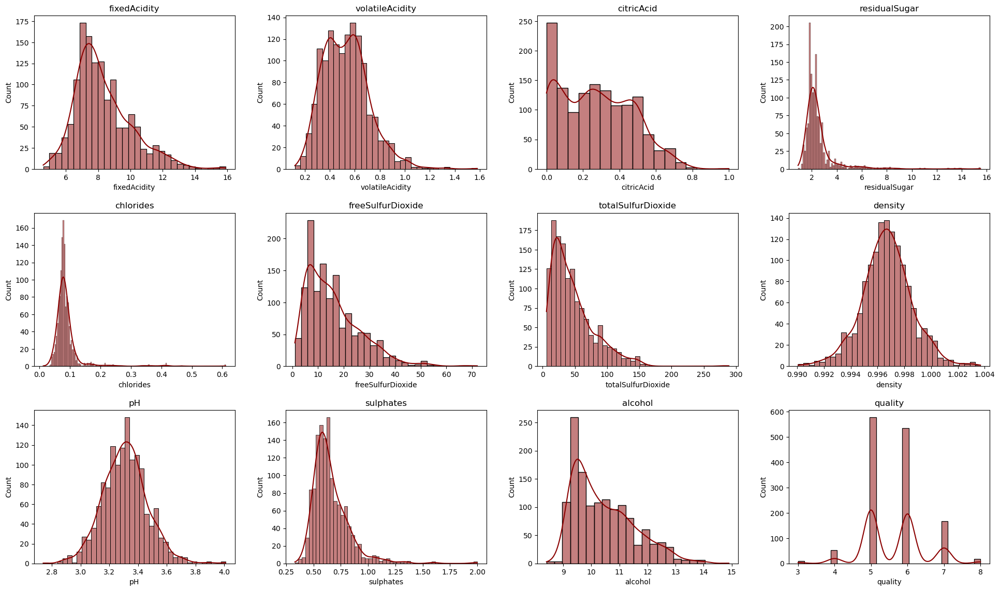

In [10]:
overview(redWine, scheme="red")

From this, we can already obtain some important insights:
- The average wine quality of the 1,359 wine samples is 5.62 out of a possible 8, underscoring the dataset's focus on mid-range wines.
- Essential attributes, such as fixed acidity (8.31), volatile acidity (0.53), and alcohol percentage (10.43), denote the wines' diverse chemical profiles.
- Significant variability in key characteristics, like sulphur dioxide content and acidity levels, points to a wide quality range among the samples.
- The dataset showcases extremes in wine properties, from minimal citric acid presence to alcohol levels peaking at 14.9%, illustrating the vast spectrum of wine compositions.
- Skewness in the distribution of attributes like residual sugar and free sulfur dioxide is evident, indicating that median values differ noticeably from the mean, suggesting a non-uniform distribution of these properties across the samples.

Further, we can also already have a look at the correlations between the given features:

<Axes: >

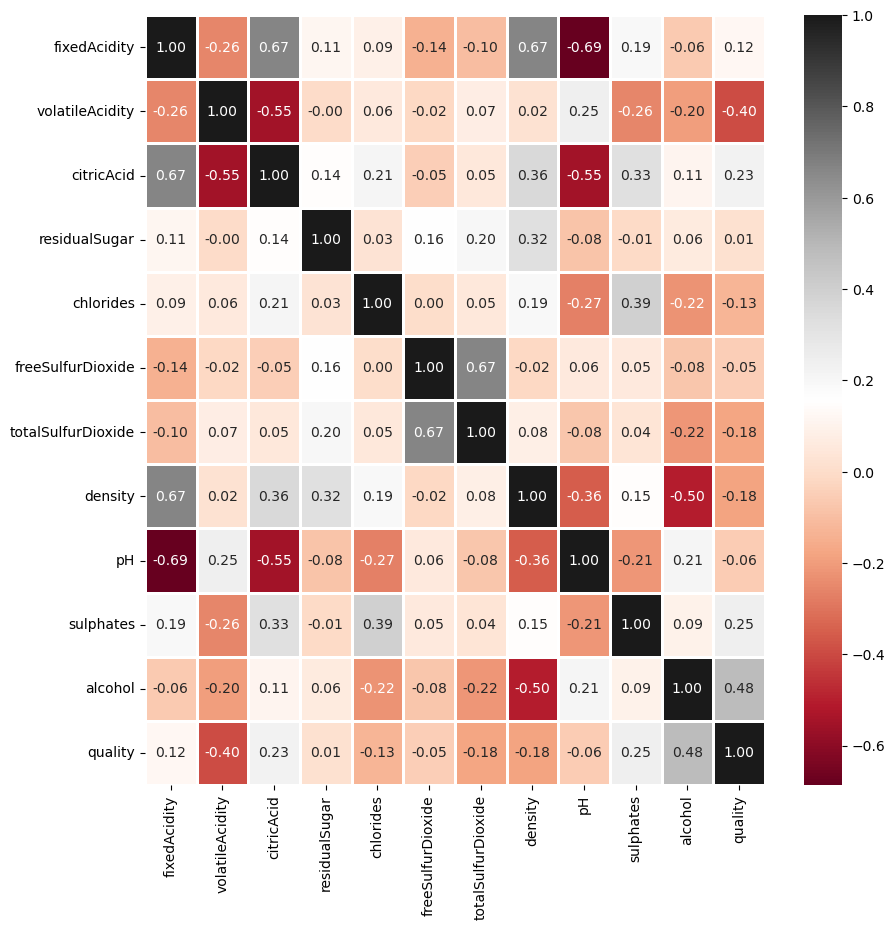

In [11]:
# heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(redWine.corr(), annot=True, cmap='RdGy', fmt='.2f', linewidths=2)

Analyzing the correlation matrix, several key insights emerge.

- **Strong Positive Correlation between Alcohol and Quality**: The most significant positive correlation with wine quality is alcohol content (`0.48`), suggesting that wines with higher alcohol levels tend to be rated as higher quality. This could reflect the body, complexity, or balance that alcohol can bring to wine.

- **Negative Correlation between Volatile Acidity and Quality**: There's a notable negative correlation between volatile acidity and quality (`-0.4`), indicating that higher levels of volatile acidity are generally associated with lower-quality wines. Volatile acidity, which can give a vinegar-like smell, is a key factor negatively impacting the sensory attributes of wine.

- **Positive Relationships with Citric Acid and Sulphates**: Both citric acid (`0.23`) and sulphates (`0.25`) show positive correlations with quality. Citric acid, contributing to the freshness and flavor profile of wine, and sulphates, associated with wine preservation, both play roles in enhancing wine quality.

- **Strong Negative Correlation between pH and Fixed Acidity**: There's a pronounced negative correlation between pH and fixed acidity (`-0.69`). This relationship underscores the fundamental chemistry of wine where higher acidity (measured through fixed acidity) results in a lower pH value, which is indicative of more acidic conditions. This balance is crucial for the wine's flavor profile and stability.

- **Positive Correlation between Fixed Acidity and Citric Acid**: The correlation coefficient between fixed acidity and citric acid (`0.67`) suggests a strong positive relationship. This indicates that wines with higher levels of fixed acidity also tend to have higher levels of citric acid, contributing to the wine's overall acidic backbone and freshness.

- **Relationship between Free Sulfur Dioxide and Total Sulfur Dioxide**: There's a significant positive correlation between free sulfur dioxide and total sulfur dioxide (`0.67`), highlighting that as the total sulfur dioxide in wine increases, the amount of free sulfur dioxide, which is available to protect the wine, also increases. This relationship is important for understanding how sulfur dioxide works in wine preservation.

- **Density and Fixed Acidity**: The correlation between density and fixed acidity (`0.67`) is notably positive. Since density can be influenced by sugar content and alcohol levels, and given that fixed acidity contributes to the overall structure of the wine, this relationship might reflect the interplay between these components in determining the wine's body and mouthfeel.

- **Volatile Acidity and Citric Acid**: The negative correlation between volatile acidity and citric acid (`-0.55`) suggests that wines with higher citric acid levels, which contribute to freshness and stability, tend to have lower levels of volatile acidity. This is beneficial since high volatile acidity can detract from the wine's quality by imparting undesirable vinegar-like aromas.

- **Density and Alcohol**: There's a strong negative correlation between density and alcohol (`-0.5`). As fermentation progresses, sugar is converted into alcohol, reducing the wine's density. This relationship is pivotal in winemaking, as it can influence decisions on fermentation endpoints and wine style.

- **pH and Citric Acid**: A significant negative correlation exists between pH and citric acid (`-0.55`), indicating that higher citric acid content, which contributes to the wine's tartness, is associated with lower pH levels. This interaction is crucial for the acid balance in wine, affecting its taste and microbial stability.
<br>
<br>
------
<br>
<br>
Now, that we have a good overall picture of the data that we will be working with, we can analyse the features further. Instead of looking at each feature individually, we group them into categories reflecting acid content, taste profiles, and preservation characteristics to better understand their collective impact on wine's quality and flavor.

- **Acid Content Features**: Relate to the wine's acidity levels and types, affecting tartness and stability.
- **Taste Profiles Features**: Include alcohol, sugar, and salt levels, influencing the sweetness, body, and overall taste.
- **Preservation Characteristics Features**: Focus on compounds important for wine's shelf life, including sulfates and sulfur dioxide, which protect against oxidation and microbial growth.

Before diving in to those groups, we, however, want to obtain a broad picture of the features in relation with the quality.

<Axes: xlabel='quality'>

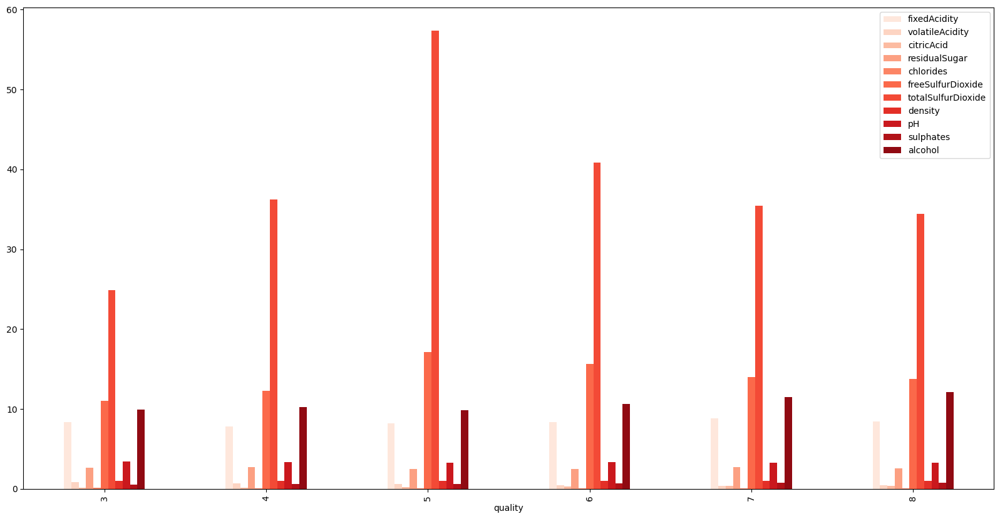

In [12]:
redWine.groupby("quality").mean().plot(kind="bar", figsize=(20, 10), color=sns.color_palette("Reds", redWine.shape[1] - 1))

Interestingly, the graph indicates that the features do not uniformly increase or decrease with quality, implying complex relationships between these chemical properties and perceived wine quality.

Now, we can look at each group, respectively:

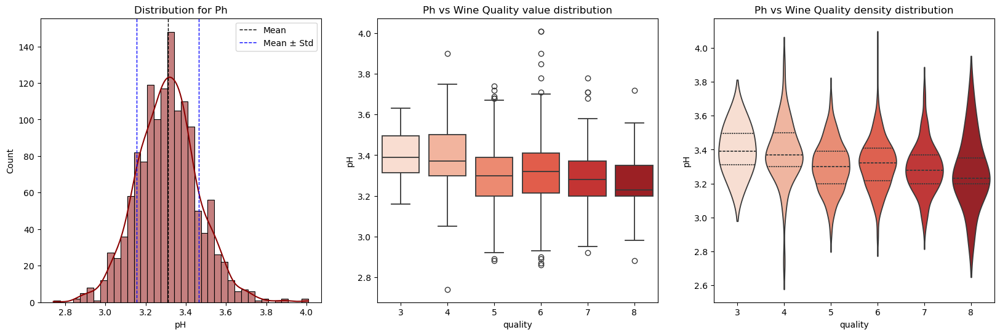

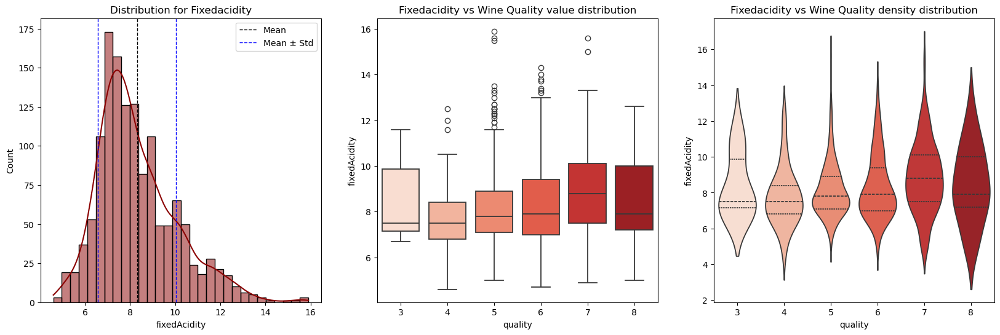

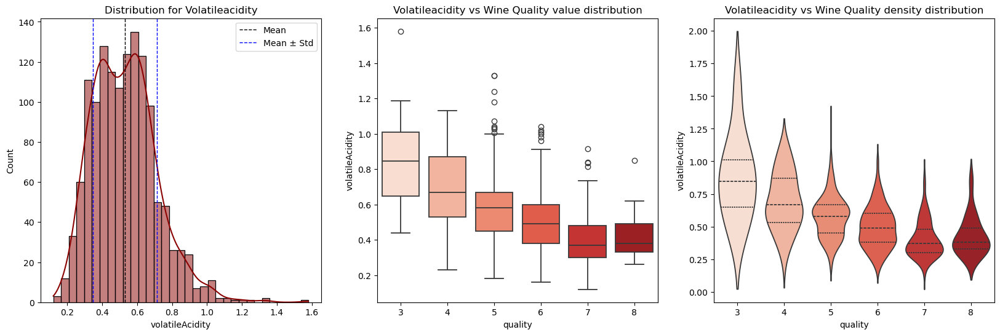

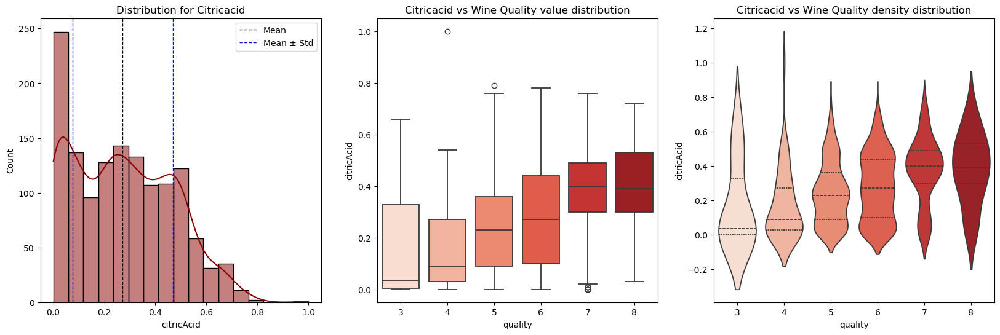

In [13]:
for feature in acid_features:
    plot_feature_single(feature, redWine, wine_type='red')

The *pH* levels depicted in the histogram suggest a bell-shaped distribution around 3.3, aligning with the subtle shift towards lower pH observed in higher-quality wines as seen in the boxplot and the concentrated density in the violin plot for higher quality levels. This complements the negative correlation between pH and fixed acidity in the correlation matrix. 

Moving on to *fixed acidity*, the histogram reveals a right skew, but the boxplot and violin plot indicate a relatively consistent spread across different quality levels, reflecting its weaker correlation with wine quality. 

*Volatile acidity*'s right-skewed histogram confirms most wines have lower values, with the boxplot and violin plot both highlighting a clear trend towards lower volatile acidity in higher-quality wines, which is in line with its significant negative correlation with quality. 

Lastly, *citric acid* displays a right-skewed distribution in the histogram, and the boxplot and violin plot show increasing levels and spread of citric acid with higher quality, corroborating the positive correlation with quality from the correlation matrix.

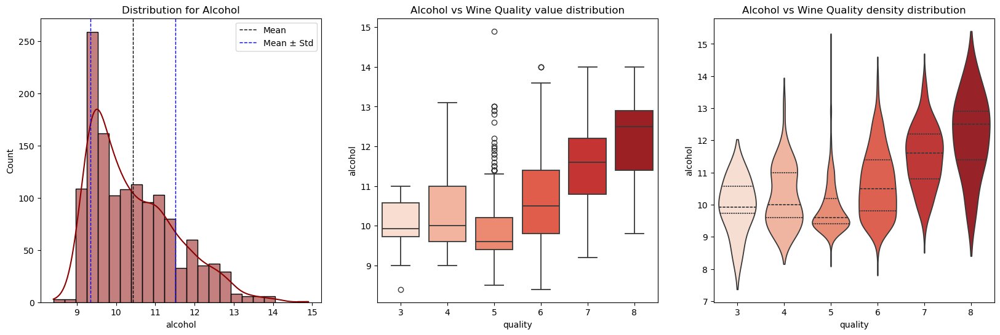

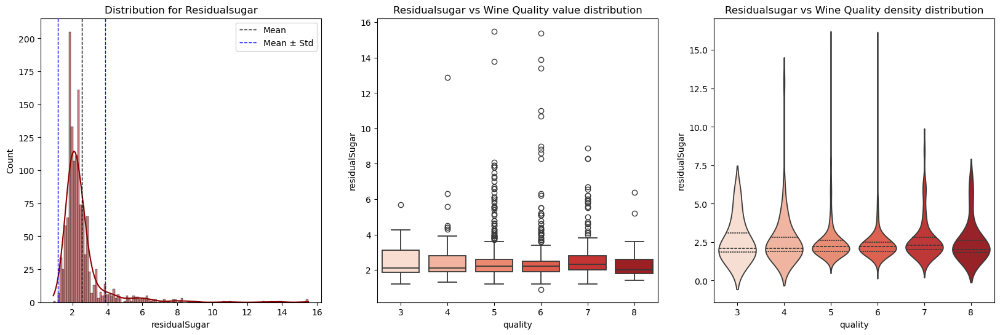

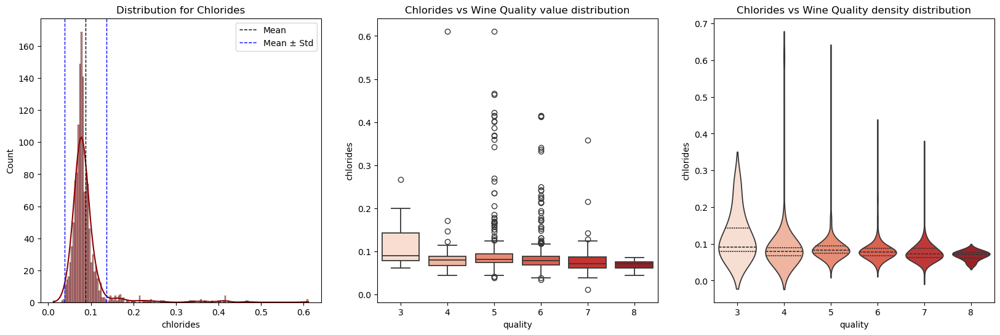

In [14]:
for feature in taste_features:
    plot_feature_single(feature, redWine, wine_type='red')

In the histograms, *alcohol* concentration leans towards lower values but extends significantly towards higher ones, hinting at variation across wines. The boxplots illustrate a clear upward trend of alcohol content with quality, aligning with the correlation matrix that indicates alcohol as the most positively correlated factor with wine quality. The violin plots further accentuate this positive relationship, showing a wider distribution at higher alcohol levels for higher quality wines.

For *residual sugar*, the histogram peaks sharply at lower sugar levels, suggesting most wines have low residual sugar, yet some have much higher levels. The boxplot shows that median residual sugar does not vary significantly with wine quality, which is consistent with the weak correlation observed in the matrix. The violin plots reveal that the density of the residual sugar values does not change dramatically with quality, although there is a slight widening at higher quality levels, indicating a bit more variability in sugar content.

*Chlorides* show a tight concentration at lower levels in the histogram, reflecting a common winemaking trend to limit saltiness. The boxplot indicates that higher quality wines tend to have lower concentrations of chlorides, supporting the correlation-matrix's finding of a negative correlation with quality. The violin plots, meanwhile, illustrate this trend more dramatically, with the highest quality wines showing a narrower distribution for chlorides, indicating a consistency in maintaining low chloride levels in quality wine production.

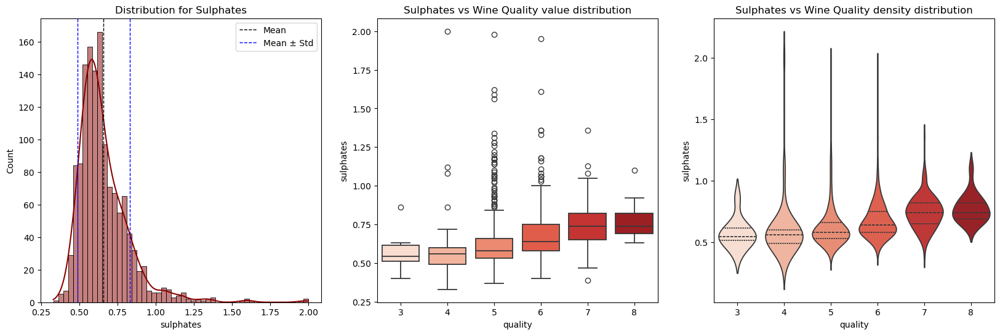

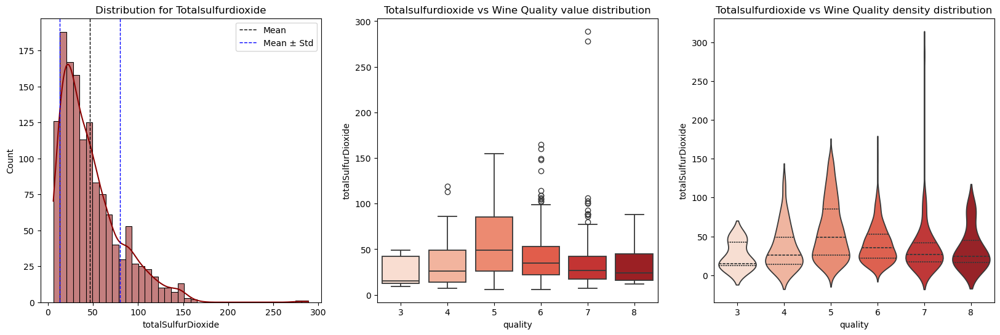

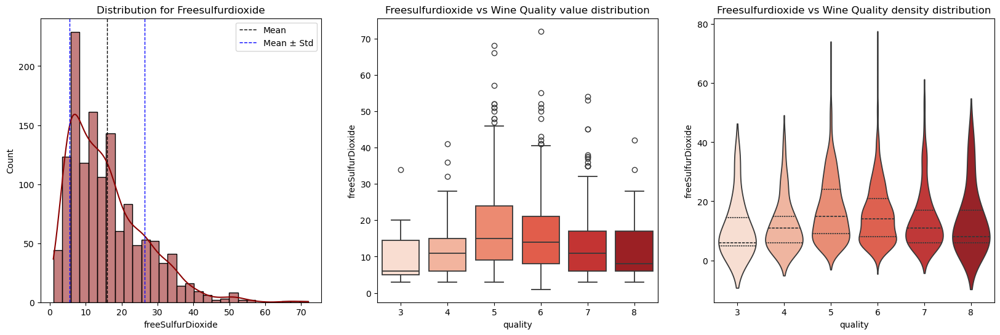

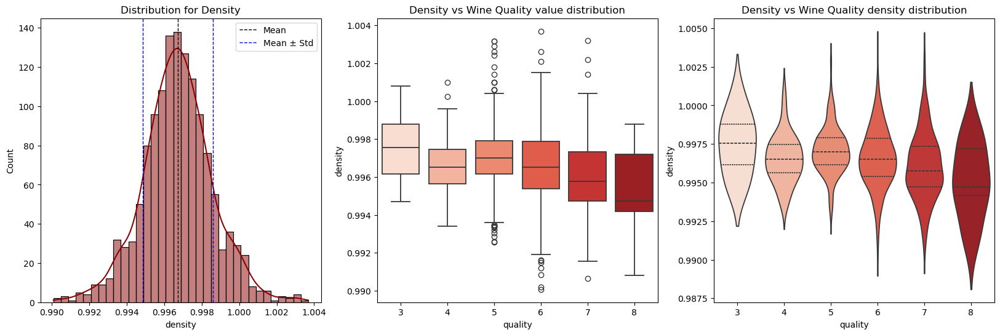

In [15]:
for feature in preservation_features:
    plot_feature_single(feature, redWine, wine_type='red')

The distribution of sulphates across the histograms shows a concentration of lower values, with the boxplot and violin plot revealing a positive trend in median sulphates with increasing wine quality, which is in agreement with the positive correlation with quality shown in the correlation matrix. The spread of sulphates in the violin plot suggests a slight increase in variability for higher-quality wines.

In the total sulfur dioxide graphics, the histogram points to a right-skewed distribution with a tail extending to higher values. The boxplot doesn't display a clear trend across quality ratings, supporting the correlation-matrix's indication of a weak correlation with quality. The violin plot shows a consistent distribution across different quality levels, hinting that total sulfur dioxide might not be a strong differentiator for wine quality on its own.

Free sulfur dioxide's histogram suggests a similar right skew to total sulfur dioxide, with most wines having lower free sulfur dioxide levels. The boxplot and violin plot indicate little to no clear relationship with wine quality, aligning with the weak negative correlation to quality and suggesting that free sulfur dioxide might be more about preservation than quality perception.

Lastly, the density histogram is narrowly peaked, suggesting most wines cluster around a central density value of 0.997. The boxplot indicates that higher quality wines may have slightly lower densities, which corroborates the negative correlation with quality found in the matrix. The violin plot's distribution also narrows with increasing quality, further suggesting that higher quality wines tend to be less dense, possibly due to lower residual sugars or higher alcohol content. 

### White Wine

In [16]:
# Load the white wine dataset
whiteWine = pd.read_csv('wine_data/winequality-white.csv', delimiter=';')

whiteWine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


Again, after having a first glimpse at the dataset, we can see that there are spaces in the variables names, which is not desired at all. Thus, the first action is renaming the columns.

In [17]:
whiteWine.rename(columns = {"fixed acidity": "fixedAcidity", "volatile acidity": "volatileAcidity",
                    "citric acid": "citricAcid", "residual sugar": "residualSugar",
                    "chlorides": "chlorides", "free sulfur dioxide": "freeSulfurDioxide",
                    "total sulfur dioxide": "totalSulfurDioxide"}, inplace = True)

whiteWine.head()

,fixedAcidity,volatileAcidity,citricAcid,residualSugar,chlorides,freeSulfurDioxide,totalSulfurDioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [18]:
# general information
whiteWine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   fixedAcidity        4898 non-null   float64
 1   volatileAcidity     4898 non-null   float64
 2   citricAcid          4898 non-null   float64
 3   residualSugar       4898 non-null   float64
 4   chlorides           4898 non-null   float64
 5   freeSulfurDioxide   4898 non-null   float64
 6   totalSulfurDioxide  4898 non-null   float64
 7   density             4898 non-null   float64
 8   pH                  4898 non-null   float64
 9   sulphates           4898 non-null   float64
 10  alcohol             4898 non-null   float64
 11  quality             4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


Overall, the dataset spans over 4898 rows and 12 columns. Further, it seems that there are no missing values.

In [19]:
# check for missing values
whiteWine.isna().sum()

fixedAcidity          0
volatileAcidity       0
citricAcid            0
residualSugar         0
chlorides             0
freeSulfurDioxide     0
totalSulfurDioxide    0
density               0
pH                    0
sulphates             0
alcohol               0
quality               0
dtype: int64

There are indeed no missing values, implying that the metric **completeness** is given. Thus, we can move on to checking the metric **uniqueness**:

In [20]:
# check for duplicates
print(f"The dataset had {whiteWine.duplicated().sum()} duplicate rows that we removed.")
whiteWine = whiteWine.drop_duplicates()

The dataset had 937 duplicate rows that we removed.


Now, that also all the duplicates are removed, the metric **uniqueness** is given as well. Before going too much into detail, we first want to have an overall picture of the data:

,fixedAcidity,volatileAcidity,citricAcid,residualSugar,chlorides,freeSulfurDioxide,totalSulfurDioxide,density,pH,sulphates,alcohol,quality
count,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000
mean,6.839346,0.280538,0.334332,5.914819,0.045905,34.889169,137.193512,0.993790,3.195458,0.490351,10.589358,5.854835
std,0.866860,0.103437,0.122446,4.861646,0.023103,17.210021,43.129065,0.002905,0.151546,0.113523,1.217076,0.890683
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.600000,0.035000,23.000000,106.000000,0.991620,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,4.700000,0.042000,33.000000,133.000000,0.993500,3.180000,0.480000,10.400000,6.000000
75%,7.300000,0.330000,0.390000,8.900000,0.050000,45.000000,166.000000,0.995710,3.290000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


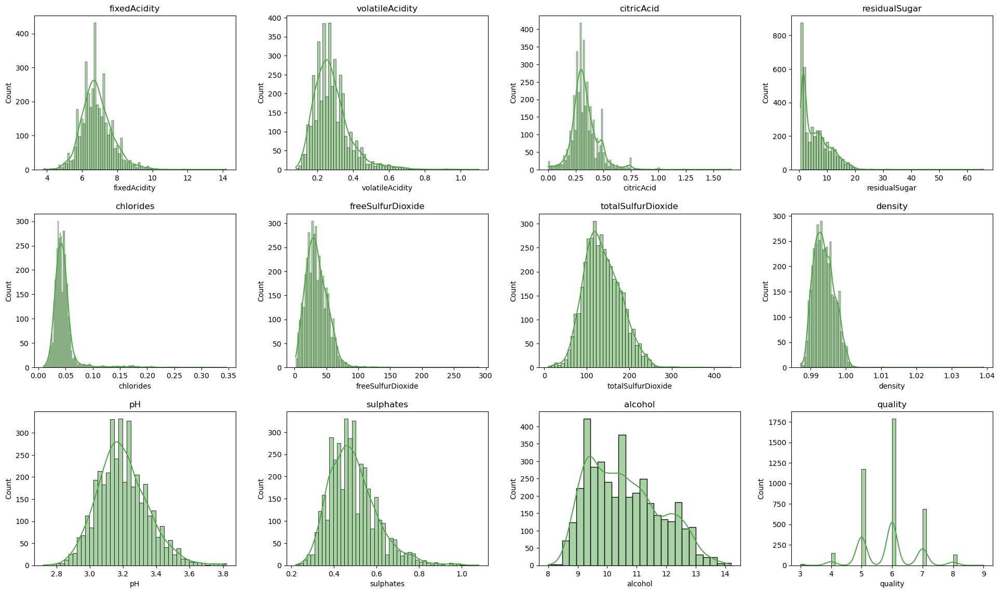

In [21]:
overview(whiteWine, scheme="white")

From this, we can already obtain some important insights:
- The average wine quality of the 4,898 wine samples is 5.85 out of a possible 8, underscoring the dataset's focus on mid-range wines. However, the ratings of white wines is slightly higher than the red wines on point level.
- Essential attributes, such as fixed acidity (6.83), volatile acidity (0.28), and alcohol percentage (10.58), denote the wines' diverse chemical profiles.
- Significant variability in key characteristics, like sulphur dioxide content and acidity levels, points to a wide quality range among the samples.
- The dataset showcases extremes in wine properties, from minimal citric acid presence to alcohol levels peaking at 14.2%, illustrating the vast spectrum of wine compositions.
- Skewness in the distribution of attributes like residual sugar and free sulfur dioxide is evident, indicating that median values differ noticeably from the mean, suggesting a non-uniform distribution of these properties across the samples.

Further, we can also already have a look at the correlations between the given features:

<Axes: >

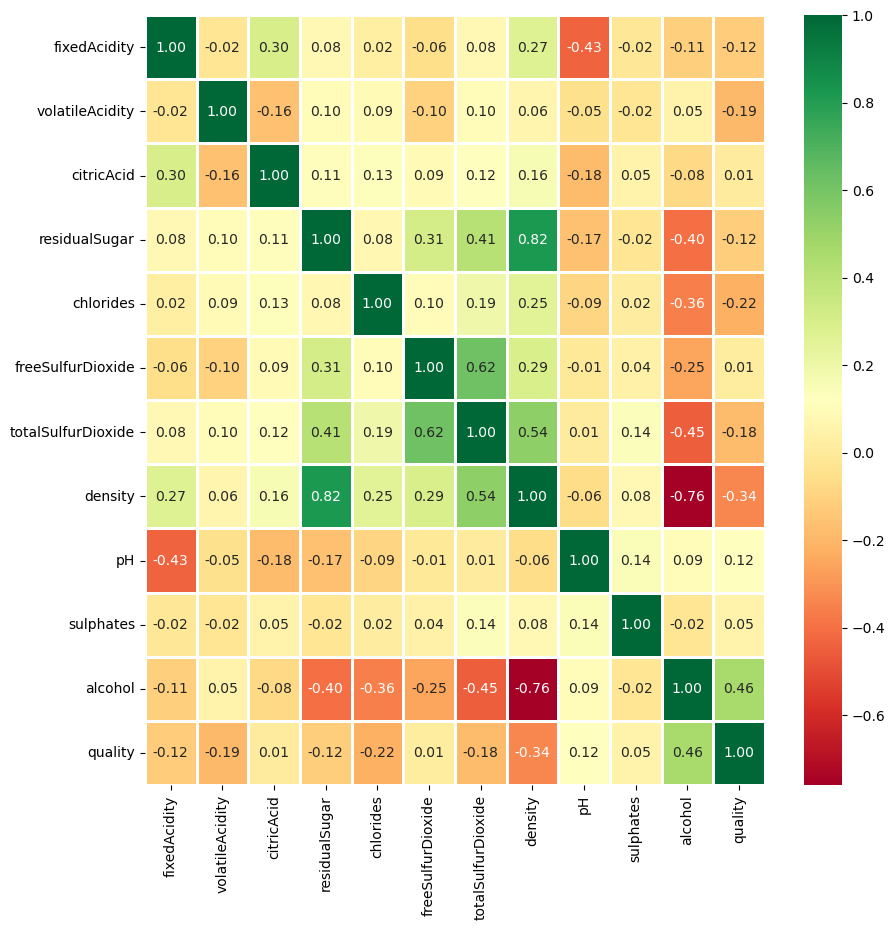

In [22]:
# heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(whiteWine.corr(), annot=True, cmap='RdYlGn', fmt='.2f', linewidths=2)

Analyzing the correlation matrix, several key insights emerge.

- **Strong Positive Correlation between Alcohol and Quality**: The most significant positive correlation with wine quality is alcohol content (`0.46`), suggesting that wines with higher alcohol levels tend to be rated as higher quality. This could reflect the body, complexity, or balance that alcohol can bring to wine.

- **Negative Correlation between Density and Quality**: There's a notable negative correlation between density and quality (`-0.34`), indicating that higher levels of density are generally associated with lower-quality wines. Density, which can affect the color or might indicate the concentration of flavors or the wines age, is a key factor negatively impacting the sensory attributes of wine.

- **Neutral Relationships with Citric Acid and Sulphates**: Both citric acid (`0.01`) and sulphates (`0.05`) show almost neutral correlations with quality. Both, Citric acid, contributing to the freshness and flavor profile of wine, and sulphates, associated with wine preservation, both play roles in enhancing wine quality of white wines and are more frequently enriched with these chemical components.

- **Strong Negative Correlation between pH and Fixed Acidity**: There's a pronounced negative correlation between pH and fixed acidity (`-0.43`). This relationship underscores the fundamental chemistry of wine where higher acidity (measured through fixed acidity) results in a lower pH value, which is indicative of more acidic conditions. This balance is crucial for the wine's flavor profile and stability.

- **Positive Correlation between Fixed Acidity and Citric Acid**: The correlation coefficient between fixed acidity and citric acid (`0.3`) suggests a strong positive relationship. This indicates that wines with higher levels of fixed acidity also tend to have higher levels of citric acid, contributing to the wine's overall acidic backbone and freshness.

- **Relationship between Free Sulfur Dioxide and Total Sulfur Dioxide**: There's a significant positive correlation between free sulfur dioxide and total sulfur dioxide (`0.62`), highlighting that as the total sulfur dioxide in wine increases, the amount of free sulfur dioxide, which is available to protect the wine, also increases. This relationship is important for understanding how sulfur dioxide works in wine preservation.

- **Density and Residual sugar**: The correlation between density and residual sugar (`0.82`) is notably positive. Since density can be influenced by sugar content and alcohol levels, and given that residual sugar contributes to the overall structure of the wine including the density in terms of color and viscosity, this relationship might reflect the interplay between these components in determining the wine's taste and mouthfeel.

- **Density and Alcohol**: There's a strong negative correlation between density and alcohol (`-0.76`). As fermentation progresses, sugar is converted into alcohol, reducing the wine's density. This relationship is pivotal in winemaking, as it can influence decisions on fermentation endpoints and wine style.

- **Alcohol and Residual Sugar and Total Sulfur Dioxide**: The correlation between alcohol and residual sugar (`0.40`), residual sugar and total sulfur dioxide (`0.41`) and alcohol and total sulfur dioxide (`-0.45`) is notably positive/positive/negative. This relationship might reflect the interplay between these components in determining the wine's longevity after fermentation as well as the preservation of rediual sugars for storage.
<br>
<br>
------
<br>
<br>

Now, that we have a good overall picture of the data that we will be working with, we can analyse the features further. Instead of looking at each feature individually, we, again, group them into categories reflecting acid content, taste profiles, and preservation characteristics to better understand their collective impact on wine's quality and flavor.

- **Acid Content Features**: Relate to the wine's acidity levels and types, affecting tartness and stability.
- **Taste Profiles Features**: Include alcohol, sugar, and salt levels, influencing the sweetness, body, and overall taste.
- **Preservation Characteristics Features**: Focus on compounds important for wine's shelf life, including sulfates and sulfur dioxide, which protect against oxidation and microbial growth.

Just like before, we want to obtain a broad picture of the features in relation with the quality prior to diving in to those groups.

<Axes: xlabel='quality'>

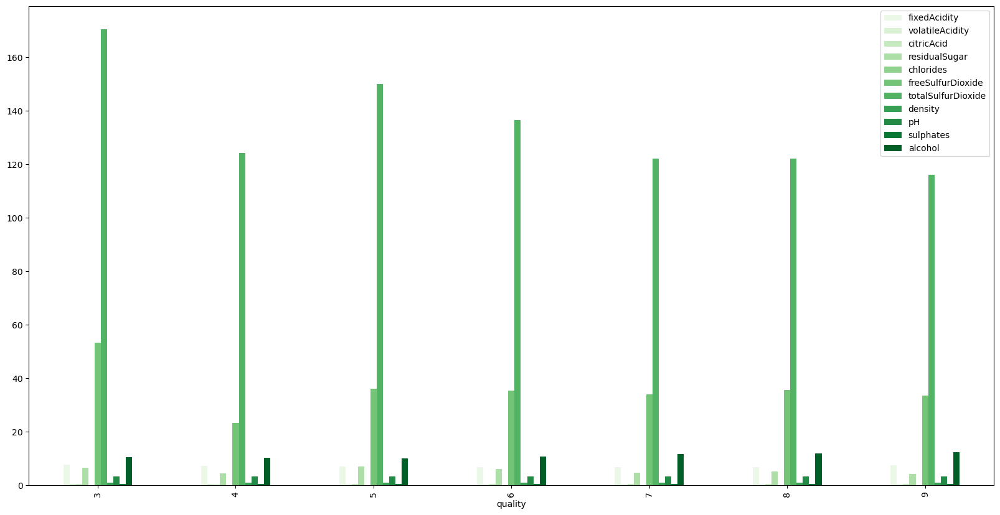

In [23]:
whiteWine.groupby("quality").mean().plot(kind="bar", figsize=(20, 10), color=sns.color_palette("Greens", whiteWine.shape[1] - 1))

Again, the graph indicates that the features do not uniformly increase or decrease with quality, implying complex relationships between these chemical properties and perceived wine quality.

Now, we can look again at each group, respectively.

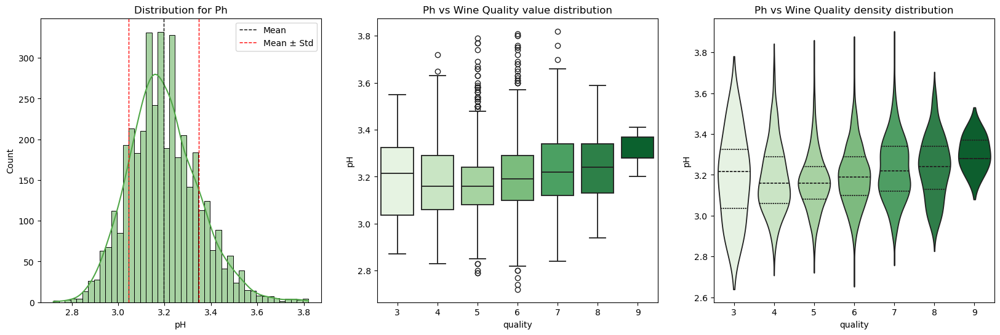

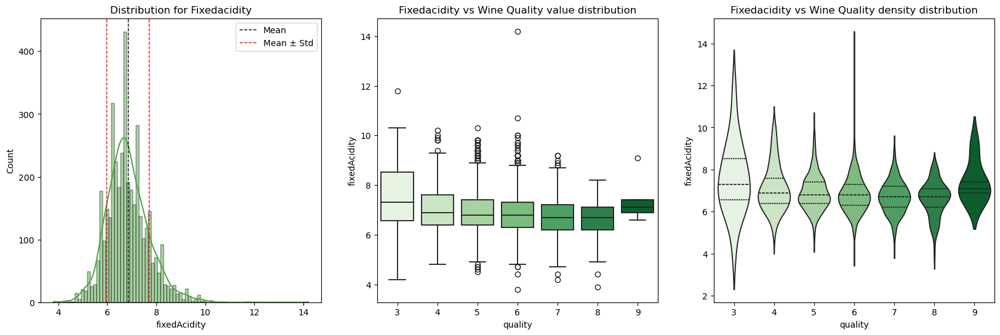

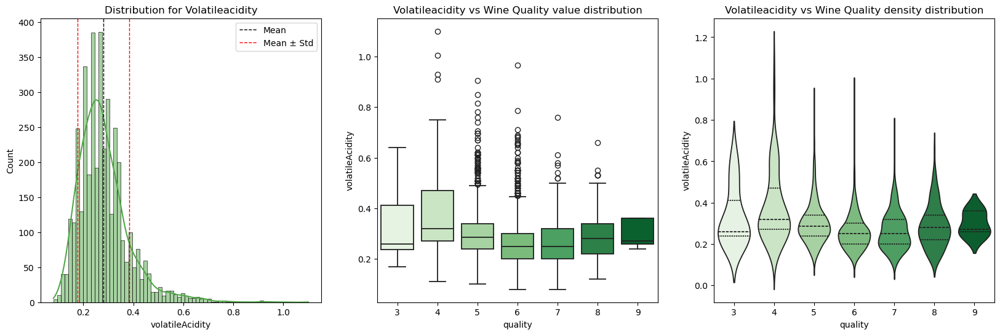

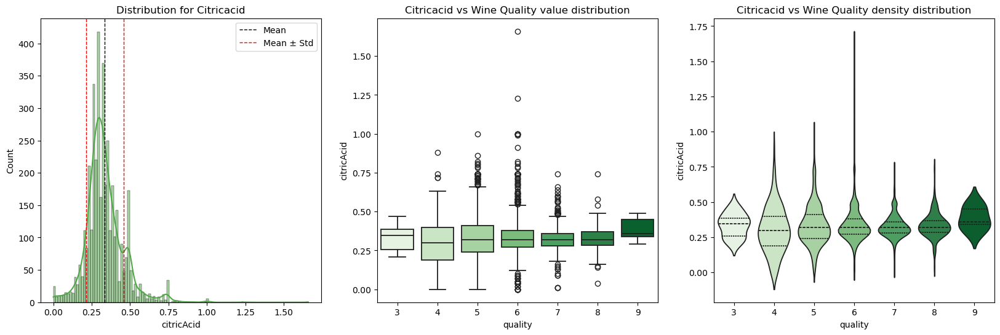

In [24]:
for feature in acid_features:
    plot_feature_single(feature, whiteWine, wine_type='white')

The *pH* levels depicted in the histogram suggest a bell-shaped distribution around 3.2, aligning with the subtle shift towards higher pH observed in higher-quality wines as seen in the boxplot and the concentrated density in the violin plot for higher quality levels. This complements the negative correlation between pH and fixed acidity in the correlation matrix. 

Moving on to *fixed acidity*, the histogram reveals a right skew, but the boxplot and violin plot indicate a relatively consistent spread across different quality levels, reflecting its weaker correlation with wine quality. 

*Volatile acidity*'s right-skewed histogram confirms most wines have lower values, with the boxplot and violin plot both highlighting a clear trend towards lower volatile acidity in mid-quality wines, which is in line with its less-significant negative to neutral correlation with quality. 

Lastly, *citric acid* displays a right-skewed distribution in the histogram, and the boxplot and violin plot show almost constant levels and spread of citric acid over different quality levels, corroborating the almost neutral correlation with quality from the correlation matrix.

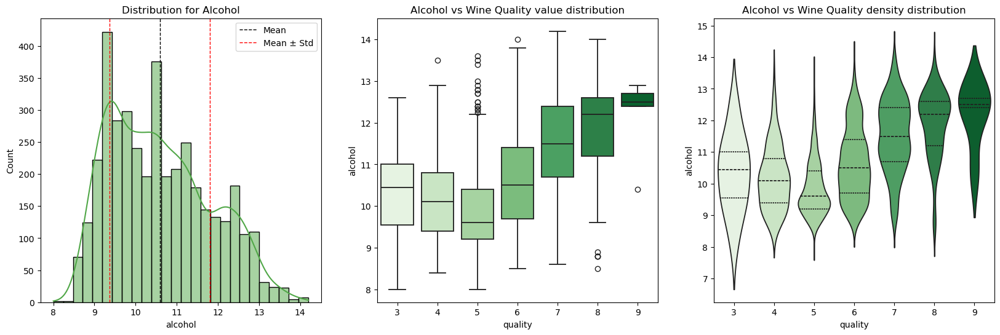

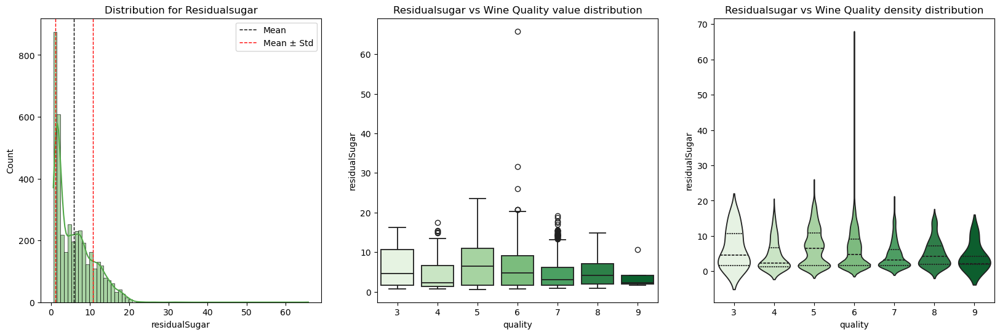

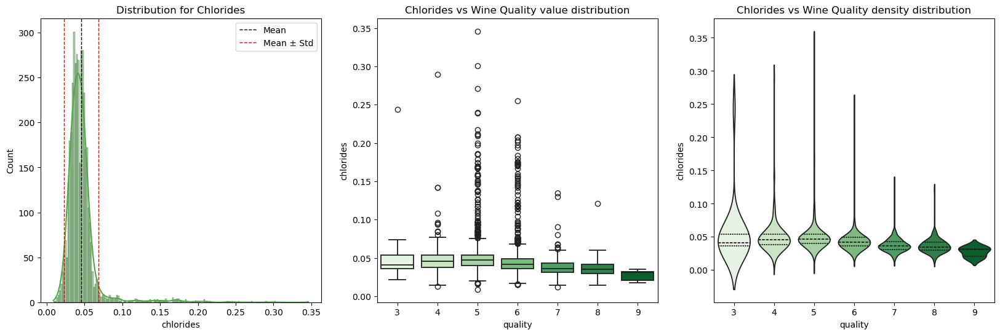

In [25]:
for feature in taste_features:
    plot_feature_single(feature, whiteWine, wine_type='white')

In the histograms, *alcohol* concentration leans towards lower values but extends significantly towards higher ones, hinting at variation across wines. The boxplots illustrate a clear upward trend of alcohol content with quality, aligning with the correlation matrix that indicates alcohol as the most positively correlated factor with wine quality. The violin plots further accentuate this positive relationship, showing a wider distribution at higher alcohol levels for higher quality wines.

For *residual sugar*, the histogram peaks sharply at lower sugar levels, suggesting most wines have low residual sugar, yet some have much higher levels. The boxplot shows that median residual sugar does not vary significantly with wine quality, which is consistent with the weak correlation observed in the matrix. The violin plots reveal that the density of the residual sugar values does not change dramatically with quality, although there is a slight concentration at higher quality levels, indicating a bit more variability and concentration towards lower values in sugar content.

*Chlorides* show a tight concentration at lower levels in the histogram, reflecting a common winemaking trend to limit saltiness. The boxplot indicates that higher quality wines tend to have lower concentrations of chlorides, supporting the correlation-matrix's finding of a negative correlation with quality. The violin plots, meanwhile, illustrate this trend more dramatically, with the highest quality wines showing a narrower distribution for chlorides and tighter density distribution at lower chlorides, indicating a consistency in maintaining low chloride levels in quality wine production.

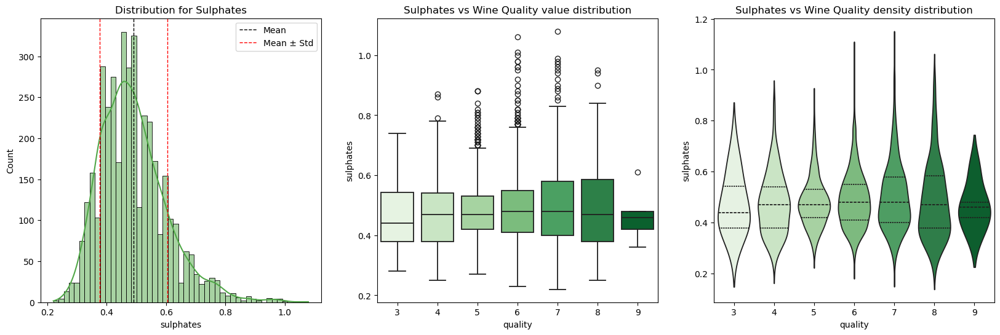

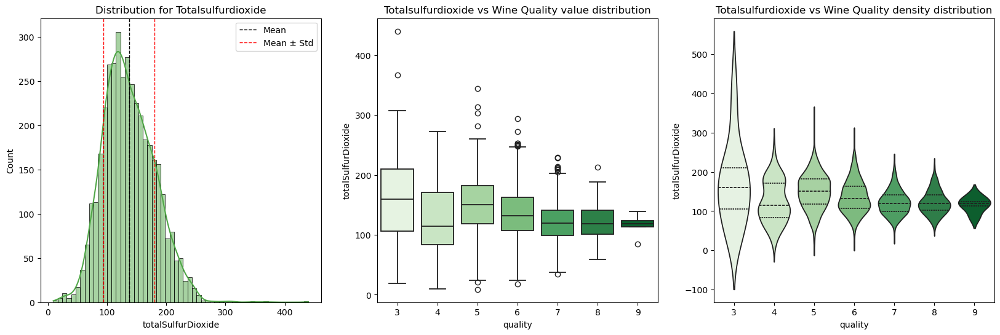

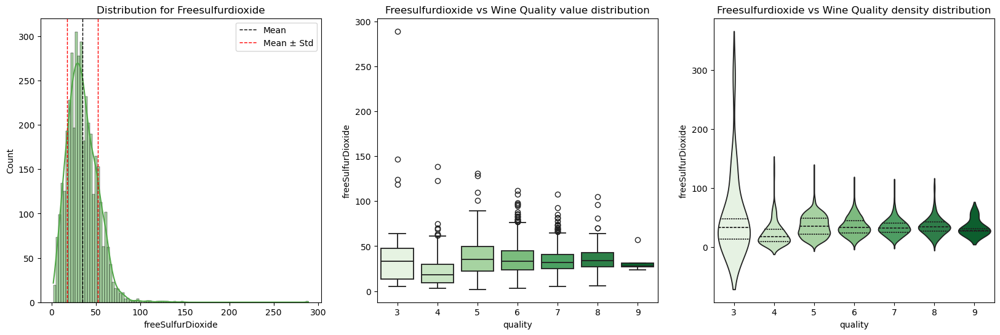

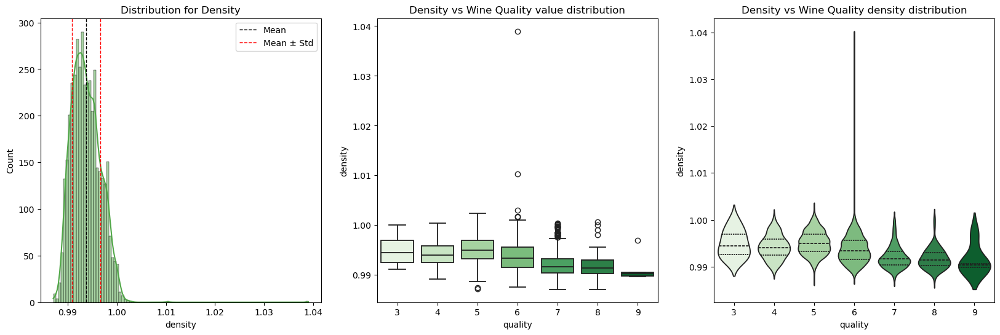

In [26]:
for feature in preservation_features:
    plot_feature_single(feature, whiteWine, wine_type='white')

The distribution of sulphates across the histograms shows a concentration of values around `0.45`, with the boxplot and violin plot revealing a trend in median sulphates with increasing wine quality, which is in agreement with the close to neutral correlation with quality shown in the correlation matrix. The concentration of sulphates in the violin plot suggests a slight decrease in variability for higher-quality wines.

In the total sulfur dioxide graphics, the histogram points to a right-skewed distribution with a tail extending to higher values. The boxplot displays a clear trend across quality ratings towards values slightly above `110` for Total Sulfur Dioxide, supporting the correlation-matrix's indication of a weak correlation with quality. The violin plot shows a concentrated distribution towards higher quality levels, hinting that total sulfur dioxide at a certain level might be a strong differentiator for wine quality of white wines on its own.

Free sulfur dioxide's histogram suggests a similar right skew to total sulfur dioxide, with most wines having lower free sulfur dioxide levels. The boxplot and violin plot indicate little to no clear relationship with wine quality, aligning with the neutral correlation to quality and suggesting that free sulfur dioxide might be more about preservation than quality perception.

Lastly, the density histogram is narrowly peaked, suggesting most wines cluster around a central density value of `0.997`. The boxplot indicates that higher quality wines may have slightly lower densities, which corroborates the negative correlation with quality found in the matrix. The violin plot's distribution also narrows with increasing quality, further suggesting that higher quality wines tend to be less dense, possibly due to lower residual sugars or higher alcohol content. 

### Red vs White Wine

#### Adding the color as binary feature

In [27]:
redWine["color"] = "red"
redWine.head()

,fixedAcidity,volatileAcidity,citricAcid,residualSugar,chlorides,freeSulfurDioxide,totalSulfurDioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,red


In [28]:
whiteWine["color"] = "white"
whiteWine.head()

,fixedAcidity,volatileAcidity,citricAcid,residualSugar,chlorides,freeSulfurDioxide,totalSulfurDioxide,density,pH,sulphates,alcohol,quality,color
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,white
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,white
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,white
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,white
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6,white


In [29]:
# merge the two datasets
wine = pd.concat([redWine, whiteWine], axis=0)

In [30]:
# shuffle the dataset
wine = wine.sample(frac=1).reset_index(drop=True)
wine.head()

,fixedAcidity,volatileAcidity,citricAcid,residualSugar,chlorides,freeSulfurDioxide,totalSulfurDioxide,density,pH,sulphates,alcohol,quality,color
0,6.8,0.20,0.25,6.2,0.052,22.0,106.0,0.99350,3.09,0.54,10.8,5,white
1,7.1,0.21,0.30,1.4,0.037,45.0,143.0,0.99320,3.13,0.33,9.9,6,white
2,6.6,0.46,0.49,7.4,0.052,19.0,184.0,0.99560,3.11,0.38,9.0,5,white
3,6.6,0.22,0.37,15.4,0.035,62.0,153.0,0.99845,3.02,0.40,9.3,5,white
4,7.8,0.18,0.31,12.2,0.053,46.0,140.0,0.99800,3.06,0.53,8.9,6,white


In [31]:
# general information
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5320 entries, 0 to 5319
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   fixedAcidity        5320 non-null   float64
 1   volatileAcidity     5320 non-null   float64
 2   citricAcid          5320 non-null   float64
 3   residualSugar       5320 non-null   float64
 4   chlorides           5320 non-null   float64
 5   freeSulfurDioxide   5320 non-null   float64
 6   totalSulfurDioxide  5320 non-null   float64
 7   density             5320 non-null   float64
 8   pH                  5320 non-null   float64
 9   sulphates           5320 non-null   float64
 10  alcohol             5320 non-null   float64
 11  quality             5320 non-null   int64  
 12  color               5320 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 540.4+ KB


In [32]:
# check for missing values
wine.isna().sum()

fixedAcidity          0
volatileAcidity       0
citricAcid            0
residualSugar         0
chlorides             0
freeSulfurDioxide     0
totalSulfurDioxide    0
density               0
pH                    0
sulphates             0
alcohol               0
quality               0
color                 0
dtype: int64

In [33]:
# check for duplicates
print(f"The dataset had {wine.duplicated().sum()} duplicate rows that we removed.")
wine = wine.drop_duplicates()

The dataset had 0 duplicate rows that we removed.


White wines: 3961 (74.45%)
Red wines: 1359 (25.55%)


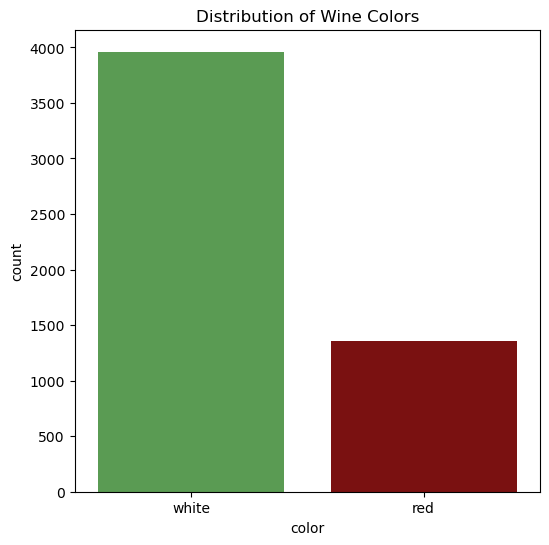

In [34]:
# check distribution of wine colors
# percentage white wines
white_wines = wine[wine.color == 'white']
white_wines_count = white_wines.shape[0]
total_wines = wine.shape[0]
white_wines_percentage = (white_wines_count / total_wines) * 100
print(f"White wines: {white_wines_count} ({white_wines_percentage:.2f}%)")
print(f"Red wines: {total_wines-white_wines_count} ({(1-(white_wines_count/total_wines))*100:.2f}%)")

plt.figure(figsize=(6, 6))
sns.countplot(x='color', data=wine, palette={"red": wine_red_color, "white": wine_white_color}, legend=False, hue='color')
plt.title('Distribution of Wine Colors')

plt.show()

The merged dataset spans over 6497 rows and 13 columns, with no missing values or duplicates. The distribution of wine colors is rather inbalanced, with white wines outnumbering red wines by 200%.

Next, we want to see whether there is a difference in the quality distribution of the two wine types:

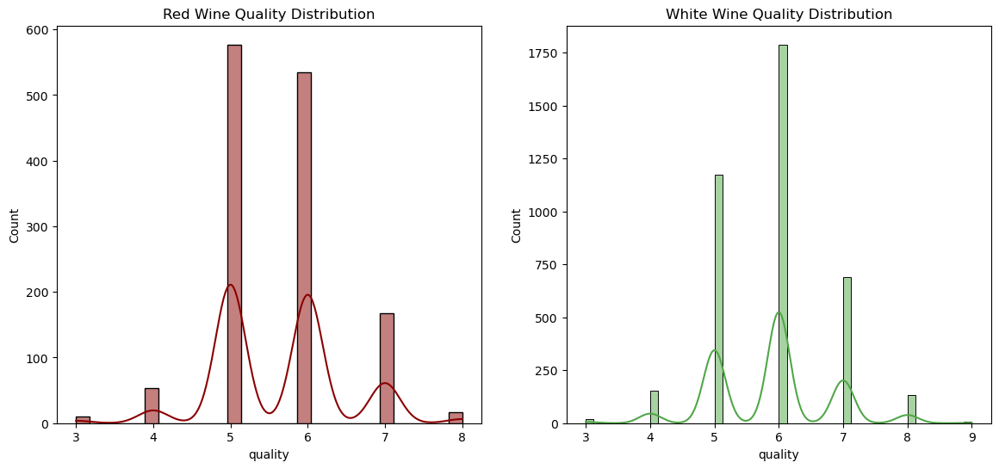

In [35]:
# compare the two datasets within one plot
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.histplot(redWine['quality'], kde=True, ax=axes[0], color=wine_red_color, label='Red Wine')
sns.histplot(whiteWine['quality'], kde=True, ax=axes[1], color=wine_white_color, label='White Wine')

axes[0].set_title('Red Wine Quality Distribution')
axes[1].set_title('White Wine Quality Distribution')
plt.show()

After looking at the quality distribution of the two wine types, we decided to opt for binning the quality ratings into the following bins: 'low' (0-4), 'medium' (5-6), and 'high' (7-10). This binning strategy simplifies the dataset, making it more digestible and allowing for a clear delineation between distinct levels of wine quality. It reflects the natural distribution of the ratings, capturing the bulk of data within the 'medium' range and appropriately categorizing the less common 'low' and 'high' quality wines. This method facilitates a more intuitive analysis and interpretation of wine quality in relation to their chemical characteristics.

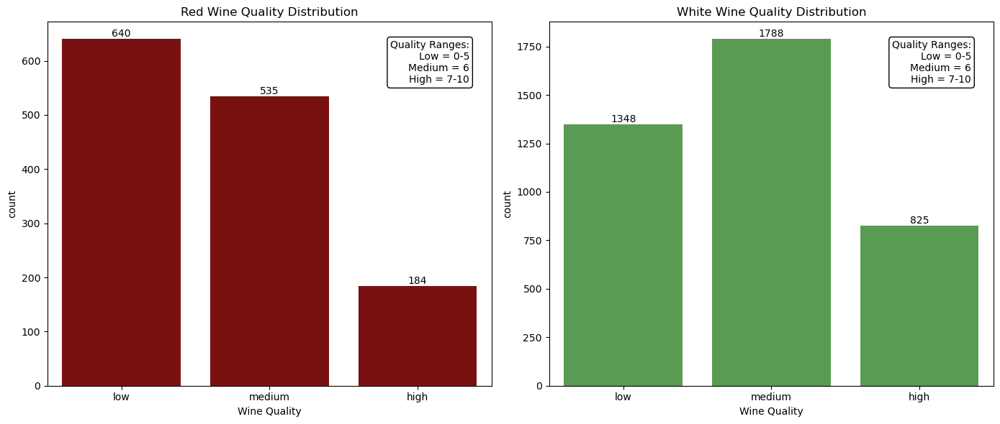

In [36]:
# adding new column for wine quality  as bucket low (0 - 5), medium (6) and high (7 - 10)
wine['quality_label'] = wine.quality.apply(lambda q: 'low' if q <= 5 else 'medium' if q <= 6 else 'high')

# convert the quality label to a categorical type
wine['quality_label'] = pd.Categorical(wine['quality_label'], categories=['low', 'medium', 'high'], ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plotting Red Wine
ax_red = sns.countplot(x='quality_label', data=wine[wine['color'] == 'red'], ax=axes[0], color=wine_red_color, order=['low', 'medium', 'high'])
ax_red.set_title('Red Wine Quality Distribution')
ax_red.set_xlabel('Wine Quality')
ax_red.bar_label(ax_red.containers[0])

# Plotting White Wine
ax_white = sns.countplot(x='quality_label', data=wine[wine['color'] == 'white'], ax=axes[1], color=wine_white_color, order=['low', 'medium', 'high'])
ax_white.set_title('White Wine Quality Distribution')
ax_white.set_xlabel('Wine Quality')
ax_white.bar_label(ax_white.containers[0])

# Adding annotations for quality definitions
for ax in axes:
    ax.annotate('Quality Ranges:\nLow = 0-5\nMedium = 6\nHigh = 7-10', xy=(0.95, 0.95), xycoords='axes fraction', 
                fontsize=10, ha='right', va='top', 
                bbox=dict(boxstyle='round', fc='w', ec='k'))

plt.tight_layout()
plt.show()

# transform quality_label to numerical values, such that low = -1, medium = 0 and high = 1
wine['quality_label'] = wine['quality_label'].map({'low': 0, 'medium': 1, 'high': 2})


The distribution of quality ratings for red and white wines exhibits clear trends within the dataset. For red wine, the 'medium' quality category contains the majority of instances, with 1112 occurrences, indicating that most red wines are rated within this average range. The 'low' quality category is least represented with 63 samples, and the 'high' quality range, while also less common, has 184 instances.

The white wine dataset, which is larger in size, also predominantly falls into the 'medium' quality category with 2963 occurrences. The 'low' quality category has a significantly lower count with 173 samples, whereas the 'high' quality category, although the least frequent for white wines as well, comprises a notable 825 instances.

When comparing the two wine types, both display fewer samples in the 'high' quality range, yet the proportion of high-quality ratings is comparatively larger for white wines, which may suggest a tendency towards a higher perceived quality.

In the following, the wine types will be compared in terms of their chemical composition for each component grouping and quality ratings. 

#### PH and Acidity related features

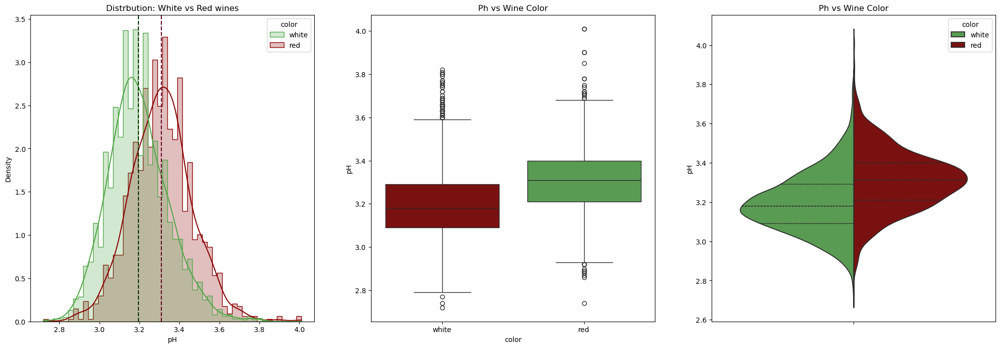

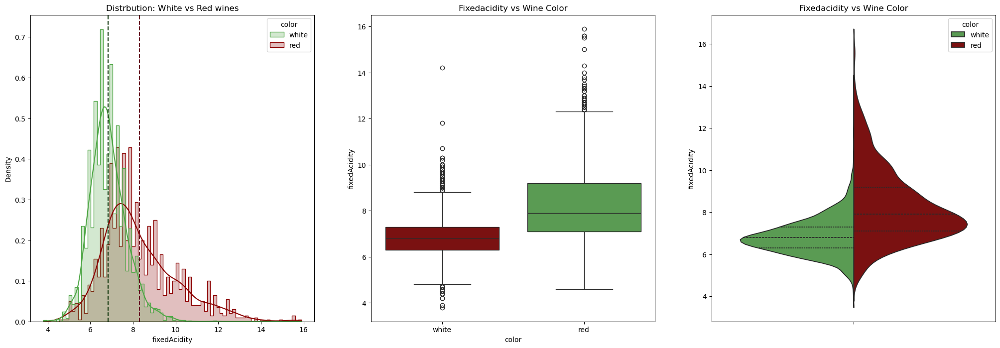

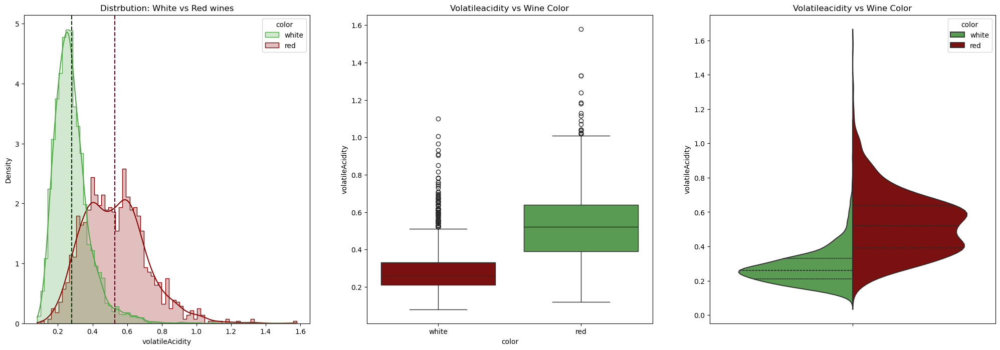

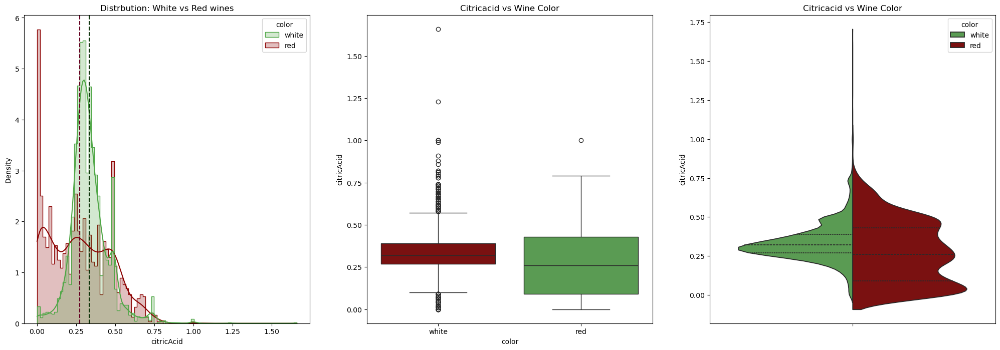

In [37]:
for i, feature in enumerate(acid_features):
    plot_feature(feature, wine)

*PH*: According to the density distribution for the pH levels, red wines have a slightly higher median pH level than white wines. The boxplot and violin plot confirm this, althoug both categories show similar shapes of densities and distribution of different ph levels overall. However, as the pH levels are almost below a level of 7, the wines are considered to be acidic liquids rather than basic ones.

*Fixed Acidity*: The histogram shows that both red and white wines have a concentration of lower fixed acidity levels, with white wines having slightly lower concentrations overall. The white wines are more concentrated around the median while the red wines have a wider distribution. The boxplot and violin plot indicate that red wines have a slightly higher median fixed acidity level. Fixed acidity is a key component of wine, contributing to its structure and taste. The histograms show both wine types typically have lower fixed acidity levels, with white wines having slightly lower concentrations. The boxplot and violin plot show red wines have a higher median fixed acidity level, which might relate to the different processing of red wines, which involves longer contact with the grape skins where these compounds can be more prevalent.

*Volatile Acidity*: In regard to volatile acidity, the white wines seem to have a slightly lower volatile acitric characteristic generally and seem to be far more concentrated around the median value of `0.28`. Red wines on the other hand seem to have a wider distribution of volatile acidity levels, with a slightly higher median value of `0.29`. The boxplot and violin plot confirm this observation, showing a slightly higher median volatile acidity level for red wines. Volatile acidity, which can give a vinegar-like smell, is a key factor negatively impacting the sensory attributes of wine. The histograms show both wine types typically have lower volatile acidity levels, with white wines having slightly lower concentrations. The boxplot and violin plot show red wines have a higher median volatile acidity level, with a multiple maxima in the distribution of volatile acidity levels.

*Citric Acid*: The histogram shows that white wines have a concentration of citric acid levels around the median. The white wines are more concentrated around the median while the red wines have a wider distribution. The boxplot and violin plot indicate that red wines have a slightly lower median citric acid level, although they showcase both higher and lower levels overall in comparison to white wines. Citric acid, which contributes to the freshness and flavor profile of wine, is a key component of wine. the concentration of white wines around the median showcases that variating citric acid levels are not common in white wines while red wines have a wider distribution of citric acid levels indicating that winemakers seem to experiment more with this characteristic.

#### Taste related features

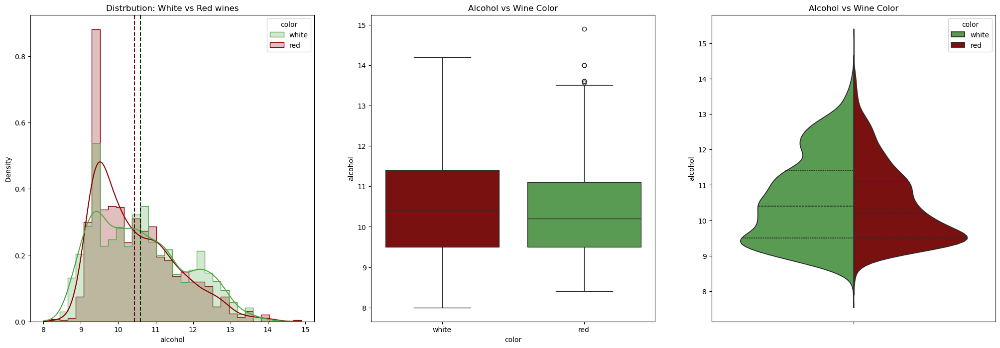

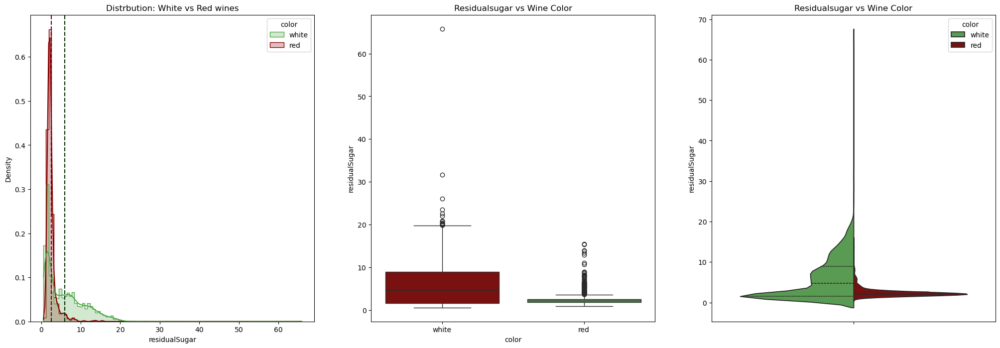

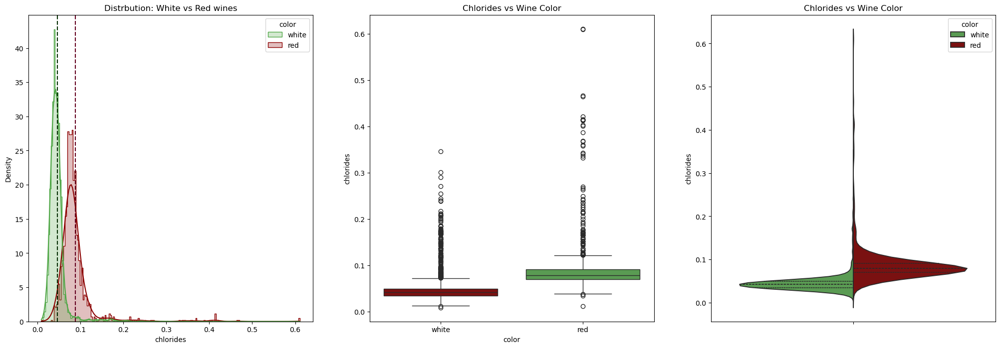

In [38]:
for i, feature in enumerate(taste_features):
    plot_feature(feature, wine)

*Alcohol Content*: The histogram with KDE is suggesting that white wine generally has a slightly  higher alcohol content. Looking at the boxplot and the violin plot, both types of wine don't show clear differences towards the alcohol content.

*Residual Sugar*: For residual sugar, red wines show a higher concentration of lower sugar levels, while white wines have a more even distribution. The boxplot and violin plot show that white wines have a slightly higher median residual sugar level, but the distribution is more concentrated around the median for red wines. The violin plot also indicates that white wines have a wider distribution of residual sugar levels overall and span from very low to very high degrees of residual sugar. This distribution corresponds to the fact that Red wines generally have lower residual sugar levels, which corresponds with the common production of red wines in a dry style. White wines, on the other hand, are often produced in both dry and sweet styles, which could explain the wider distribution of sugar levels.
The wider range in residual sugars for white wines indicates a diversity in winemaking styles for whites, from dry to sweet, whereas reds are more consistently dry.

*Chlorides*: The histogram shows that both red and white wines have a concentration of lower chloride levels with white wines having slightly lower concentrations overall. The boxplot and violin plot indicate that red wines have a slightly higher median chloride level. Chlorides in wine, indicative of salt content, can influence flavor and are affected by factors like soil type and grape variety. The histograms show both wine types typically have lower chloride levels, with white wines having slightly lower concentrations. This might be linked to the terroir where white wine grapes are cultivated or the grape varieties themselves. The boxplot and violin plot show red wines have a higher median chloride level, which might relate to the different processing of red wines, which involves longer contact with the grape skins where these compounds can be more prevalent.

Each of these characteristics - alcohol content, residual sugar, and chlorides - reflects decisions made during the grape growing and winemaking process that are tailored to the typical profiles of red and white wines. For instance, the winemaker's choice in the fermentation process can lead to higher alcohol in whites or the preservation of more natural sugar in reds. The variation within each type is due to the diversity of grape varieties, regional winemaking styles, and consumer preferences.

#### Preservation related features

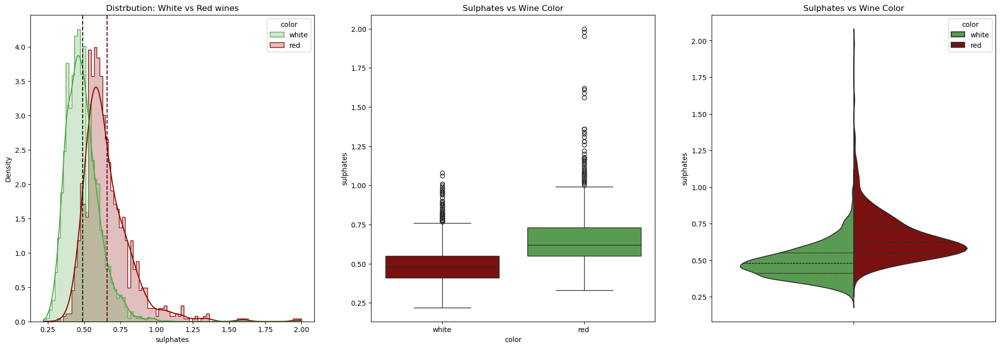

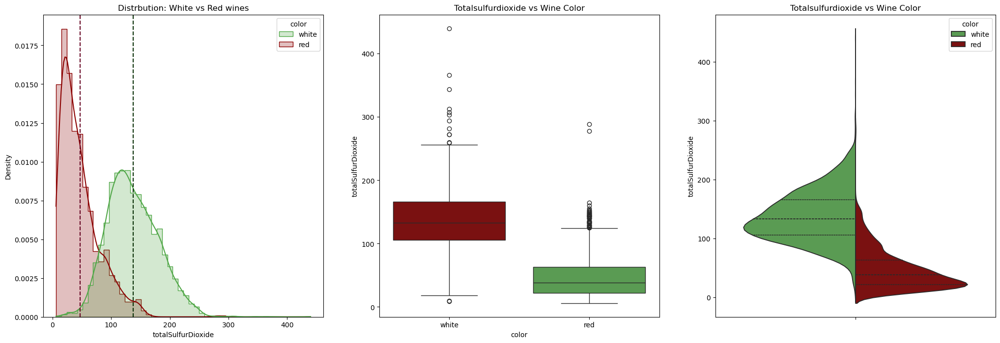

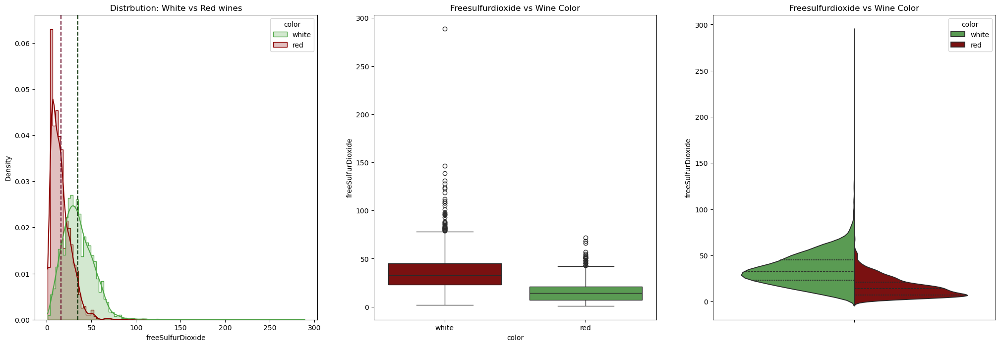

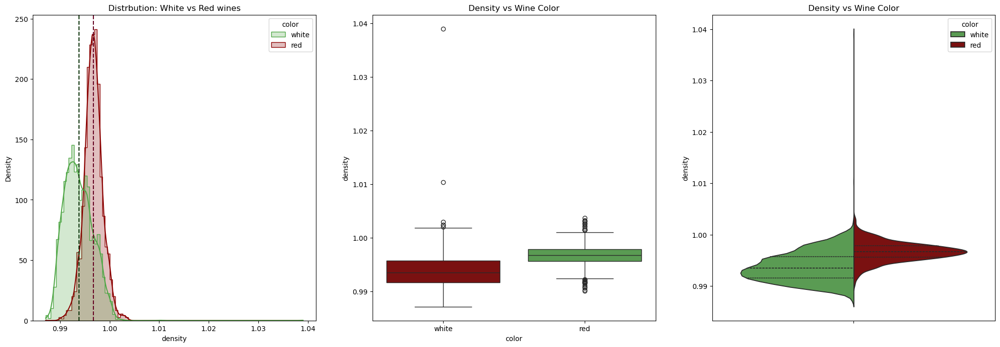

In [39]:
for i, feature in enumerate(preservation_features):
    plot_feature(feature, wine)

Although white wines show a generally lower concentration of sulfates, the amount of total and free sulfur dioxide, which are important for wine preservation, is higher in white wines. The boxplot and violin plot show that white wines have a higher median total sulfur dioxide level, while red wines show a very low level of total and free sulfur dioxide. The violin plot also indicates that white wines have a wider distribution of total sulfur dioxide levels overall and span from very low to very high degrees of total sulfur dioxide. This observation makes sense as white wines are more frequently enriched with these chemical components to enhance their quality and preservation.

This observation makes sense as white wines typically have higher levels of free and total sulfur dioxide. This is because white wines are more susceptible to oxidation and spoilage due to lower levels of tannins, which have preservative qualities. Therefore, more SO2 is added to protect white wines from oxidation and microbial growth. Red wines on the other hand naturally contain more tannins, especially from the grape skins where tannins are most concentrated. Tannins have antioxidant and antimicrobial properties, which reduce the need for added SO2. Red wines are also less prone to discoloration from oxidation due to their higher pigment content. 

In regard to the contained sulfates in wine, which are different from sulfur dioxide, they are typically a result of fermentation and are not added in large quantities during the wine production.

The density of red wines is slightly higher than that of white wines, as shown in the histogram. The boxplot and violin plot indicate that red wines have a slightly higher median density level, and the distribution is more concentrated around the median for red wines in the violin plot. The violin plot also indicates that white wines have a wider distribution of density levels overall and span from very low to very high degrees of density.

#### Comparing the wine types in terms of their quality ratings for each feature grouping

##### Acid related features

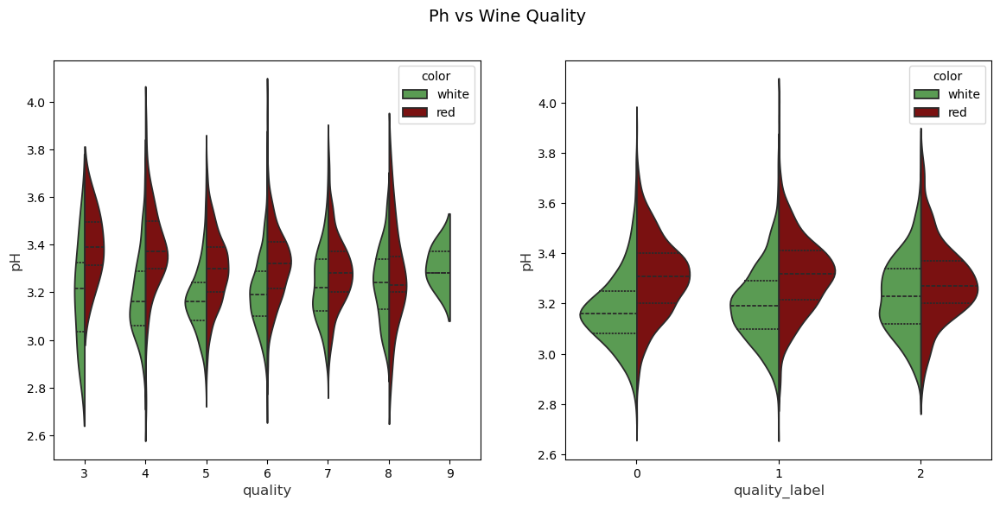

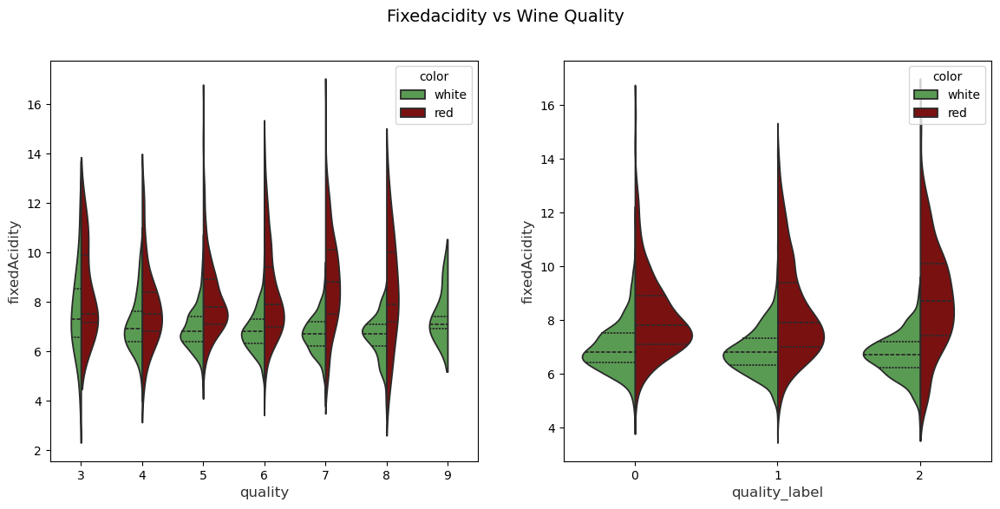

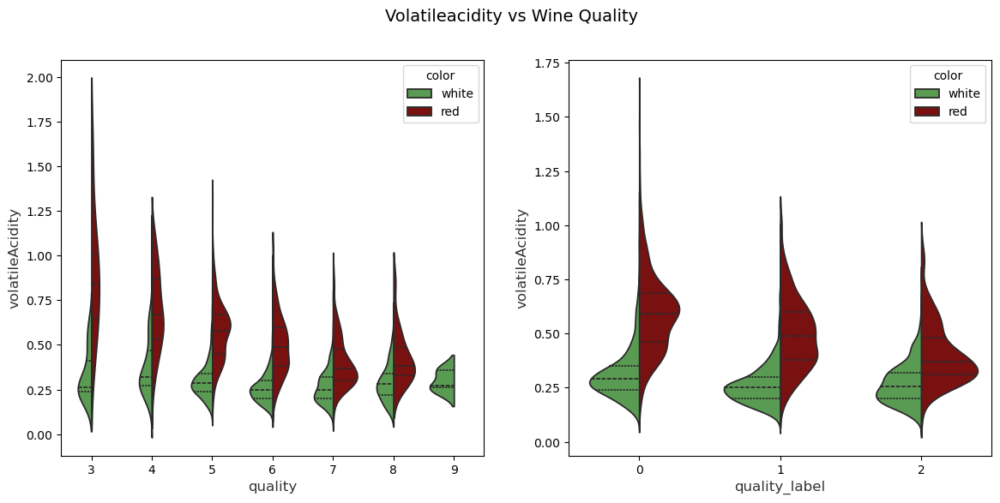

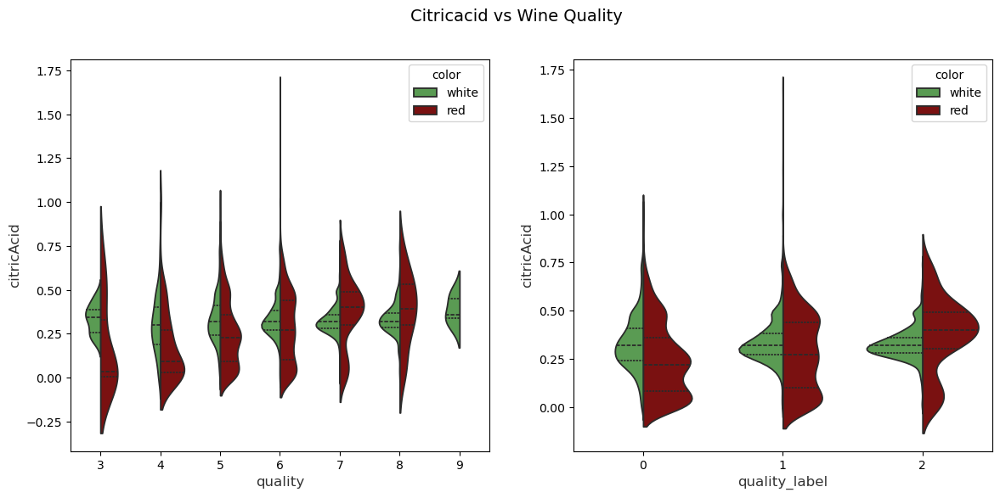

In [40]:
for feature in acid_features:
    plot_split_violin_distribution(data=wine, 
                             feature=feature, 
                             categorical_targets=["quality", "quality_label"],  
                             color_palette={
                                 'red': wine_red_color, 
                                 'white': wine_white_color}, 
                             hue='color')

*PH*: The violin plots show that wines quality ratings are not affected by changing pH levels. This suggests that pH levels do not significantly impact the perceived quality of the wine.

*Fixed Acidity*: The violin plots show that wines quality levls are not significantly different in terms of fixed acidity.

*Volatile Acidity*: The violin plots show that wines with higher quality ratings tend to have slightly lower volatile acidity levels, with a more concentrated distribution around the median. This suggests that wines with lower volatile acidity levels are more likely to be rated as higher quality.

*Citric Acid*: The violin plots show that wines with higher quality ratings tend to have slightly higher citric acid levels, with a more concentrated distribution around the median. This suggests that wines with higher citric acid levels are more likely to be rated as higher quality.

##### Taste related features

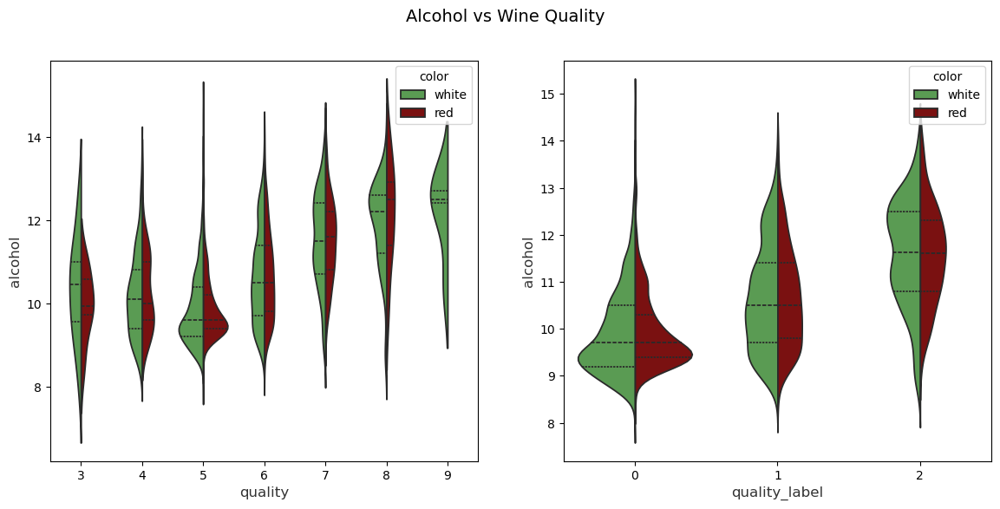

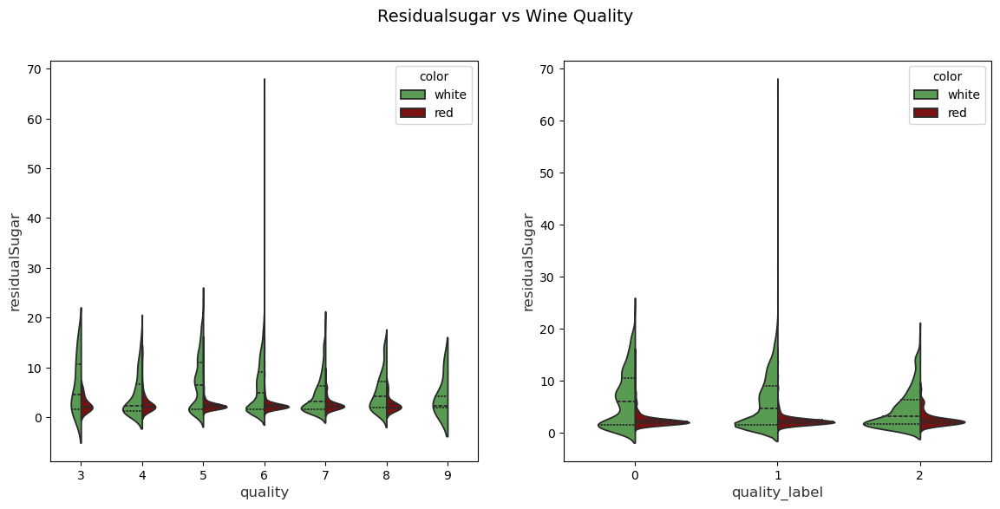

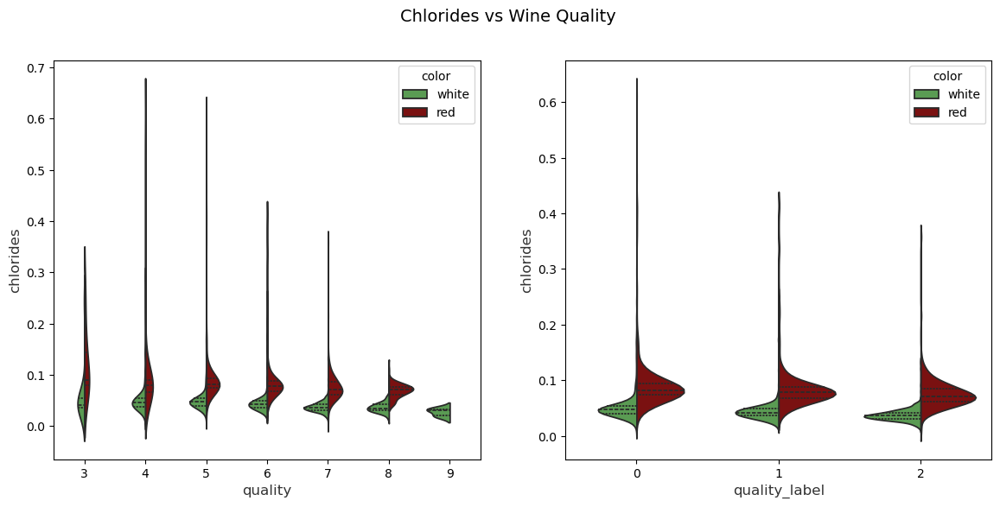

In [41]:
for feature in taste_features:
    plot_split_violin_distribution(data=wine, 
                             feature=feature, 
                             categorical_targets=["quality", "quality_label"],  
                             color_palette={
                                 'red': wine_red_color, 
                                 'white': wine_white_color}, 
                             hue='color')

*Alcohol Content*: The violin plots show that wines with higher quality ratings tend to have slightly higher alcohol content, with a more concentrated distribution around the median. This suggests that wines with higher alcohol content are more likely to be rated as higher quality.

*Residual Sugar*: The violin plots show that wines quality ratings are not significantly different in terms of residual sugar for both red and white wines.

*Chlorides*: The violin plots show that wines with higher quality ratings tend to have slightly lower or more concentrated chloride levels. This suggests that wines with lower chloride levels are more likely to be rated as higher quality.

#### Preservation related features

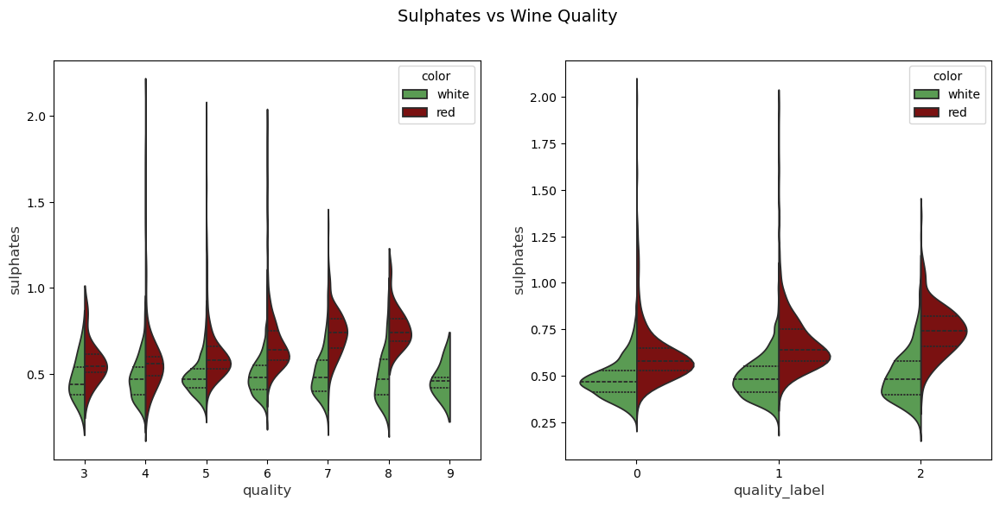

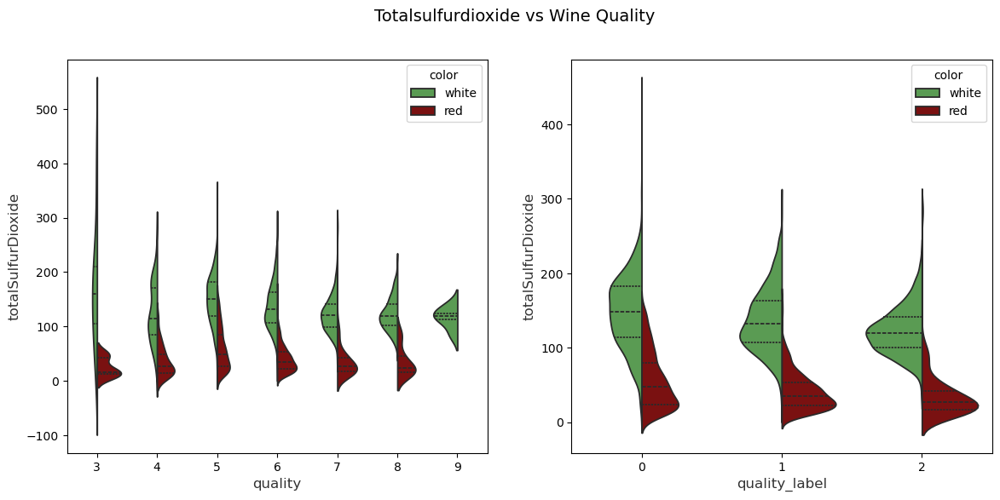

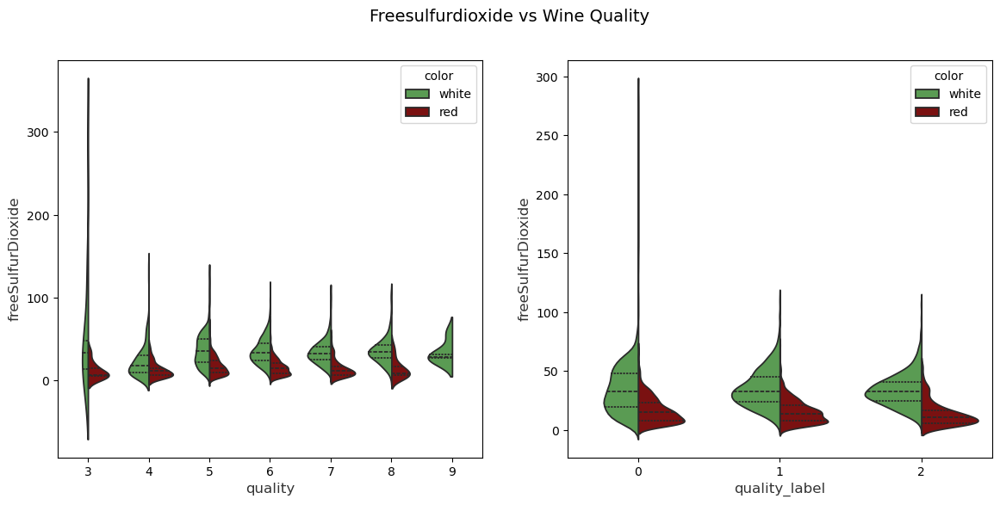

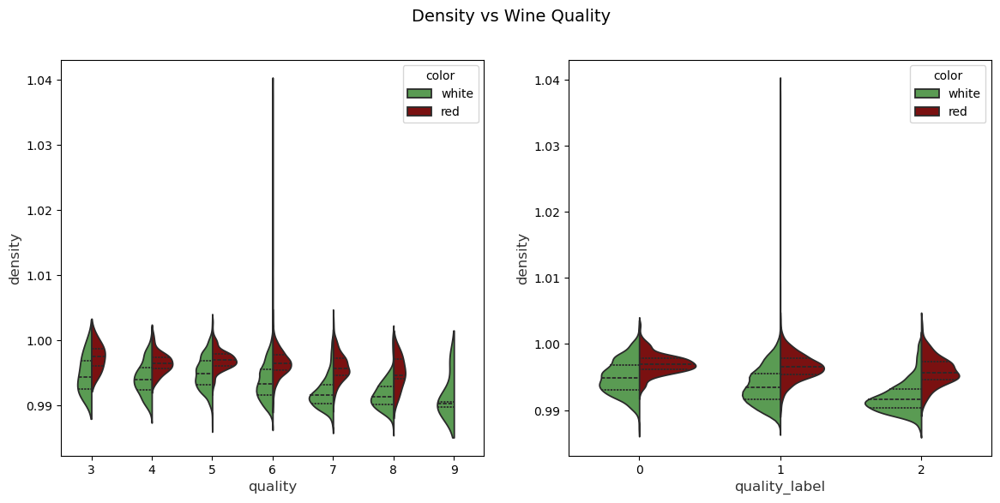

In [42]:
for feature in preservation_features:
    plot_split_violin_distribution(data=wine, 
                             feature=feature, 
                             categorical_targets=["quality", "quality_label"],  
                             color_palette={
                                 'red': wine_red_color, 
                                 'white': wine_white_color}, 
                             hue='color')

*Sulphates*: The violin plots show that wines with higher quality ratings tend to have slightly higher sulphate levels, with a more concentrated distribution around the median. This suggests that wines with higher sulphate levels are more likely to be rated as higher quality although the difference is minimal between lower and higher ranked wines.

*Total Sulfur Dioxide*: The violin plots show that wines quality ratings are not significantly different in terms of total sulfur dioxide for both red and white wines.

*Free Sulfur Dioxide*: The violin plots show that wines quality ratings are not significantly different in terms of free sulfur dioxide for both red and white wines.

*Density*: The violin plots show that wines with higher quality ratings tend to have slightly lower density levels, with a more concentrated distribution around the median. This suggests that wines with lower density levels are more likely to be rated as higher quality.

### Final remarks on data quality


As aforementioned, there are eight metrics to measure data quality (at least those that we focus on).

•⁠  ⁠Completeness: Data values are present -> This is given, as we do not have any missing values. ✅

•⁠  ⁠Consistency: Data satisfies constraints (format, allowable ranges and values, domain rules). -> This is given, as the values respect the format, ranges and rules in all instances. ✅

•⁠  ⁠Correctness: Values are true and unbiased with respect to their real-world state. -> This is given, as the instruments used for the measurements are highly reliable. ✅

•⁠  ⁠Uniqueness: Records representing a single wine are not replicated -> We do not have any duplicates in the dataset. Thus, this is given. ✅

•⁠  ⁠Timeliness: Data is up-to-date to their real-world state for the task in hand. -> This is given, as all the data has been collected during last year. ✅

•⁠  ⁠Stability: Data inherent concepts and statistics are comparable among sources over time. -> Even though wine age is not considered directly in the data set, it is indirectly present reflected in the chemical values.Note that the objective of the project is to predict quality based on chemical values. ✅

•⁠  ⁠Relevance: Data is useful for the task. -> This is given, as all the variables are related to chemical characteristics that vary from wine to wine. ✅

•⁠  ⁠Contextualization: Data is annotated with the acquisition context, their meaning and semantics. -> This is given, as the variables are appropriate to the objective of the project. ✅

Overall, we can say that the quality of the data set is ensured and can, therefore, be used by the Data Science Team for the VinifyTech project.


### Main data insights (connected to business)

VinifyTech's data insights shed light on crucial correlations between various chemical components and wine quality, ushering in a new era of precision winemaking. One of the most significant findings is the strong positive correlation between alcohol content and quality, indicating that wines with higher alcohol levels tend to be rated as higher quality. This underlines the importance of alcohol in enhancing the body, complexity, and balance of wines, aligning with the notion that winemaking is both an art and a science.

Moreover, the negative correlation between volatile acidity and quality highlights the detrimental impact of vinegar-like smells on wine quality, emphasizing the need for control in this aspect of production. Positive relationships with citric acid and sulphates underscore their roles in enhancing freshness, flavor, and preservation, contributing positively to wine quality. These insights, powered by machine learning algorithms and thorough data analysis, provide winemakers with actionable information to optimize their production processes and create wines that meet or exceed consumer expectations.

The comparison between red and white wines further unveils nuanced differences in their chemical compositions and quality perceptions. While both types display similar trends in acidity levels, red wines generally exhibit higher volatile acidity, suggesting greater complexity in aroma profiles. On the other hand, white wines showcase higher levels of total and free sulfur dioxide, emphasizing the importance of preservation strategies in white wine production. These insights not only deepen our understanding of wine chemistry but also pave the way for tailored approaches in winemaking that cater to distinct consumer preferences and market demands.

## Feature engineering and feature importance

### Feature creation

Sources:
- https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8003402/
- https://www.awri.com.au/wp-content/uploads/2011/07/Technical_Review_Issue_221_Wilkes.pdf
- https://assets.fishersci.com/TFS-Assets/LSG/Application-Notes/AN-TITRACID-E-1114-RevA-WEB.pdf
- https://winemakermag.com/article/balancing-wine-acidity

#### 1. Acid Balance Features
The Acid Balance features capture the equilibrium between different types of acidity and their relation to the overall taste and stability of the wine. Total acidity provides a comprehensive measure of the wine's acidity, essential for balancing sweetness and bitterness. The acid ratio highlights the balance between stable and volatile acids, impacting wine's aroma and taste. Acidity to alcohol ratio and pH to acidity ratio further detail how acidity interacts with alcohol content and pH level, respectively, offering insights into the wine's flavor profile and stability.

In [43]:
# total acidity
wine['totalAcidity'] = wine['fixedAcidity'] + wine['volatileAcidity'] + wine['citricAcid']

# average acidity
wine['avgAcidity'] = wine[['fixedAcidity', 'volatileAcidity', 'citricAcid']].mean(axis=1)

# acid ratio
wine['acidRatio'] = wine['fixedAcidity'] / wine['volatileAcidity']

# acidity to alcohol ratio
wine['acidAlcoholRatio'] = wine['totalAcidity'] / wine['alcohol']

# ph to acidity ratio
wine['phAcidityRatio'] = wine['pH'] / wine['totalAcidity']

#### 2. Sugar Related Features
Sugar-related features focus on the interplay between sweetness and other wine characteristics. The sugar to alcohol rate reflects how residual sugar balances with alcohol, influencing the wine's body and sweetness perception. Similarly, the sugar to acidity rate examines how sweetness interacts with acidity, a crucial aspect of the wine's taste and mouthfeel, impacting its overall balance and appeal.

In [44]:
# Sugar to alcohol rate
wine['sugarAlcoholRate'] = wine['residualSugar'] / wine['alcohol']

# Sugar to acidity rate
wine['sugarAcidityRate'] = wine['residualSugar'] / wine['totalAcidity']

#### 3. Sulfur Dioxide Features
Sulfur dioxide features provide insight into the wine's preservation and antioxidation properties. The SO2 ratio assesses the effectiveness of free SO2, a key preservative, in relation to the total SO2 content. Meanwhile, the sulfates to SO2 rate explores the role of sulfates in maintaining the wine's freshness and preventing microbial growth, highlighting the efficiency of sulfur dioxide use in wine preservation.

In [45]:
# SO2 ratio
wine['so2Ratio'] = wine['freeSulfurDioxide'] / wine['totalSulfurDioxide']

# Sulfates to SO2 rate
wine['sulfatesSo2Rate'] = wine['sulphates'] / wine['totalSulfurDioxide']

# Sulfite Effectiveness
wine['sulfite_effectiveness'] = wine['totalSulfurDioxide'] / wine['pH']

#### 4. Salt and Alcohol Balance
The chlorides to alcohol rate examines the relationship between the wine's salinity (as indicated by chlorides) and its alcohol content. This ratio is important for understanding how the presence of salts influences the perception of alcohol in wine, potentially affecting its flavor balance and overall taste profile.

In [46]:
# chlorides to alcohol rate
wine['chloridesAlcoholRate'] = wine['chlorides'] / wine['alcohol']

#### 5. Overall Balance and Quality Indicators
Overall balance and quality indicators like the density to alcohol rate help gauge the wine's body and character in relation to its alcohol strength. This feature can indicate the wine's richness and potential sweetness, providing a proxy for assessing quality and consumer preference based on the balance between alcohol content and wine density.

In [47]:
# Density to alcohol rate
wine['densityAlcoholRate'] = wine['density'] / wine['alcohol']

#### 6. Interaction Terms for Complex Relationships
Interaction terms delve into the nuanced interplay between key wine components, uncovering complex relationships that single variables alone cannot. Alcohol and residual sugar interaction reflects on how sweetness and alcohol warmth balance, affecting mouthfeel and taste. Total acidity and pH interaction can reveal how acidity levels and pH jointly influence wine's stability and flavor. The free sulfur dioxide and total sulfur dioxide interaction shows the proportion and effectiveness of sulfur dioxide as a preservative. Citric acid and fixed acidity interaction, as well as sulphates and chlorides interaction, provide insights into the wine's chemical balance, affecting taste, preservation, and overall quality.

In [48]:
# Alcohol and residual sugar interaction
wine['alcoholSugarInteraction'] = wine['alcohol'] * wine['residualSugar']

# Total acidity and pH interaction
wine['totalAcidityPhInteraction'] = wine['totalAcidity'] * wine['pH']

# Free sulfur dioxid and total sulfur dioxid interaction
wine['freeSo2TotalSo2Interaction'] = wine['freeSulfurDioxide'] * wine['totalSulfurDioxide']

# Citric Acid and Fixed Acidity Interaction
wine['citricAcidFixedAcidityInteraction'] = wine['citricAcid'] * wine['fixedAcidity']

# Sulphates and Chlorides Interaction
wine['sulphatesChloridesInteraction'] = wine['sulphates'] * wine['chlorides']

# Ageability score
weights = {
    'avgAcidity': 0.25,
    'totalSulfurDioxide': 0.25,
    'alcohol': 0.25,
    'residualSugar': 0.25
}

wine['ageability_score'] = (wine['avgAcidity'] * weights['avgAcidity'] + 
                      wine['totalSulfurDioxide'] * weights['totalSulfurDioxide'] + 
                      wine['alcohol'] * weights['alcohol'] + 
                      wine['residualSugar'] * weights['residualSugar'])

After the creation of all the features, it is once again useful, to get a big picture with a collection of  histograms:

array([[<Axes: title={'center': 'fixedAcidity'}>,
        <Axes: title={'center': 'volatileAcidity'}>,
        <Axes: title={'center': 'citricAcid'}>,
        <Axes: title={'center': 'residualSugar'}>,
        <Axes: title={'center': 'chlorides'}>],
       [<Axes: title={'center': 'freeSulfurDioxide'}>,
        <Axes: title={'center': 'totalSulfurDioxide'}>,
        <Axes: title={'center': 'density'}>,
        <Axes: title={'center': 'pH'}>,
        <Axes: title={'center': 'sulphates'}>],
       [<Axes: title={'center': 'alcohol'}>,
        <Axes: title={'center': 'quality'}>,
        <Axes: title={'center': 'totalAcidity'}>,
        <Axes: title={'center': 'avgAcidity'}>,
        <Axes: title={'center': 'acidRatio'}>],
       [<Axes: title={'center': 'acidAlcoholRatio'}>,
        <Axes: title={'center': 'phAcidityRatio'}>,
        <Axes: title={'center': 'sugarAlcoholRate'}>,
        <Axes: title={'center': 'sugarAcidityRate'}>,
        <Axes: title={'center': 'so2Ratio'}>],
       [<

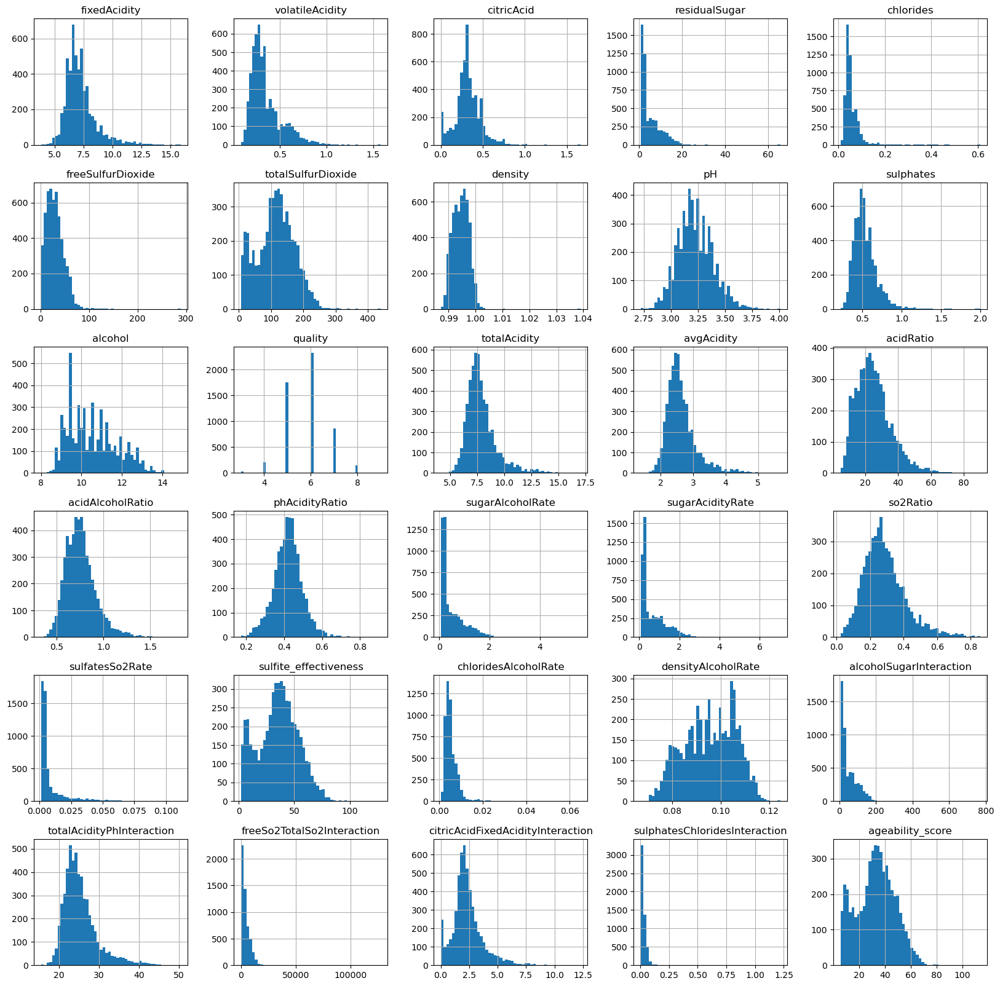

In [49]:
#histogram
wine.hist(figsize=(20, 20), bins = 50)

We can see that some variables are highly skewed (such as `sulphatesChloridesInteraction` or `freeSo2TotalSo2Interaction`). Normality is not needed for tree based models, such as the decision tree or random forest, neither strictly necessary for models such as Support Vector Machines or Stochastic Gradient Descent (SGD). Applying the Box-Cox transformation to skewed variables might, however, still be beneficial, because it can help alleviate the impact of skewness on the distribution of the data, resulting in more balanced feature distributions. This can lead to improved convergence and stability during model training, enhancing the overall performance and predictive accuracy of the classifiers. Additionally, transforming skewed variables influences the correlation of the variables, which is our first filter for feature selection.

In [50]:
skewed_features = wine.drop(columns=['color', 'quality_label']).apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness = pd.DataFrame({'Skew' :skewed_features})   

# Get only higest skewed features
skewness = skewness[abs(skewness) > 0.7]
skewness = skewness.dropna()
print(f"There are {skewness.shape[0]} higest skewed numerical features to box cox transform")

l_opt = {}

for feature in skewness.index:
    wine[feature], l_opt[feature] = boxcox((wine[feature]+1))

skewed_features2 = wine[skewness.index].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness2 = pd.DataFrame({'New Skew' :skewed_features2})   
display(pd.concat([skewness, skewness2], axis=1).sort_values(by=['Skew'], ascending=False))

There are 20 higest skewed numerical features to box cox transform


,Skew,New Skew
sulphatesChloridesInteraction,12.530296,0.363812
freeSo2TotalSo2Interaction,6.293031,-0.080414
chloridesAlcoholRate,5.419901,0.208730
chlorides,5.336732,0.207885
sulfatesSo2Rate,3.179621,0.918922
alcoholSugarInteraction,1.943527,0.073510
sulphates,1.808944,0.003765
residualSugar,1.706069,0.158571
sugarAlcoholRate,1.671410,0.353981
fixedAcidity,1.649952,-0.054315


array([[<Axes: title={'center': 'fixedAcidity'}>,
        <Axes: title={'center': 'volatileAcidity'}>,
        <Axes: title={'center': 'citricAcid'}>,
        <Axes: title={'center': 'residualSugar'}>,
        <Axes: title={'center': 'chlorides'}>],
       [<Axes: title={'center': 'freeSulfurDioxide'}>,
        <Axes: title={'center': 'totalSulfurDioxide'}>,
        <Axes: title={'center': 'density'}>,
        <Axes: title={'center': 'pH'}>,
        <Axes: title={'center': 'sulphates'}>],
       [<Axes: title={'center': 'alcohol'}>,
        <Axes: title={'center': 'quality'}>,
        <Axes: title={'center': 'totalAcidity'}>,
        <Axes: title={'center': 'avgAcidity'}>,
        <Axes: title={'center': 'acidRatio'}>],
       [<Axes: title={'center': 'acidAlcoholRatio'}>,
        <Axes: title={'center': 'phAcidityRatio'}>,
        <Axes: title={'center': 'sugarAlcoholRate'}>,
        <Axes: title={'center': 'sugarAcidityRate'}>,
        <Axes: title={'center': 'so2Ratio'}>],
       [<

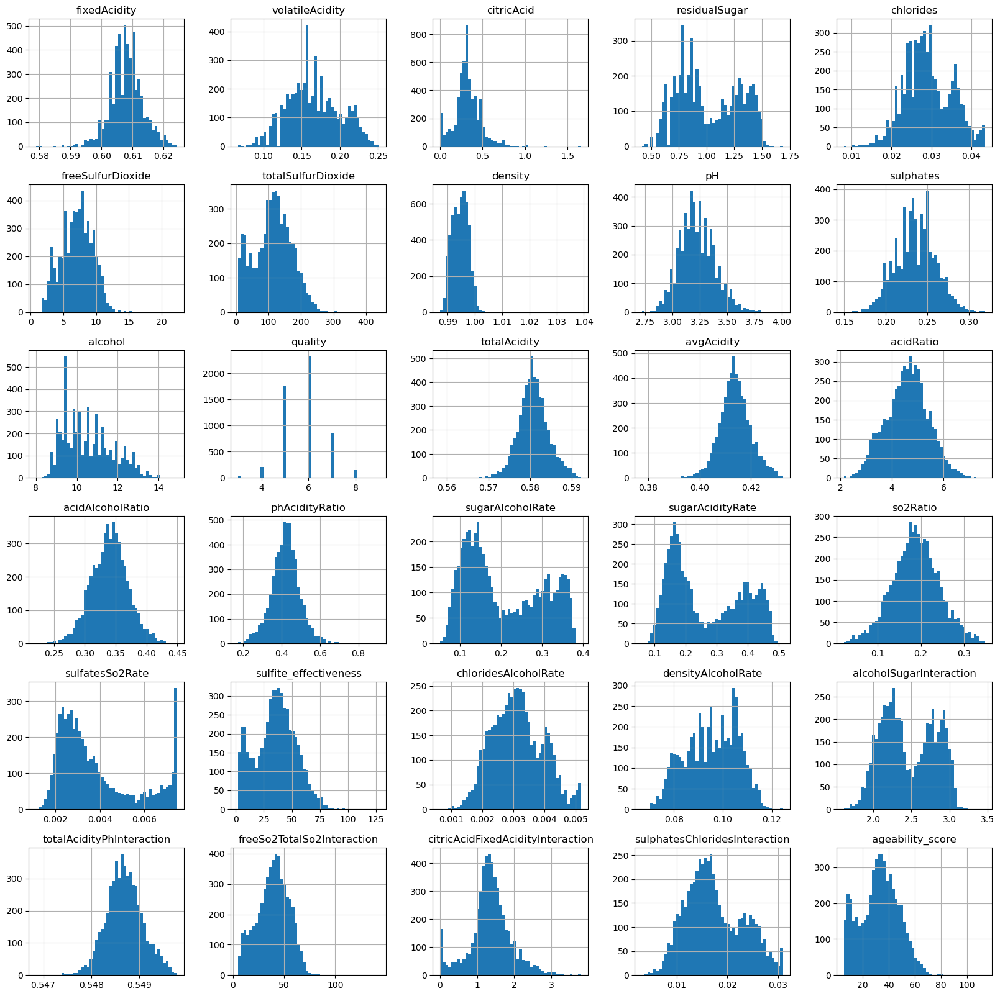

In [51]:
#histogram
wine.hist(figsize=(20, 20), bins = 50)

#### PCA Analysis

Checking the variance explained by the principal componennts with the newly created features:

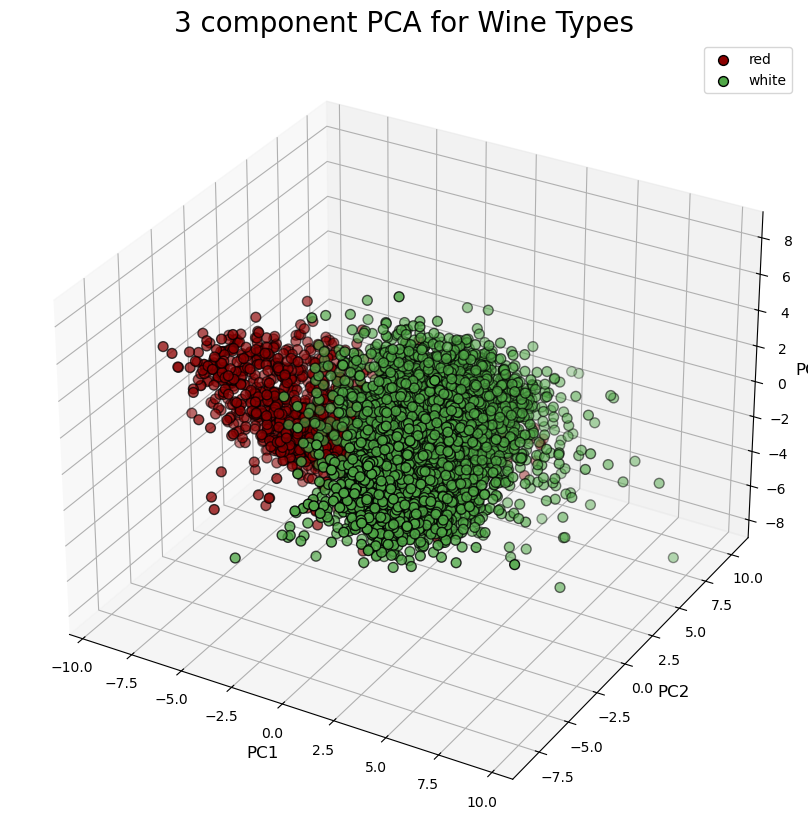

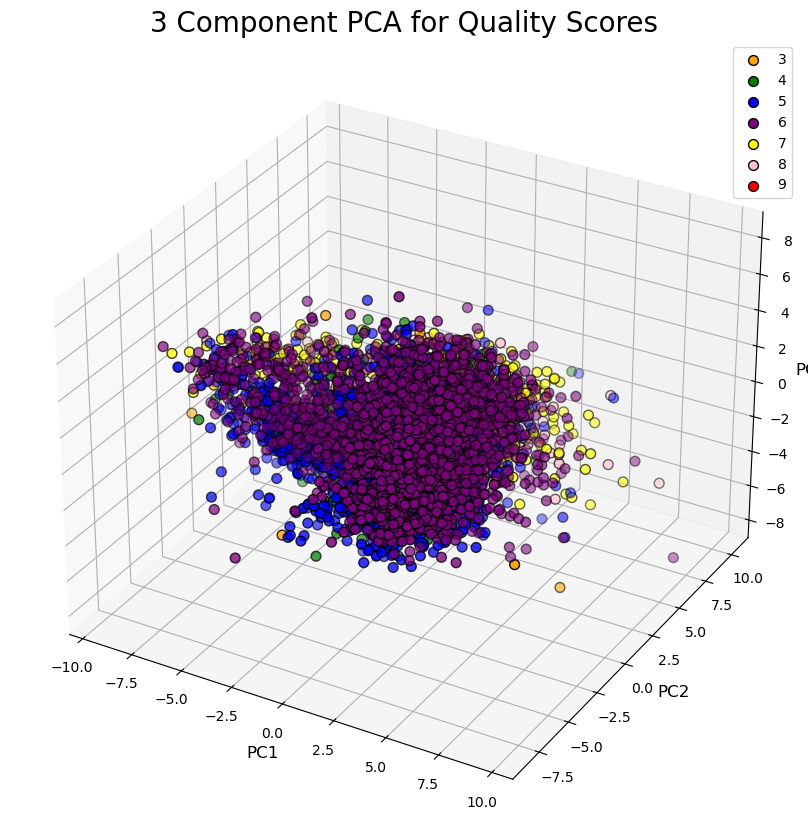

In [52]:
# define features
features = ['fixedAcidity', 'volatileAcidity', 'citricAcid', 'residualSugar', 'chlorides', 'freeSulfurDioxide', 'totalSulfurDioxide', 'density', 'pH', 'sulphates', 'alcohol', 'ageability_score', 'totalAcidity', 'avgAcidity', 'acidRatio', 'acidAlcoholRatio', 'phAcidityRatio', 'totalAcidityPhInteraction', 'sugarAlcoholRate', 'sugarAcidityRate', 'alcoholSugarInteraction', 'chloridesAlcoholRate', 'sulphatesChloridesInteraction', 'freeSo2TotalSo2Interaction', 'densityAlcoholRate', 'so2Ratio', 'sulfatesSo2Rate', 'sulfite_effectiveness', 'chloridesAlcoholRate', 'citricAcidFixedAcidityInteraction']

# Separating out the features and keeping the wine type and quality label
x = wine.loc[:, features].values
y = wine.loc[:, ['color', 'quality']].values

# Standardizing the features
x = StandardScaler().fit_transform(x)

# PCA
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2', 'PC3'])

finalDf = pd.concat([principalDf, wine[['color', 'quality']]], axis = 1)

# plotting the results for color of wine in 3d plot
fig = plt.figure(figsize = (8,15))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('PC1', fontsize = 12)
ax.set_ylabel('PC2', fontsize = 12)
ax.set_zlabel('PC3', fontsize = 12)
ax.set_title('3 component PCA for Wine Types', fontsize = 20)
    
colors = [wine_red_color, wine_white_color]
targets = ['red', 'white']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['color'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'PC1']
               , finalDf.loc[indicesToKeep, 'PC2']
               , finalDf.loc[indicesToKeep, 'PC3']
               , c = color
               , edgecolor='k'
               , s = 50)
    
fig.subplots_adjust(right=0.95)
ax.legend(targets)
ax.grid()
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
plt.show()

# plotting the results for quality of wine
fig = plt.figure(figsize = (8,15))
ax = fig.add_subplot(1,1,1, projection='3d')
ax.set_xlabel('PC1', fontsize = 12)
ax.set_ylabel('PC2', fontsize = 12)
ax.set_zlabel('PC3', fontsize = 12)
ax.set_title('3 Component PCA for Quality Scores', fontsize = 20)
colors = ['orange', 'green', 'blue', 'purple', 'yellow', 'pink', 'red']

targets = list(wine['quality'].unique())
targets = sorted(targets)
for target, color in zip(targets, colors):
    indicesToKeep = finalDf['quality'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'PC1']
               , finalDf.loc[indicesToKeep, 'PC2']
               , finalDf.loc[indicesToKeep, 'PC3']
               , edgecolor='k'
               , c = color
               , s = 50)

# sorting the legend values by quality score
#targets = sorted(targets)
fig.subplots_adjust(right=0.95)
ax.legend(targets)
ax.grid()
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
plt.show()

Looking at the above PCA plots, we can see that wines can be separated by their color into red and white wines as the distribution of the wines is, to what we can see, linearly separable. However, for the wine quality, we can not observe clear linear separability. The wine quality labels show more variability in terms of values and are not linearly separable. 
Based on these insights, and as winemakers do know how distinguish red and white wines in terms of color, we will create models for each wine type separately.

### Feature selection

 Now, that we have created various types of new features, the next step is feature selection. For the feature selection, following up on the insight using the PCA from before, we will now split the dataset again for each red and white wines. The first filter for that is a simple correlation matrix. Highly correlated features can often lead to multicollinearity in predictive modeling, which might not only make the model's parameters difficult to interpret but also can decrease the generalizability of the model to new data. Therefore, identifying and possibly removing or combining highly correlated features is an essential step to improve model performance and reliability. For that, however, we split the dataset into red and white wine once again. This is due to the fact that certain features might be important for one group while being irrelevant for others. This, then also reduces the number of features.

In [53]:
# splitting the dataset into red and white again
redWine = wine[wine["color"] == "red"]
whiteWine = wine[wine["color"] == "white"]

# dropping the column "color"
redWine = redWine.drop(columns=["color"])
whiteWine = whiteWine.drop(columns=["color"])

#### Red Wine

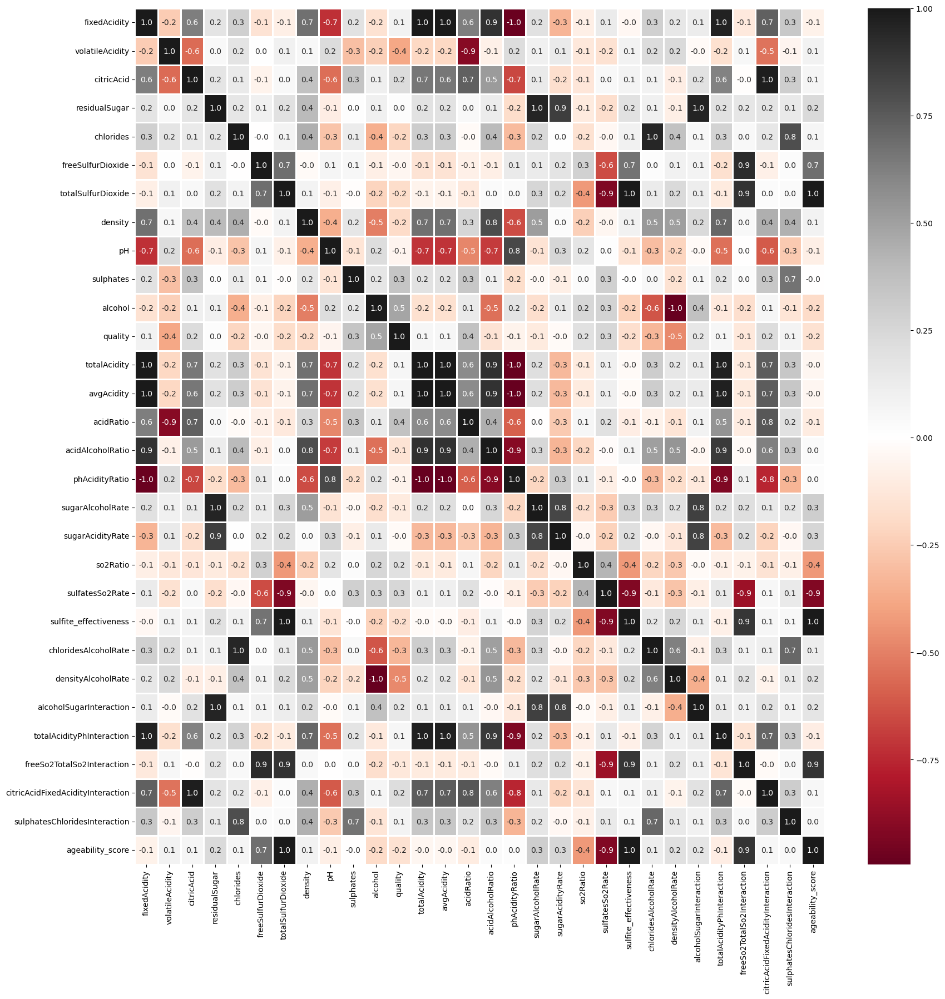

,Feature 1,Feature 2,Correlation
11,fixedAcidity,totalAcidity,0.993651
12,fixedAcidity,avgAcidity,0.993593
14,fixedAcidity,acidAlcoholRatio,0.899423
15,fixedAcidity,phAcidityRatio,-0.984770
24,fixedAcidity,totalAcidityPhInteraction,0.964624
41,volatileAcidity,acidRatio,-0.902513
81,citricAcid,citricAcidFixedAcidityInteraction,0.978905
97,residualSugar,sugarAlcoholRate,0.959105
98,residualSugar,sugarAcidityRate,0.858828
104,residualSugar,alcoholSugarInteraction,0.960567


In [54]:
corr_featureSelection(redWine.drop(columns=['quality_label']))

We can observe that there are a few very highly correlated features. In addressing the issue of high correlation among features (abs(correlation) > 0.75), we've opted to remove certain features to enhance the model's efficiency and interpretability. Specifically, we've chosen to drop features like `totalAcidity`, `acidAlcoholRatio`, `phAcidityRatio`, `totalAcidityPhInteraction`, `acidRatio`, `citricAcidFixedAcidityInteraction`, `sugarAlcoholRate`, `sugarAcidityRate`, `alcoholSugarInteraction`, `chloridesAlcoholRate`, `sulphatesChloridesInteraction`, `freeSo2TotalSo2Interaction`, `densityAlcoholRate`, `avgAcidity`, `sulfite_effectiveness`, `sulfatesSo2Rate`, and `totalSulfurDioxide`. The rationale behind this selection is twofold: to eliminate redundancy and to focus on foundational features that directly influence wine quality. By excluding these highly correlated features, many of which are derived or ratio-based, we aim to maintain a dataset that's both simpler and more robust. This approach helps in avoiding multicollinearity, which can obscure the importance of individual features and complicate model interpretation. The decision to keep `fixedAcidity`, `citricAcid`, `residualSugar`, `chlorides`, `freeSulfurDioxide`, `pH`, `alcohol`, and `ageability_score` ensures that our model is grounded in direct, measurable properties of wine (most of them are original measures). These retained features provide a comprehensive view of the wine's chemical composition and are expected to contribute valuable insights into the factors that most significantly impact wine quality, thereby facilitating a more effective and interpretable predictive model.

In [55]:
featuresToRemove = ["totalAcidity", 
                    "acidAlcoholRatio",
                    "phAcidityRatio",
                    "totalAcidityPhInteraction", 
                    "acidRatio", 
                    "citricAcidFixedAcidityInteraction", 
                    "sugarAlcoholRate", 
                    "sugarAcidityRate", 
                    "alcoholSugarInteraction", 
                    "chloridesAlcoholRate", 
                    "sulphatesChloridesInteraction", 
                    "freeSo2TotalSo2Interaction", 
                    "densityAlcoholRate", 
                    "avgAcidity", 
                    "sulfite_effectiveness", 
                    "sulfatesSo2Rate",
                    "totalSulfurDioxide"]

redWine = redWine.drop(columns=featuresToRemove)

Now that we have our features, we start scaling the numerical features using StandardScaler to bring them onto a similar scale. Standardization enhances the convergence speed and performance of machine learning algorithms, ensuring that no single feature dominates the analysis due to its scale. Furthermore, we convert categorical variables like `quality` and `quality_label` into numerical formats to seamlessly integrate them into our models, facilitating straightforward interpretation and analysis.

After scaling the features, we perform dimensionality reduction using Principal Component Analysis (PCA) to capture the most significant variance across dimensions with fewer components. PCA identifies the optimal number of components that explain a predefined threshold of variance, allowing us to reduce the dimensionality of the dataset while retaining the most important information. By adding back the original target variables to the PCA-transformed DataFrame, we preserve the interpretability of the analysis while benefiting from reduced dimensionality, thus enabling efficient and effective model training and evaluation.

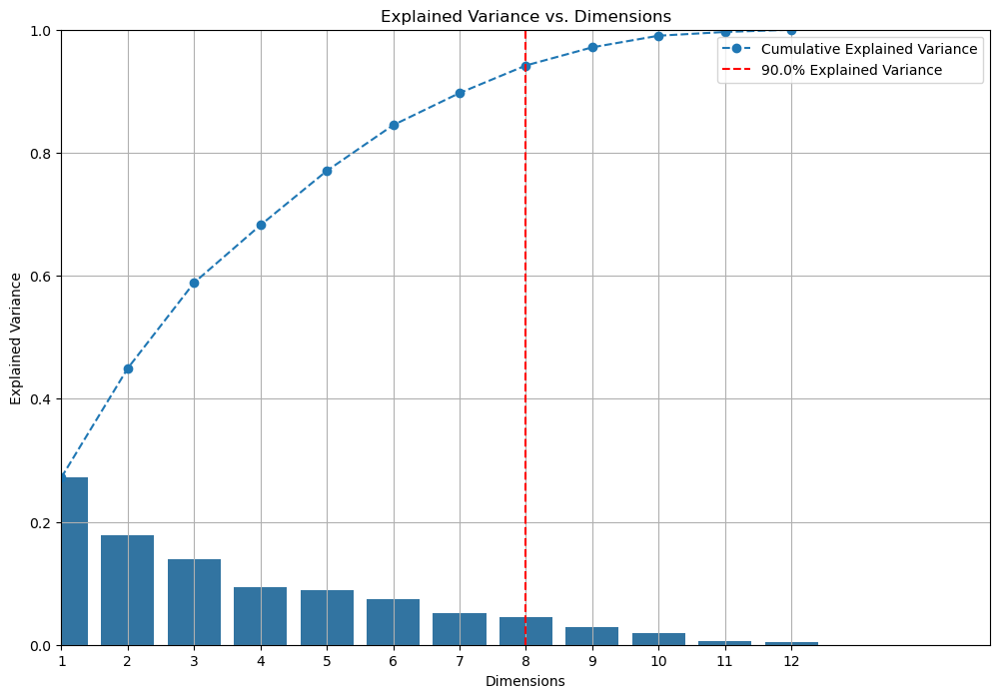

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,quality_label,quality
0,0.768317,0.746467,-0.822664,-0.177554,-0.141123,-1.106527,-0.837405,-0.357480,1,6
1,3.288433,0.106900,0.710017,-0.764807,-0.206198,0.156537,0.534175,0.892890,0,5
2,-1.543957,2.086087,1.206056,1.125137,-0.262390,-0.062539,-0.573985,0.102808,0,5
3,-0.964339,0.150881,-2.027342,1.081381,-1.047138,-0.823456,-0.207472,-1.145901,0,5
4,-1.897409,2.504191,0.854731,-1.419253,1.502762,1.318437,0.585247,-0.183019,0,5
...,...,...,...,...,...,...,...,...,...,...
1354,-1.713512,1.671987,-0.113330,0.348178,-0.395383,0.985373,-0.116578,0.265693,0,5
1355,2.863827,-0.615342,1.612874,2.362475,0.708215,-0.024809,-0.166339,-1.228133,1,6
1356,3.183192,0.146219,-0.819721,-0.506395,-1.607533,1.382483,-0.425693,0.226012,0,5
1357,-1.326937,-1.234155,-1.136590,0.523049,0.051192,0.111762,0.261730,0.168906,2,7


In [56]:
redWine_pca = explainedVar_PCA(redWine, features_to_keep = ["quality_label", "quality"])

Choosing eight principal components allows us to retain 90% of the original dataset's variance, effectively compressing our data while preserving most of its informational value. This reduction simplifies the analysis, making subsequent clustering more computationally efficient and potentially more accurate. However, this dimensionality reduction leads to a loss of interpretability, as the principal components represent linear combinations of the original features, making it challenging to understand their direct influence on the data.

#### White Wine

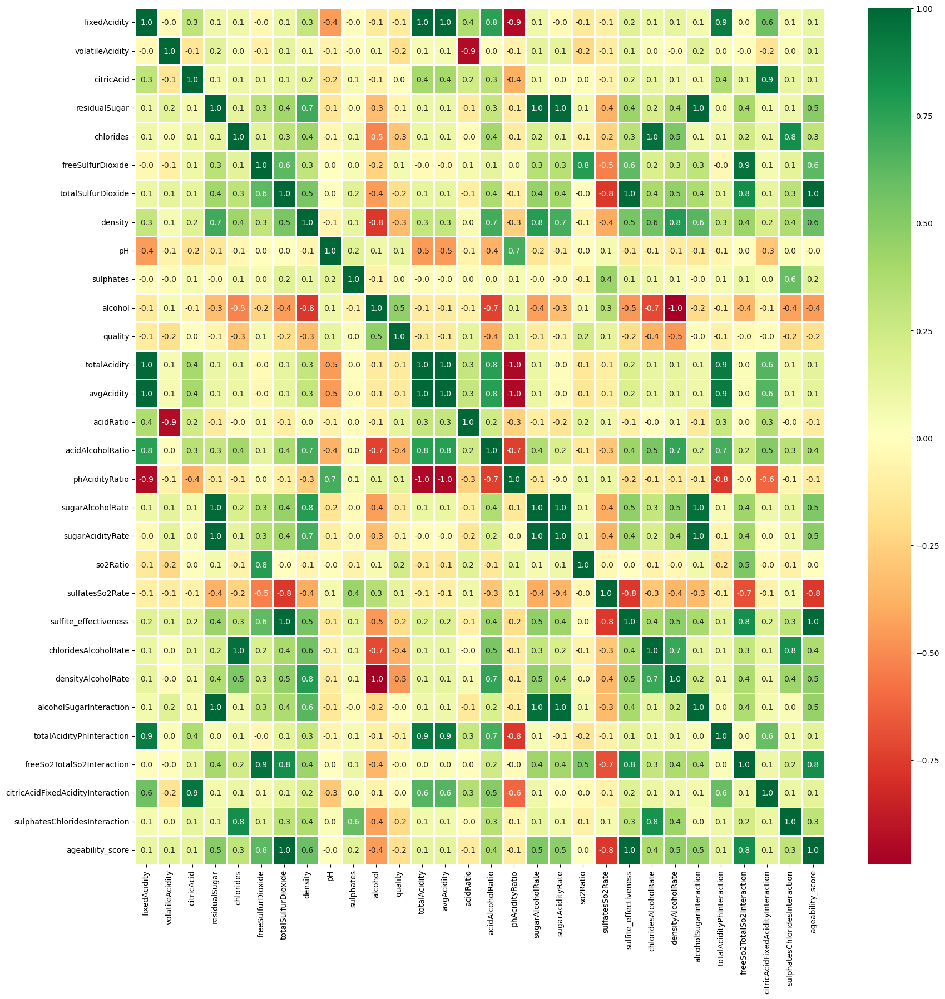

,Feature 1,Feature 2,Correlation
11,fixedAcidity,totalAcidity,0.987427
12,fixedAcidity,avgAcidity,0.987400
14,fixedAcidity,acidAlcoholRatio,0.755351
15,fixedAcidity,phAcidityRatio,-0.944286
24,fixedAcidity,totalAcidityPhInteraction,0.908281
41,volatileAcidity,acidRatio,-0.938989
81,citricAcid,citricAcidFixedAcidityInteraction,0.940972
97,residualSugar,sugarAlcoholRate,0.990087
98,residualSugar,sugarAcidityRate,0.991408
104,residualSugar,alcoholSugarInteraction,0.992327


In [57]:
corr_featureSelection(whiteWine.drop(columns=['quality_label']), color_map="RdYlGn")

We can observe that there are a few very highly correlated features. In addressing the issue of high correlation among features (abs(correlation) > 0.75), we've opted to remove certain features to enhance the model's efficiency and interpretability. Specifically, we've chosen to drop (again) features like `totalAcidity`, `acidAlcoholRatio`, `phAcidityRatio`, `totalAcidityPhInteraction`, `acidRatio`, `citricAcidFixedAcidityInteraction`, `sugarAlcoholRate`, `sugarAcidityRate`, `alcoholSugarInteraction`, `chloridesAlcoholRate`, `sulphatesChloridesInteraction`, `freeSo2TotalSo2Interaction`, `densityAlcoholRate`, `avgAcidity`, `sulfite_effectiveness`, `sulfatesSo2Rate`,`so2Ratio`, and `totalSulfurDioxide`. Additionally to those, we, however, also decided to drop `density` due to its high correlation to `residualSugar` and `alcohol`. The rationale behind this selection is the same as it was for the red wine.

In [58]:
featuresToRemove = ["totalAcidity", 
                    "acidAlcoholRatio", 
                    "phAcidityRatio", 
                    "totalAcidityPhInteraction", 
                    "acidRatio", 
                    "citricAcidFixedAcidityInteraction", 
                    "sugarAlcoholRate", 
                    "sugarAcidityRate", 
                    "alcoholSugarInteraction", 
                    "chloridesAlcoholRate", 
                    "sulphatesChloridesInteraction", 
                    "freeSo2TotalSo2Interaction", 
                    "densityAlcoholRate", 
                    "avgAcidity",
                    "sulfite_effectiveness", 
                    "totalSulfurDioxide", 
                    "sulfatesSo2Rate",
                    "so2Ratio",
                    "density"]

whiteWine = whiteWine.drop(columns=featuresToRemove)

Just as before, that we have our features, we start scaling the numerical features using StandardScaler to bring them onto a similar scale. Standardization enhances the convergence speed and performance of machine learning algorithms, ensuring that no single feature dominates the analysis due to its scale. Furthermore, we convert categorical variables like `quality` and `quality_label` into numerical formats to seamlessly integrate them into our models, facilitating straightforward interpretation and analysis.

After scaling the features, we perform dimensionality reduction using Principal Component Analysis (PCA) to capture the most significant variance across dimensions with fewer components. PCA identifies the optimal number of components that explain a predefined threshold of variance, allowing us to reduce the dimensionality of the dataset while retaining the most important information. By adding back the original target variables to the PCA-transformed DataFrame, we preserve the interpretability of the analysis while benefiting from reduced dimensionality, thus enabling efficient and effective model training and evaluation.

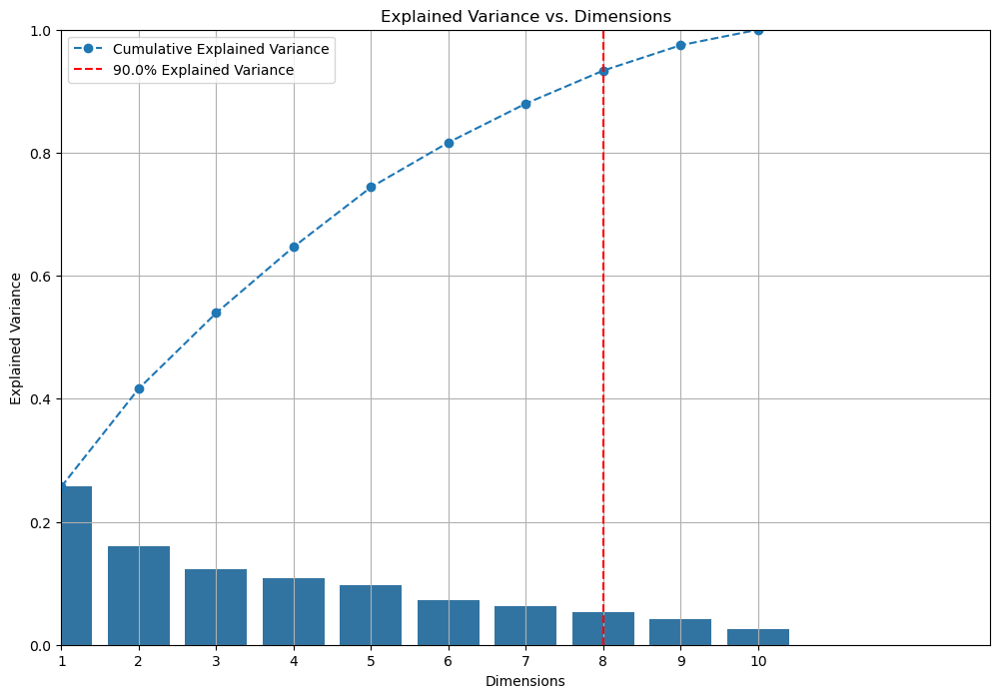

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,quality_label,quality
0,0.244711,-0.396347,0.283370,-0.707450,-0.152957,-1.133433,-0.613672,0.610948,0,5
1,0.208217,-0.684534,0.001751,0.581398,-1.773965,-0.185688,1.164867,-0.473391,1,6
2,-1.531532,-0.750420,-1.327282,-1.036949,-0.115601,1.674029,-0.707861,0.101078,0,5
3,-1.720313,-0.355716,-0.558282,1.464362,-1.033947,-0.523319,-0.403545,0.722256,0,5
4,-2.001605,-0.739499,0.627494,-0.147879,-0.539882,-1.471157,-0.483086,0.102847,1,6
...,...,...,...,...,...,...,...,...,...,...
3956,-0.231656,0.876847,-0.579010,-1.553639,-0.371703,-0.407529,-0.411914,1.250218,0,5
3957,2.172408,0.929394,-2.462287,-1.355376,-0.311099,-0.700394,2.041328,0.428178,0,4
3958,1.585774,-0.902775,-0.404456,1.017270,-0.342476,0.129684,0.130262,-0.166456,2,7
3959,-0.985456,-0.635792,0.690504,0.090684,0.009165,-0.826767,1.407462,-0.759830,1,6


In [59]:
whiteWine_pca = explainedVar_PCA(whiteWine, features_to_keep = ["quality_label", "quality"])

Also here, choosing eight principal components allows us to retain 90% of the original dataset's variance, effectively compressing our data while preserving most of its informational value. This reduction simplifies the analysis, making subsequent clustering more computationally efficient and potentially more accurate. However, this dimensionality reduction leads to a loss of interpretability, as the principal components represent linear combinations of the original features, making it challenging to understand their direct influence on the data.

## Modeling

### Decision Tree

We selected the Decision Tree classifier for predicting wine quality from a set of carefully chosen features, drawn to its simplicity and high interpretability. Decision trees emulate human decision-making by constructing a tree-like model of decisions, making it especially useful for unraveling the critical factors affecting wine quality. This method excels in visualizing the importance hierarchy of various features, such as acidity levels, alcohol content, and sulfur dioxide concentrations, thereby facilitating an intuitive understanding of their impact on wine quality. Through recursive dataset splitting based on these features, the Decision Tree classifier adeptly captures nonlinear relationships and pinpoints the significant predictors of wine quality.

In our pursuit of optimizing the model, we meticulously selected hyperparameters that ensure a judicious balance between the model's complexity and its predictive performance. By limiting the maximum depth of the tree to 10, we prevented over-elaboration, which could lead to overfitting. We specified that each leaf node must contain at least four samples (min_samples_leaf=4) and that a minimum of ten samples are required to split an internal node (min_samples_split=10), thereby avoiding excessively fine subdivisions within the tree. The random state was set to 42 to guarantee the reproducibility of our results.

Our methodical approach extended to hyperparameter tuning, where we utilized GridSearchCV to systematically explore and optimize parameters, including 'max_depth', 'min_samples_leaf', and 'min_samples_split', over specified ranges. This exhaustive search facilitated the identification of the ideal model configuration that adeptly balances specificity and generality. Moreover, the stratification of our train-test split played an instrumental role, ensuring that the representation of different wine quality classes was consistent across both training and test sets. This stratification is essential for preserving the integrity of our model's evaluation metrics, making certain that our findings are both robust and reflective of the underlying data distribution.

#### Red Wine

Cross-validation Accuracy: 0.58


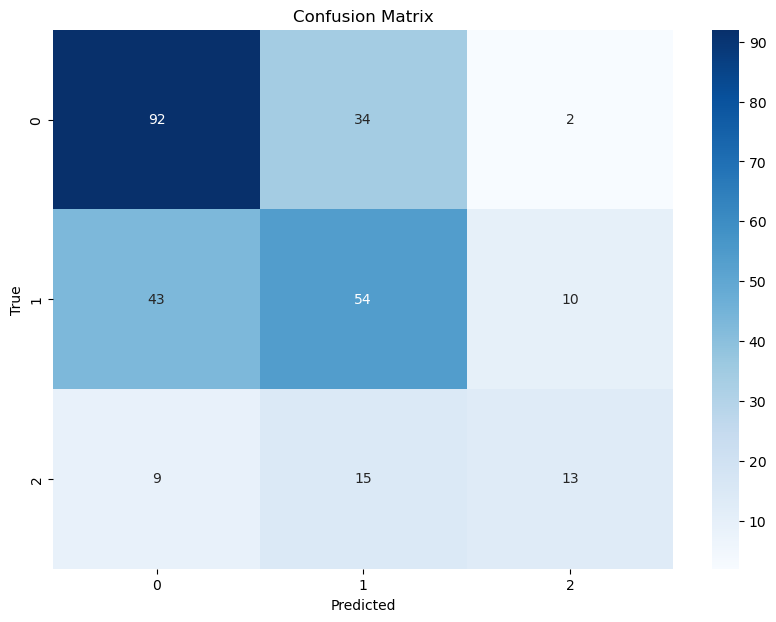

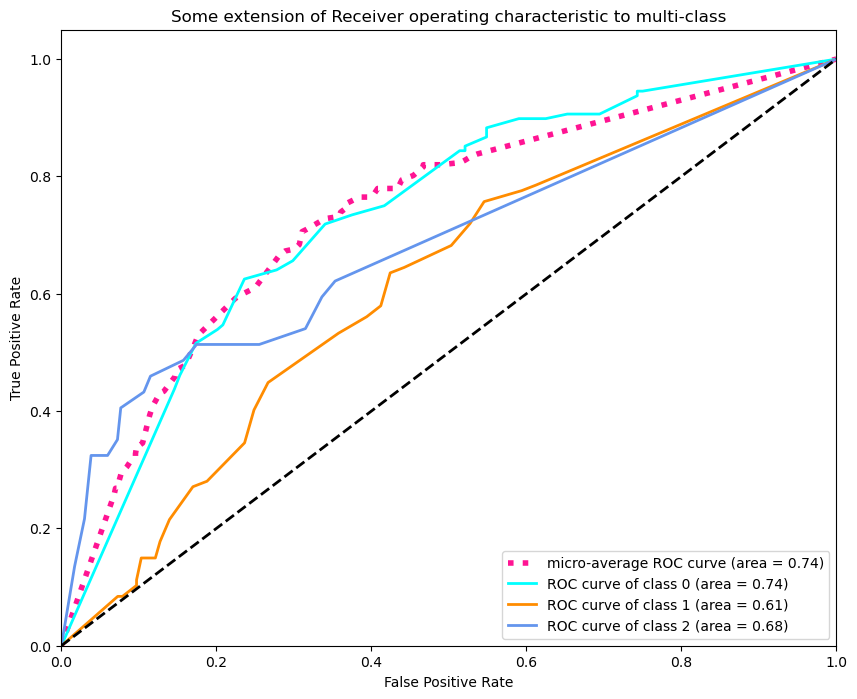

Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.72      0.68       128
           1       0.52      0.50      0.51       107
           2       0.52      0.35      0.42        37

    accuracy                           0.58       272
   macro avg       0.56      0.52      0.54       272
weighted avg       0.58      0.58      0.58       272



(Pipeline(steps=[('dtc',
                  DecisionTreeClassifier(max_depth=8, min_samples_leaf=2,
                                         random_state=42))]),
 '              precision    recall  f1-score   support\n\n           0       0.64      0.72      0.68       128\n           1       0.52      0.50      0.51       107\n           2       0.52      0.35      0.42        37\n\n    accuracy                           0.58       272\n   macro avg       0.56      0.52      0.54       272\nweighted avg       0.58      0.58      0.58       272\n')

In [60]:
model_DecisionTreeClassifier(redWine_pca)

The Decision Tree classifier yielded a cross-validation accuracy of 0.58 when applied to the red wine dataset. Upon examining the classification report, it's evident that the model performed reasonably well across different quality classes. Precision, recall, and F1-score metrics varied across the quality categories, with class 0 (low-quality) demonstrating the highest precision and recall values. However, class 2 (high-quality) exhibited lower precision and recall, indicating challenges in correctly identifying instances of this category. Overall, the model achieved an accuracy of 0.58, suggesting moderate predictive performance. The pipeline configuration, employing a DecisionTreeClassifier with a maximum depth of 8 and a minimum samples leaf of 2, contributed to these results. Further analysis and fine-tuning may be required to enhance the model's performance, particularly for distinguishing between high-quality wines.

#### White Wine

Cross-validation Accuracy: 0.54


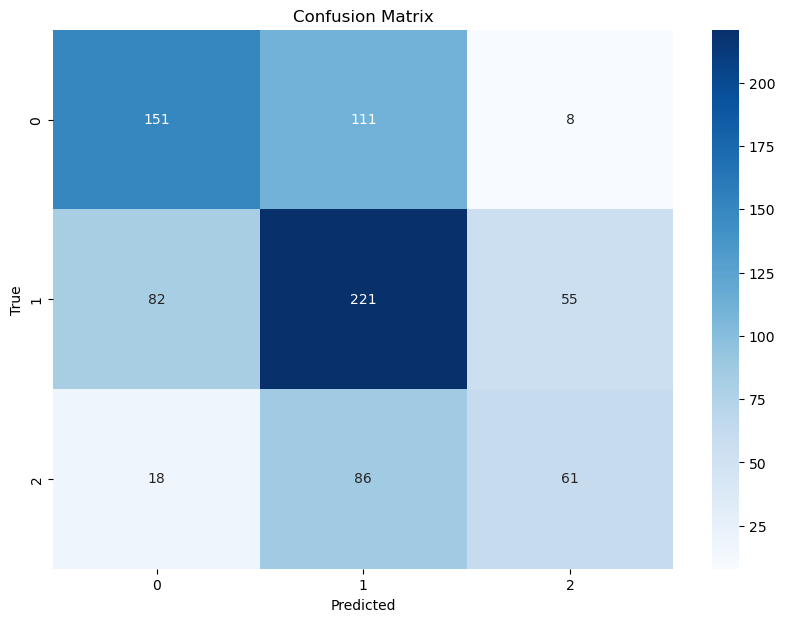

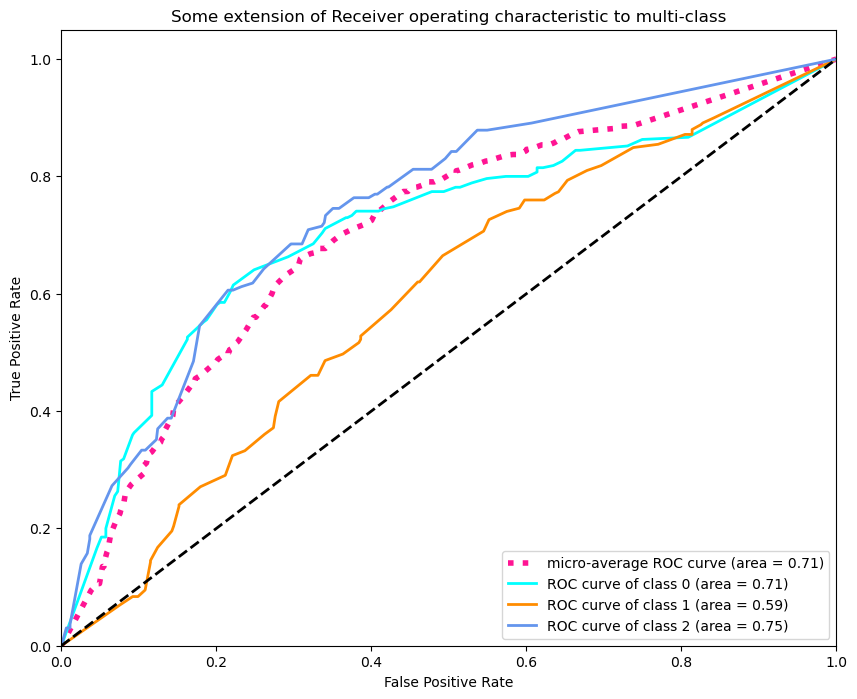

Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.56      0.58       270
           1       0.53      0.62      0.57       358
           2       0.49      0.37      0.42       165

    accuracy                           0.55       793
   macro avg       0.54      0.52      0.52       793
weighted avg       0.55      0.55      0.54       793



(Pipeline(steps=[('dtc',
                  DecisionTreeClassifier(criterion='entropy', max_depth=8,
                                         min_samples_leaf=2, random_state=42))]),
 '              precision    recall  f1-score   support\n\n           0       0.60      0.56      0.58       270\n           1       0.53      0.62      0.57       358\n           2       0.49      0.37      0.42       165\n\n    accuracy                           0.55       793\n   macro avg       0.54      0.52      0.52       793\nweighted avg       0.55      0.55      0.54       793\n')

In [61]:
model_DecisionTreeClassifier(whiteWine_pca)

For the white wine dataset, the Decision Tree classifier achieved a cross-validation accuracy of 0.54. Analyzing the classification report reveals varying performance metrics across different quality classes. Class 1 (medium-quality) exhibited the highest precision and recall values, indicating the model's effectiveness in correctly identifying instances of this category. However, classes 0 (low-quality) and 2 (high-quality) showed slightly lower precision and recall scores, suggesting challenges in accurately classifying these categories. Overall, the model achieved an accuracy of 0.55, implying moderate predictive performance. The pipeline configuration, employing a DecisionTreeClassifier with a maximum depth of 8, a minimum samples leaf of 2, and using entropy as the criterion, contributed to these results. Further refinement and optimization may be necessary to improve the model's ability to distinguish between different quality classes of white wine.

### RandomForestClassifier

In our quest to enhance the predictive accuracy of our wine quality estimation, we adopted the Random Forest Classifier, a choice motivated by its superior capability to handle the complexities inherent in our dataset. The essence of the Random Forest approach lies in its ensemble method, which synergizes the strengths of multiple decision trees to offset their individual biases and prevent overfitting, thereby significantly improving the model's generalization ability. This is achieved by constructing a forest of decision trees, each trained on a randomly selected subset of the dataset and features, and then integrating their individual predictions to produce a more robust and reliable outcome. Such a method proves particularly effective in navigating the intricate relationships between various wine attributes and their impact on quality, offering a deeper understanding and insightful predictions.

To fine-tune the Random Forest Classifier and ensure it performs optimally, we embarked on a meticulous process of hyperparameter optimization. Critical parameters such as the 'min_samples_leaf', set at a minimum of two samples to maintain sufficient data at each leaf node, and 'n_estimators', chosen to be 155 to define the ensemble's size, were carefully selected. Furthermore, we anchored the random state at 42 to guarantee the consistency and reproducibility of our experiments. These hyperparameters were not arbitrarily chosen but were the result of extensive experimentation and tuning, aimed at achieving a delicate balance that would enhance the model's accuracy without compromising its complexity.

To augment this process, we employed GridSearchCV, an exhaustive search technique that systematically evaluates various combinations of hyperparameters within predefined ranges. By doing so, we sought to meticulously calibrate 'n_estimators', 'min_samples_leaf', and 'min_samples_split', among others, to fine-tune the classifier's performance. An integral part of our methodology was the use of stratification in the train-test split, a measure designed to preserve the proportional distribution of wine quality classes across both datasets. This stratification is paramount, ensuring that the predictive model we develop is not only accurate but also generalizable across different datasets, thus facilitating a reliable evaluation of wine quality.

#### Red Wine

Cross-validation Accuracy: 0.63


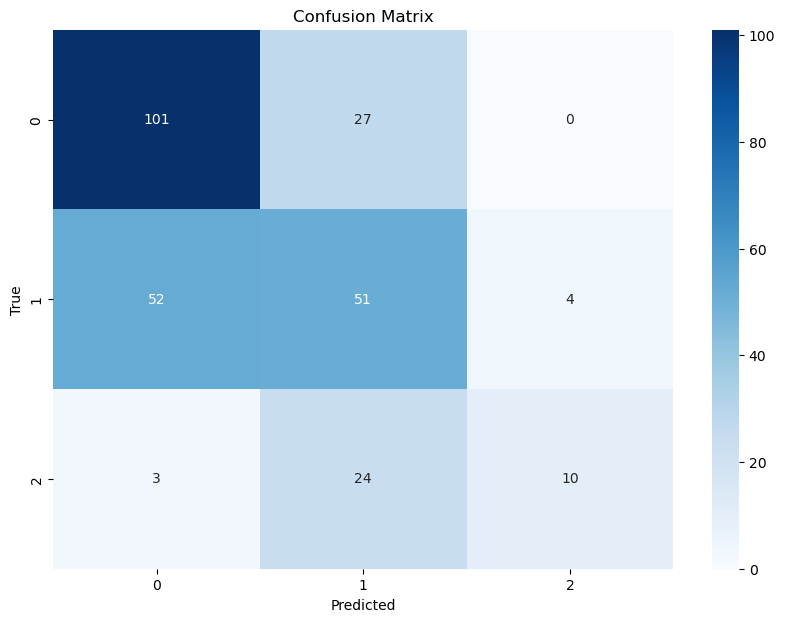

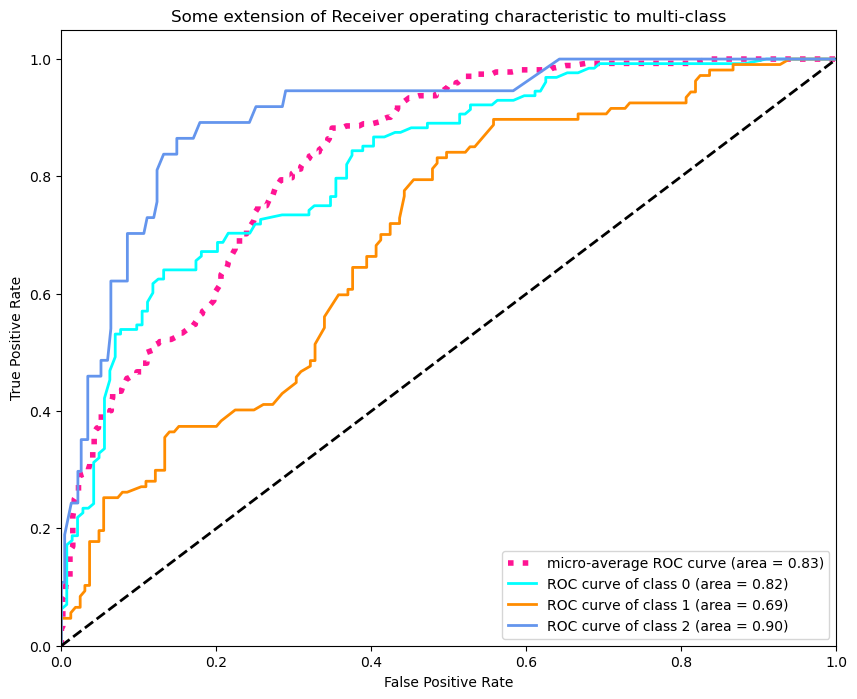

Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.79      0.71       128
           1       0.50      0.48      0.49       107
           2       0.71      0.27      0.39        37

    accuracy                           0.60       272
   macro avg       0.62      0.51      0.53       272
weighted avg       0.60      0.60      0.58       272



(Pipeline(steps=[('rfc',
                  RandomForestClassifier(max_depth=20, n_estimators=175,
                                         random_state=42))]),
 '              precision    recall  f1-score   support\n\n           0       0.65      0.79      0.71       128\n           1       0.50      0.48      0.49       107\n           2       0.71      0.27      0.39        37\n\n    accuracy                           0.60       272\n   macro avg       0.62      0.51      0.53       272\nweighted avg       0.60      0.60      0.58       272\n')

In [62]:
model_RandomForestClassifier(redWine_pca)

The Random Forest classifier applied to the red wine dataset achieved a cross-validation accuracy of 0.63. Upon examining the classification report, we observe varying precision, recall, and F1-score values across the different quality classes. Class 0 (low-quality) exhibited the highest precision and recall, indicating the model's capability to accurately identify instances belonging to this category. Conversely, class 2 (high-quality) showed lower precision and recall scores, suggesting challenges in correctly classifying these instances. The overall accuracy of the model was 0.60, indicating moderate predictive performance. The pipeline configuration utilized a RandomForestClassifier with a maximum depth of 20 and 175 estimators, contributing to these results. Further optimization and fine-tuning may be necessary to enhance the model's performance, particularly in accurately identifying high-quality red wines.

#### White Wine

Cross-validation Accuracy: 0.61


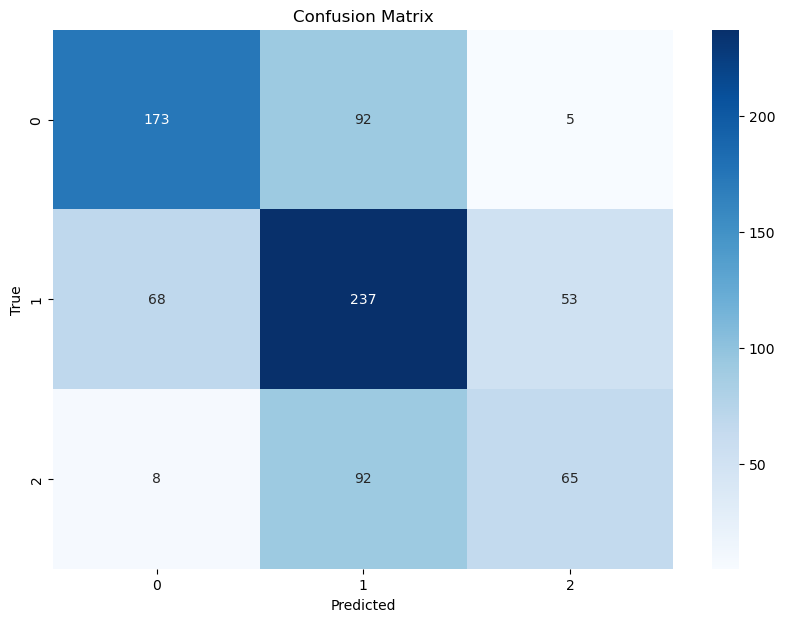

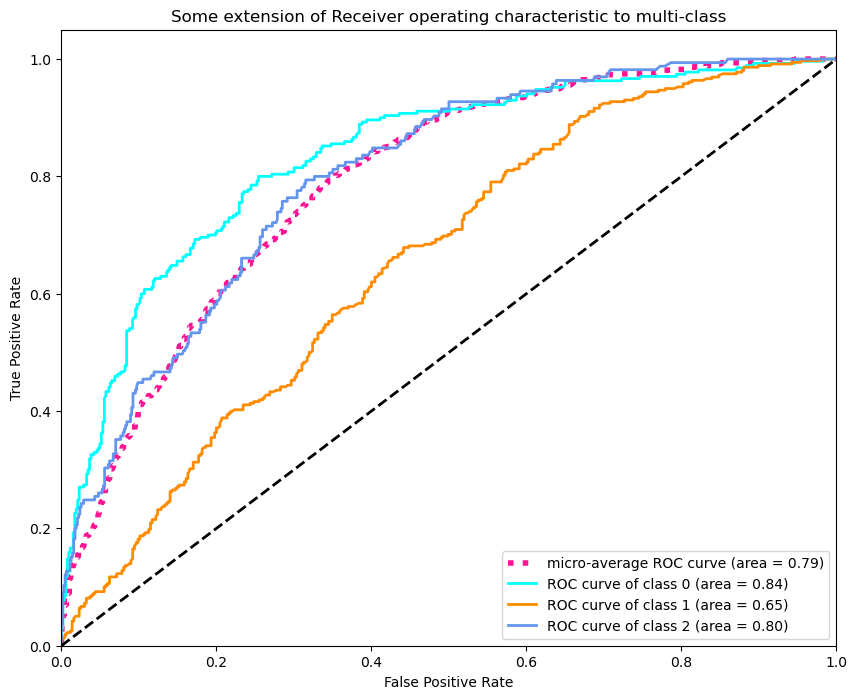

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.67       270
           1       0.56      0.66      0.61       358
           2       0.53      0.39      0.45       165

    accuracy                           0.60       793
   macro avg       0.60      0.57      0.58       793
weighted avg       0.60      0.60      0.60       793



(Pipeline(steps=[('rfc',
                  RandomForestClassifier(criterion='entropy',
                                         min_samples_split=3, n_estimators=175,
                                         random_state=42))]),
 '              precision    recall  f1-score   support\n\n           0       0.69      0.64      0.67       270\n           1       0.56      0.66      0.61       358\n           2       0.53      0.39      0.45       165\n\n    accuracy                           0.60       793\n   macro avg       0.60      0.57      0.58       793\nweighted avg       0.60      0.60      0.60       793\n')

In [63]:
model_RandomForestClassifier(whiteWine_pca)

The Random Forest classifier applied to the white wine dataset achieved a cross-validation accuracy of 0.61. Upon examination of the classification report, we note varying precision, recall, and F1-score values across the different quality classes. Class 0 (low-quality) exhibited the highest precision and recall, indicating the model's ability to accurately identify instances belonging to this category. However, class 2 (high-quality) showed lower precision and recall scores, suggesting challenges in correctly classifying these instances. The overall accuracy of the model was 0.60, indicating moderate predictive performance. The pipeline configuration utilized a RandomForestClassifier with a criterion of entropy, a minimum samples split of 3, and 175 estimators, contributing to these results. Further optimization and fine-tuning may be necessary to enhance the model's performance, particularly in accurately identifying high-quality white wines.

### SGDClassifier

In our exploration of predictive models for wine quality, the Stochastic Gradient Descent (SGD) Classifier emerged as a pivotal addition to our toolkit, particularly valued for its adeptness in handling the challenges presented by large-scale datasets and sparse data. The inherent capacity of the SGD Classifier to efficiently manage classification tasks, especially those characterized by substantial sample sizes or extensive feature dimensions, made it an exemplary choice for analyzing the multifaceted chemical attributes of wine. Employing the principles of stochastic gradient descent optimization, this classifier stands out for its iterative update of model parameters, utilizing small, manageable subsets of the training data. This methodology not only underscores the model’s computational efficiency but also its remarkable scalability, making it exceptionally suitable for processing extensive datasets.

The core objective of the SGD Classifier is to optimize a linear model through gradient descent meticulously, with the aim to identify the most fitting decision boundary that effectively segregates different wine quality classes. This rigorous optimization process significantly boosts the prediction accuracy, thereby enhancing the overall evaluation of model performance and contributing to the reliability of wine quality predictions. A cornerstone of our approach to refining the SGD Classifier was the strategic deployment of GridSearchCV for hyperparameter optimization. This entailed a thorough evaluation of the impact of diverse 'penalty' types, varying 'alpha' values to modulate regularization strength, and distinct 'learning_rate' strategies on the classifier’s operational efficiency. Our goal through this analytical process was to pinpoint the optimal configurations that harmonize model accuracy with its generalization capabilities across unseen datasets.

Crucial to the integrity of our model's evaluation metrics is the stratified sampling approach adopted during the dataset splitting phase, ensuring a balanced representation of classes in both training and test datasets. This meticulous attention to maintaining class distribution equity was further augmented by the comprehensive hyperparameter testing facilitated by GridSearchCV. Our exploration spanned a wide array of hyperparameters, including the selection of 'penalty' types such as L2, L1, and ElasticNet, and the careful calibration of 'alpha' values for precise regularization control. Moreover, the investigation into 'learning_rate' strategies was aimed at optimizing the model parameter updates throughout the training process, a pivotal step towards achieving an optimal balance between the model’s complexity and its generalization aptitude.

By integrating GridSearchCV for exhaustive hyperparameter tuning with a conscientious stratified split of the dataset, our endeavor was to sculpt an SGD Classifier not merely proficient in delivering high performance on training data but also endowed with the robustness essential for extending its predictive accuracy to new, unseen data. This holistic approach underscores our commitment to developing a model that consistently provides reliable wine quality predictions across varied samples, a testament to our rigorous and thoughtful methodology.

#### Red Wine

Cross-validation Accuracy: 0.80


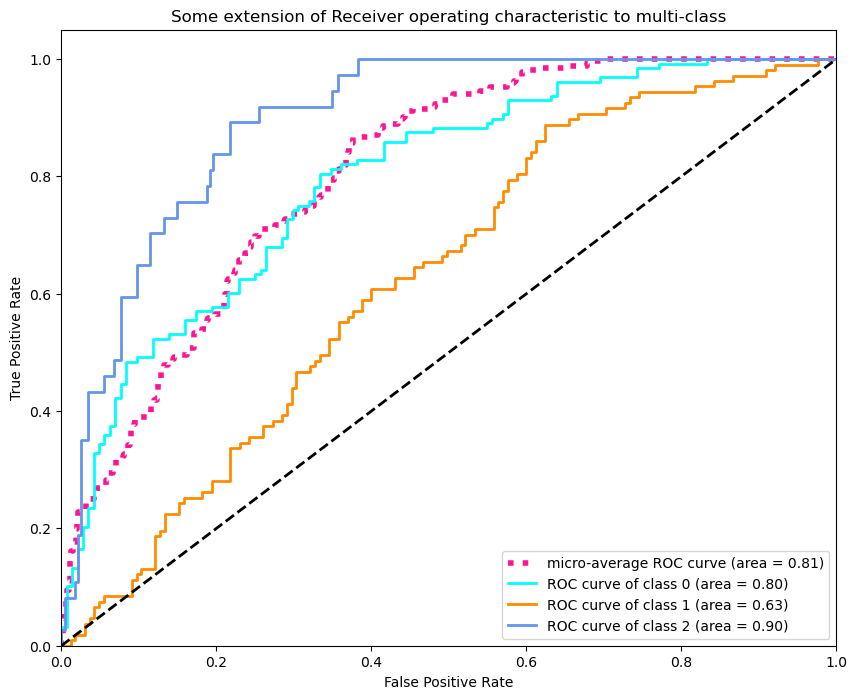

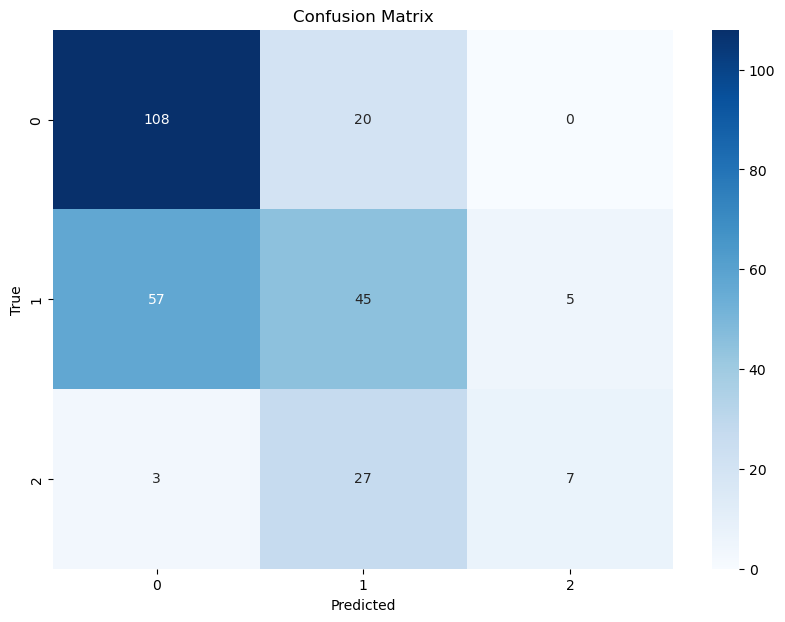

Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.84      0.73       128
           1       0.49      0.42      0.45       107
           2       0.58      0.19      0.29        37

    accuracy                           0.59       272
   macro avg       0.57      0.48      0.49       272
weighted avg       0.57      0.59      0.56       272



In [80]:
redWineSGD_model, redWineSGD_report = model_SGDClassifier(redWine_pca)

The Stochastic Gradient Descent (SGD) classifier applied to the red wine dataset yielded a cross-validation accuracy of 0.80, indicating robust performance in generalizing to unseen data. The classification report reveals the model's precision, recall, and F1-score across different quality categories. For class 0 (low-quality), the model achieved a precision of 0.64 and a recall of 0.84, indicating a strong ability to correctly identify instances of low-quality red wine. Class 1 (medium-quality) exhibited a balanced precision-recall trade-off, with values of 0.49 and 0.42, respectively, suggesting moderate performance in identifying medium-quality instances. Class 2 (high-quality) showed lower precision and recall values, indicative of the model's challenge in correctly classifying instances of high-quality red wine. Despite this, the overall accuracy of the model was 0.59, reflecting its ability to make accurate predictions across all quality categories. These results underscore the effectiveness of the SGD classifier in discerning the quality of red wine based on chemical attributes.

#### White Wine

Cross-validation Accuracy: 0.93


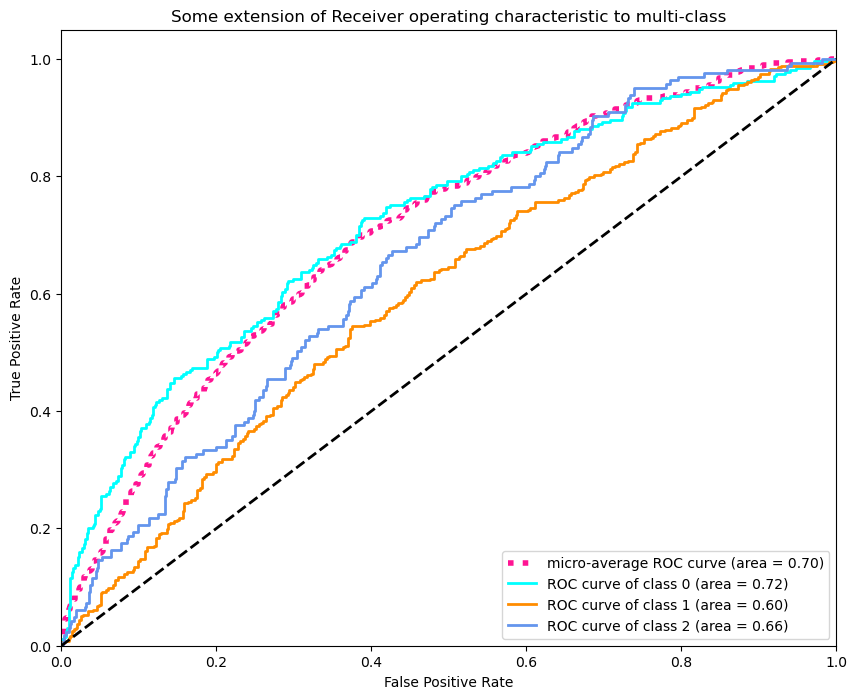

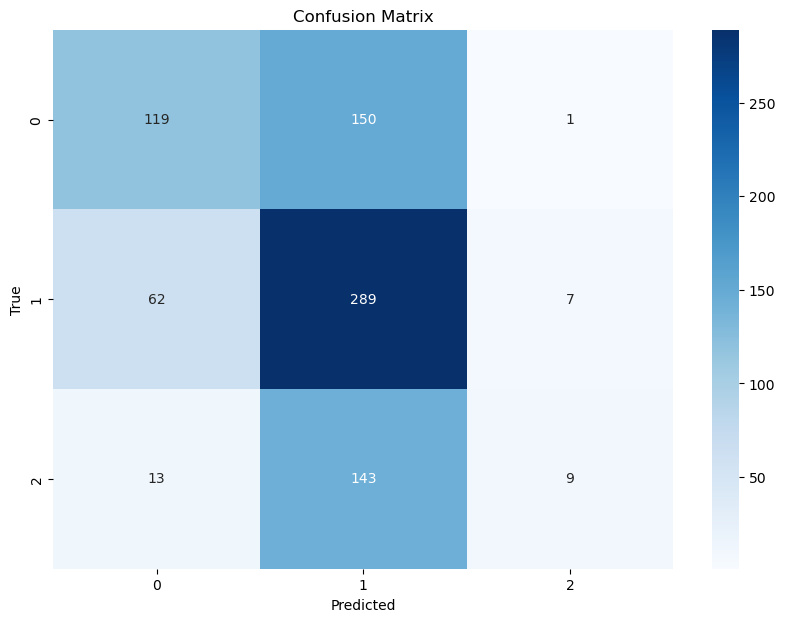

Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.44      0.51       270
           1       0.50      0.81      0.61       358
           2       0.53      0.05      0.10       165

    accuracy                           0.53       793
   macro avg       0.55      0.43      0.41       793
weighted avg       0.54      0.53      0.47       793



In [81]:
whiteWineSGD_model, whiteWineSGD_report = model_SGDClassifier(whiteWine_pca)

The Stochastic Gradient Descent (SGD) classifier applied to the white wine dataset demonstrated a high cross-validation accuracy of 0.93, indicating strong performance in generalizing to unseen data. However, the classification report reveals varying precision, recall, and F1-score values across different quality categories. For class 0 (low-quality), the model achieved a precision of 0.61 and a recall of 0.44, indicating its ability to correctly identify instances of low-quality white wine, albeit with some misclassifications. Class 1 (medium-quality) exhibited higher precision and recall values, suggesting better performance in identifying medium-quality instances. However, class 2 (high-quality) had substantially lower precision and recall values, indicating challenges in correctly classifying instances of high-quality white wine. Despite the high overall accuracy, the model's performance is less balanced across quality categories, suggesting potential areas for improvement in accurately predicting the quality of white wine based on chemical attributes.


### Support Vector Classifier

In our analytical journey to predict wine quality, we turned to the Support Vector Classifier (SVC) for its unparalleled proficiency with high-dimensional data and adeptness at navigating both binary and multiclass classification tasks. The cornerstone of the SVC's approach is its pursuit of an optimal hyperplane, a strategy aimed at maximizing the margin between differing quality classes to bolster the model’s generalization capabilities and fortify its robustness. This is particularly invaluable in the context of our dataset, which is characterized by complex decision boundaries and overlapping classes. The SVC's ability to discern the most discriminative features that categorize wines into distinct quality brackets is instrumental, leveraging the data's structural nuances and employing kernel tricks to artfully transform the feature space. This not only augments our comprehension of the nuanced interplay between various wine attributes and their impact on quality ratings but also significantly refines the accuracy and depth of our predictions.

The implementation phase saw us adopting a streamlined pipeline designed to optimize the preprocessing and training processes, comprising two principal components: standard scaling and the SVC classifier. The introduction of standard scaling was a calculated move to normalize feature scales, thereby ensuring no single attribute disproportionately influenced the model due to variance in magnitude. In configuring the SVC classifier, we meticulously selected hyperparameters that promise to optimize performance, including setting the regularization parameter (C) to 10 to delicately balance the dual objectives of margin maximization and classification error minimization. The degree of the polynomial kernel function was set to 2, a decision reflecting our intent to harness polynomial kernels for non-linear classification without overly complicating the model. Additionally, enabling probability estimation by activating the probability parameter allowed the SVC not just to predict but also to provide probabilities for various classes, thereby enriching the decision-making process. To guarantee consistency and reproducibility in our findings, we anchored the random state at 42.

To fine-tune these carefully chosen settings, we engaged GridSearchCV in an exhaustive exploration across a vast spectrum of values for 'C', diverse 'kernel' types including 'linear', 'poly', 'rbf', and 'sigmoid', 'gamma' for adjusting the kernel coefficient, and 'degree' for the polynomial kernels. This comprehensive hyperparameter tuning was a deliberate strategy aimed at navigating the SVC's complexity and honing its generalization prowess, culminating in a significant uplift in predictive accuracy. The stratification of our data during the splitting phase was a critical element, ensuring a consistent representation of wine quality classes across both the training and test sets. This careful consideration is pivotal, as it safeguards the fairness and accuracy of the model’s performance evaluation, thus underpinning the reliability and credibility of our predictions.

#### Red Wine

Cross-validation Accuracy: 0.65


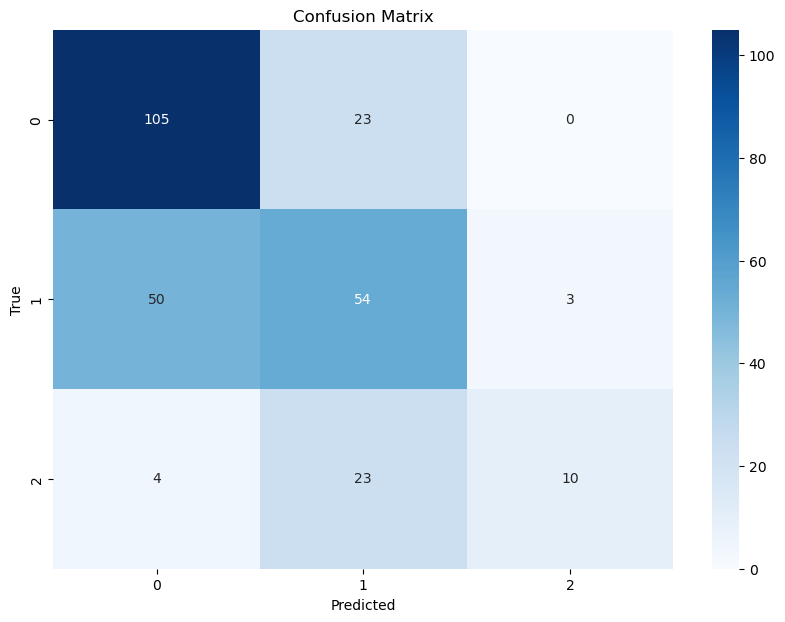

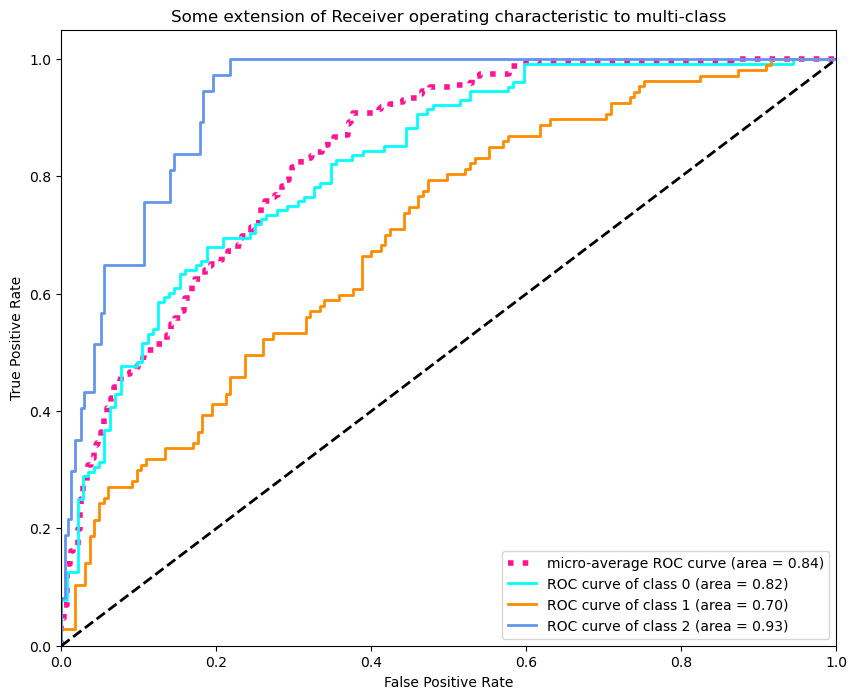

Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.82      0.73       128
           1       0.54      0.50      0.52       107
           2       0.77      0.27      0.40        37

    accuracy                           0.62       272
   macro avg       0.66      0.53      0.55       272
weighted avg       0.63      0.62      0.60       272



(Pipeline(steps=[('scaler', StandardScaler()),
                 ('svc', SVC(C=1, degree=2, probability=True, random_state=42))]),
 '              precision    recall  f1-score   support\n\n           0       0.66      0.82      0.73       128\n           1       0.54      0.50      0.52       107\n           2       0.77      0.27      0.40        37\n\n    accuracy                           0.62       272\n   macro avg       0.66      0.53      0.55       272\nweighted avg       0.63      0.62      0.60       272\n')

In [66]:
model_SVCClassifier(redWine)

The Support Vector Classifier (SVC) applied to the red wine dataset yielded promising results, as indicated by a cross-validation accuracy of 0.65. The classification report further elucidates the model's performance across different quality classes. Class 0 (low-quality) exhibited commendable precision and recall, suggesting the model's ability to accurately identify instances belonging to this category. Class 1 (medium-quality) demonstrated slightly lower precision and recall values, indicating some difficulty in correctly classifying these instances. Notably, class 2 (high-quality) showcased the highest precision and recall, suggesting robust performance in identifying instances of high-quality red wine. The overall accuracy of the model was 0.62, indicative of its ability to make accurate predictions across all quality categories. The utilization of a pipeline incorporating standard scaling and the SVC classifier facilitated the model's training and improved its predictive performance. These results underscore the efficacy of the SVC approach in discerning the quality of red wine based on chemical attributes.

#### White Wine

Cross-validation Accuracy: 0.61


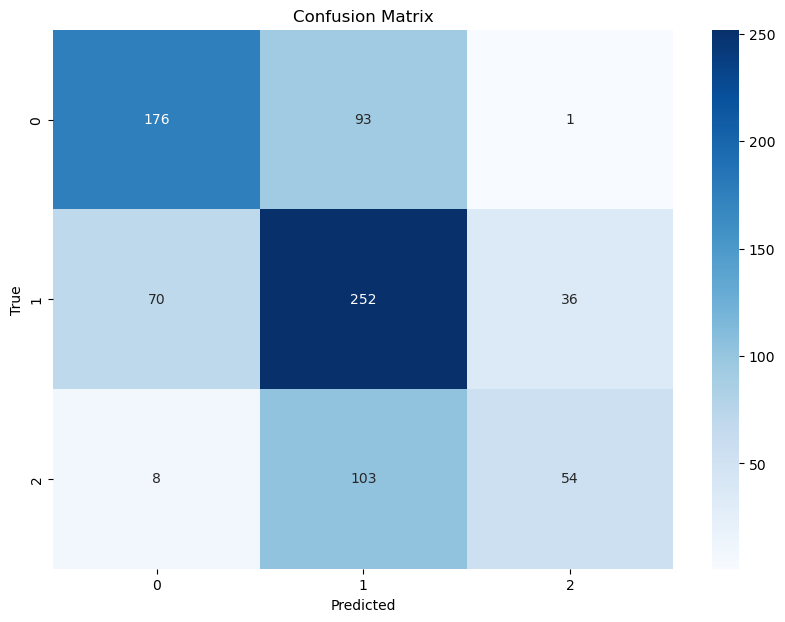

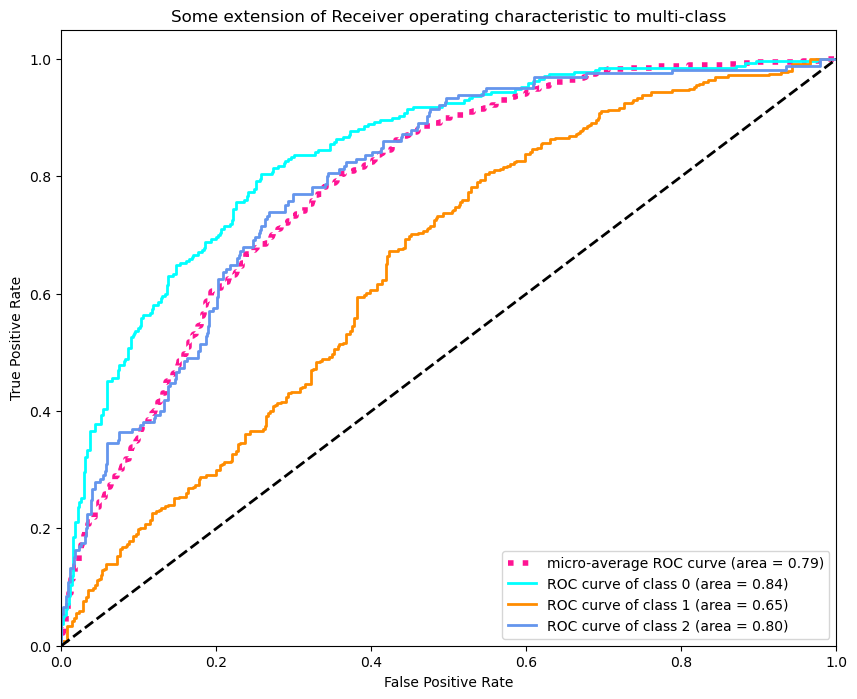

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.65      0.67       270
           1       0.56      0.70      0.63       358
           2       0.59      0.33      0.42       165

    accuracy                           0.61       793
   macro avg       0.62      0.56      0.57       793
weighted avg       0.61      0.61      0.60       793



(Pipeline(steps=[('scaler', StandardScaler()),
                 ('svc', SVC(C=1, degree=2, probability=True, random_state=42))]),
 '              precision    recall  f1-score   support\n\n           0       0.69      0.65      0.67       270\n           1       0.56      0.70      0.63       358\n           2       0.59      0.33      0.42       165\n\n    accuracy                           0.61       793\n   macro avg       0.62      0.56      0.57       793\nweighted avg       0.61      0.61      0.60       793\n')

In [67]:
model_SVCClassifier(whiteWine)

The Support Vector Classifier (SVC) applied to the white wine dataset achieved a cross-validation accuracy of 0.61, indicating its ability to generalize well to unseen data. The classification report reveals the model's performance across different quality categories. Class 0 (low-quality) exhibited a precision of 0.69 and a recall of 0.65, suggesting the model's capability to accurately identify instances of low-quality white wine. Similarly, class 1 (medium-quality) demonstrated a balanced precision-recall trade-off, with values of 0.56 and 0.70, respectively, indicating satisfactory performance in identifying medium-quality instances. Class 2 (high-quality) showcased lower precision and recall values, indicative of the model's challenge in correctly classifying instances of high-quality white wine. Nevertheless, the overall accuracy of the model was 0.61, reflecting its ability to make accurate predictions across all quality categories. The pipeline comprising standard scaling and the SVC classifier facilitated efficient model training and enhanced predictive performance. These results underscore the efficacy of the SVC approach in discerning the quality of white wine based on chemical attributes.

### Main insights (connected to business)

Look at report.